# Seasonality Analysis

In [1]:
import warnings
warnings.filterwarnings("ignore")


In [2]:
# Import neccessary libraries
import pandas as pd
import matplotlib.pyplot as plt
from statsmodels.tsa.seasonal import seasonal_decompose
from statsmodels.tsa.arima.model import ARIMA
from sklearn.metrics import mean_squared_error
import numpy as np
import seaborn as sns
from statsmodels.tsa.seasonal import seasonal_decompose
from statsmodels.tsa.stattools import adfuller
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf


In [3]:
# Loading the dataset
file_path = 'metroregion_filtered_data.csv'
city_df = pd.read_csv(file_path)

## Seasonal Plots

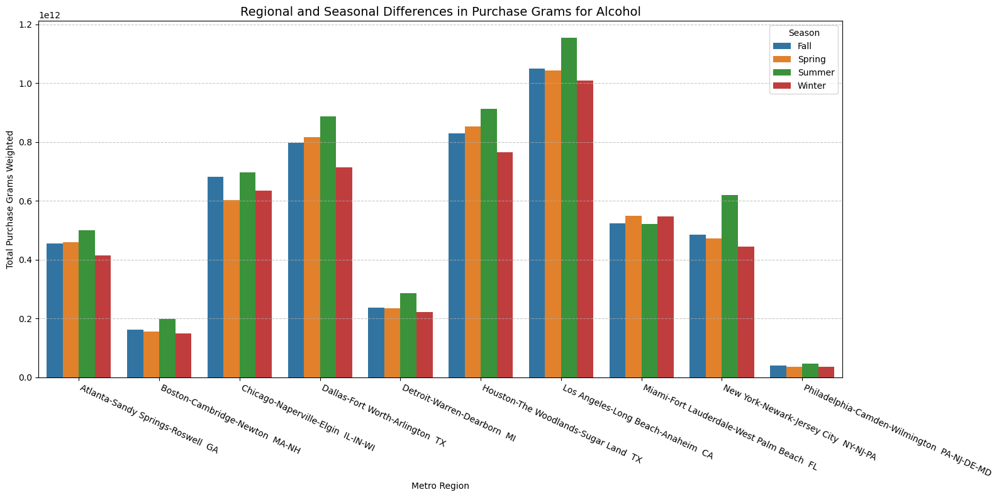

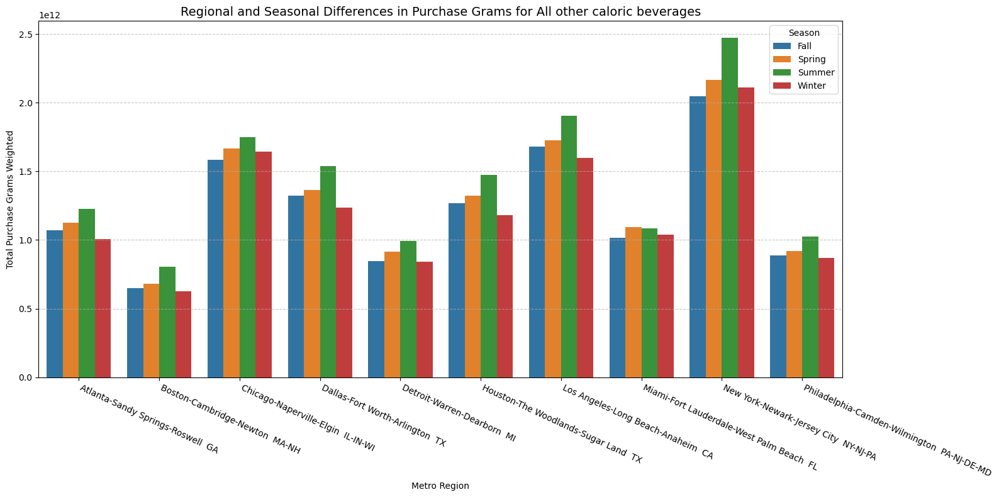

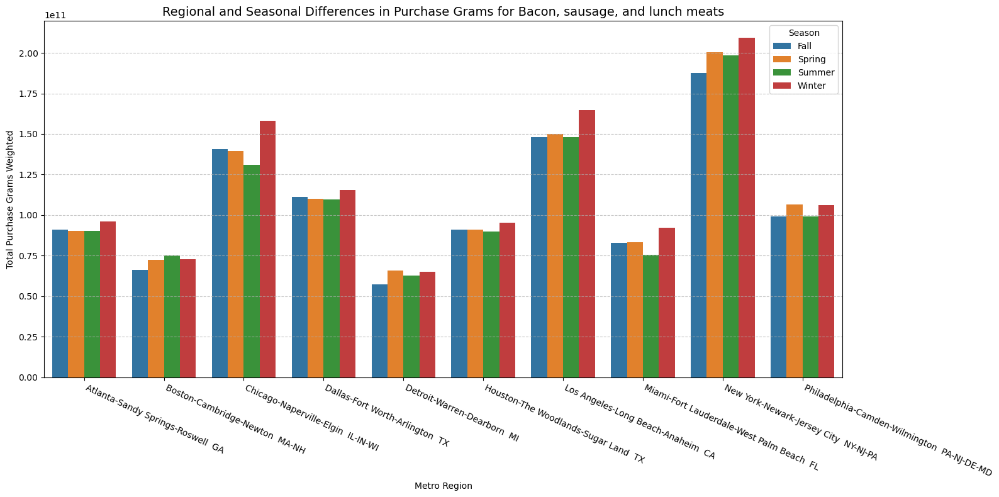

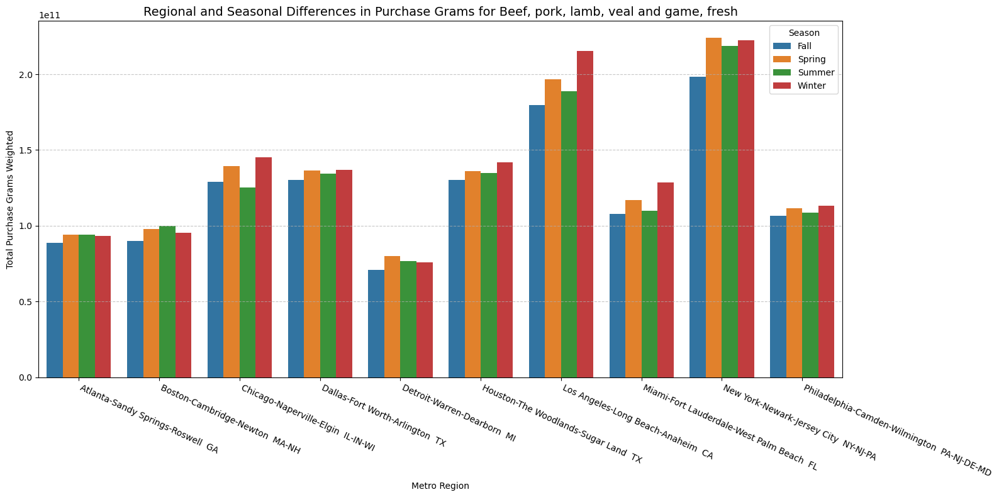

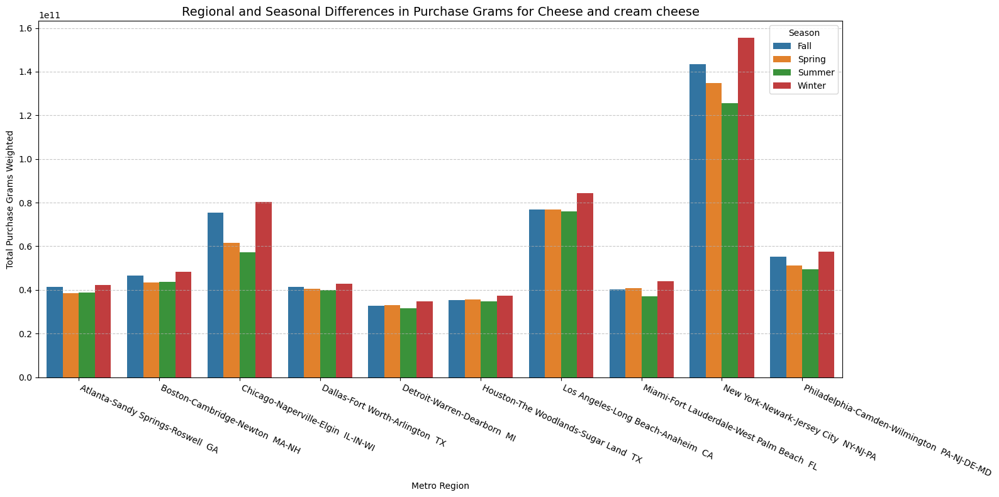

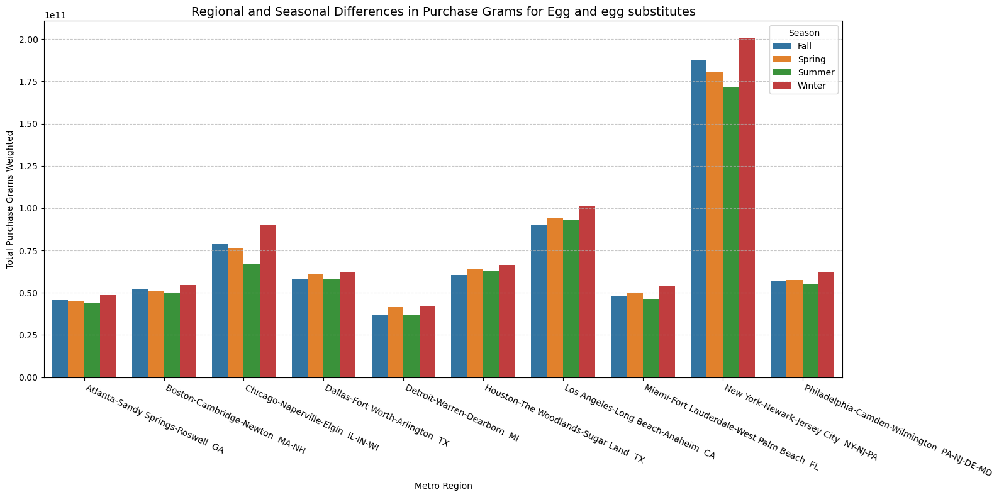

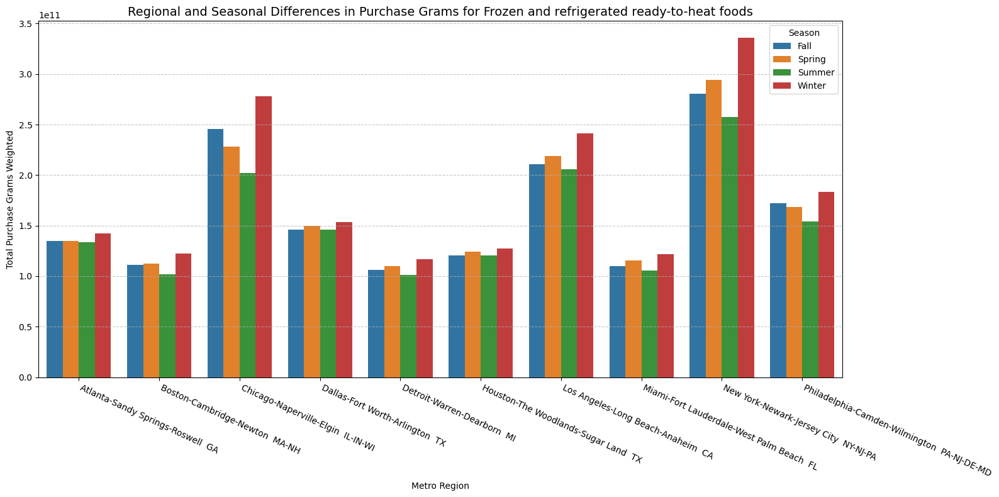

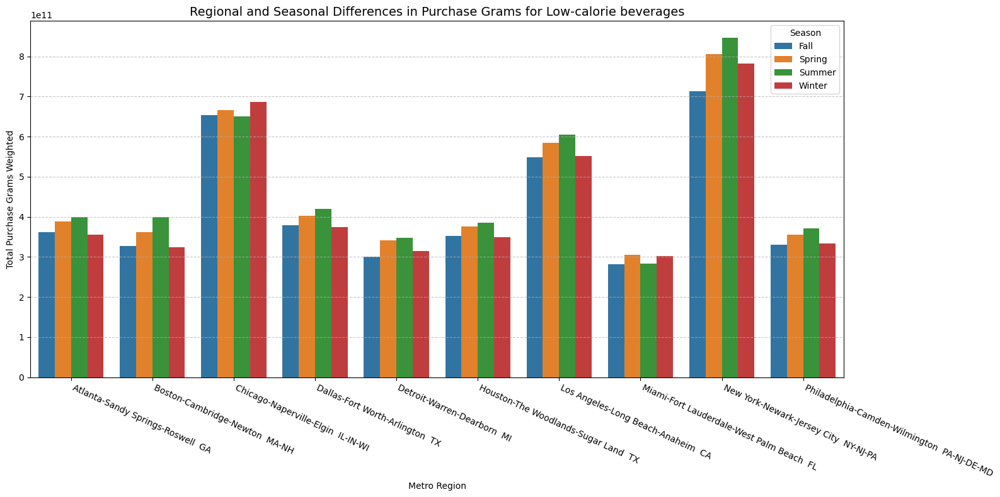

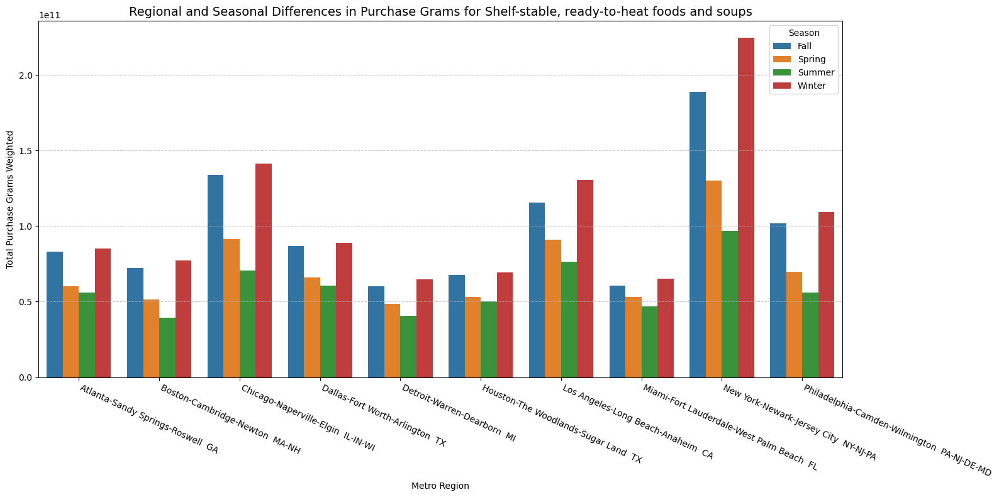

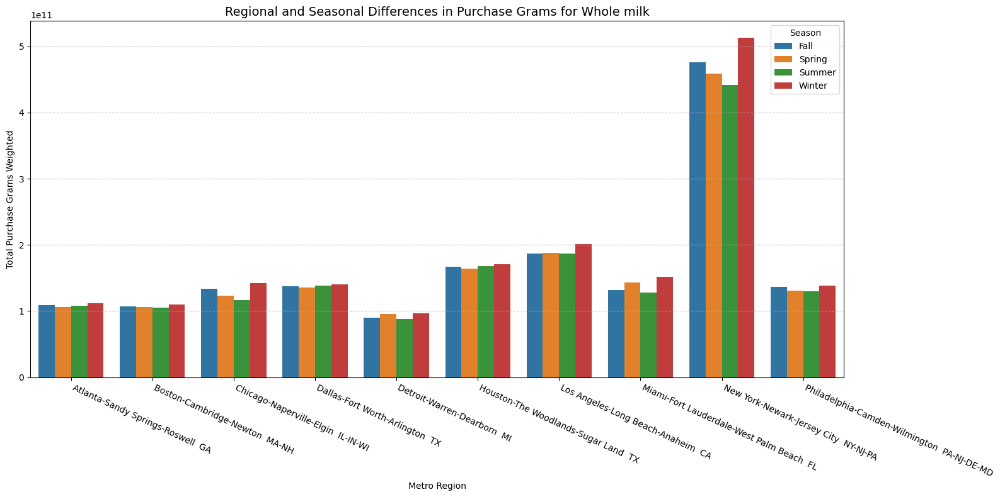

In [4]:
# Convert 'Year' and 'Month' to a single 'Date' column
city_df['Date'] = pd.to_datetime(city_df[['Year', 'Month']].assign(Day=1))

# Assigning seasons based on the month
def assign_season(month):
    if month in [12, 1, 2]:
        return 'Winter'
    elif month in [3, 4, 5]:
        return 'Spring'
    elif month in [6, 7, 8]:
        return 'Summer'
    elif month in [9, 10, 11]:
        return 'Fall'

city_df['Season'] = city_df['Date'].dt.month.apply(assign_season)

# Group by EFPG_name, Metroregion_name, and Season
all_efpg_grouped = city_df.groupby(['EFPG_name', 'Metroregion_name', 'Season'])['Purchase_grams_wtd'].sum().reset_index()

# Loop through each EFPG_name to create grouped bar charts
for efpg_name in all_efpg_grouped['EFPG_name'].unique():
    efpg_data = all_efpg_grouped[all_efpg_grouped['EFPG_name'] == efpg_name]
    
    # Plot grouped bar chart
    plt.figure(figsize=(16, 8))
    sns.barplot(data=efpg_data, x='Metroregion_name', y='Purchase_grams_wtd', hue='Season', ci=None)
    plt.title(f"Regional and Seasonal Differences in Purchase Grams for {efpg_name}", fontsize=14)
    plt.xlabel("Metro Region")
    plt.ylabel("Total Purchase Grams Weighted")
    plt.xticks(rotation=-25,ha='left')
    plt.legend(title="Season", loc='upper right', fontsize=10)
    plt.grid(axis='y', linestyle='--', alpha=0.7)
    plt.tight_layout()
    plt.show()


**Alcohol:**
- High demand in **Summer**, driven by holidays and celebrations.
- Relatively lower volumes in **Winter** and **Spring**.
- **Los Angeles-Long Beach-Anaheim-CA** consistently shows the highest demand.

**All Other Caloric Beverages:**
- Peaks in **Summer**, reflecting increased outdoor activities and heat-related consumption.
- Moderate demand in other seasons.
- **New York-Newark-Jersey City NY-NJ-PA** leads in purchases because of its higher population.
- Other notable regions: **Chicago-Naperville-Elgin IL-IN-WI**.

**Bacon, Sausage, and Lunch Meats:**
- High demand in **Winter**, suggesting increased usage in hearty breakfasts and comfort foods.
- Lower demand during **Summer**, possibly due to fewer cooked meals at home.

**Beef, Pork, Lamb, Veal, and Game (Fresh):**
- Steady demand during other seasons, with slight dips in **Fall**.
- Higher demand during holidays and colder months for roasts and stews.

**Cream and Cream Cheese:**
- Consistent demand year-round, with a notable peak in **Winter**.
- High Winter demand may be tied to holiday cooking, baking, and comfort foods.

**Low-Calorie Beverages:**
- Increased focus on health and hydration during hot weather.
- Noticeable **Summer** peaks.

**Eggs and Egg Substitutes:**
- Peaks in **Spring** and **Fall**, apart from **Winter**, correlating with holiday cooking and baking activities.

**Frozen and Refrigerated Ready-to-Heat Foods:**
- Increased demand for convenient meal options during **colder months**.

**Shelf-Stable, Ready-to-Heat Foods and Soups:**
- Strong **Winter** demand, with lower levels during warmer seasons.
- Cold weather drives increased soup consumption and shelf-stable meal options.

**Whole Milk:**
- Noticeable **Winter** peaks, with consistent demand throughout other seasons.
- High demand in Winter suggests usage in hot beverages, increased cooking, and baking at home.


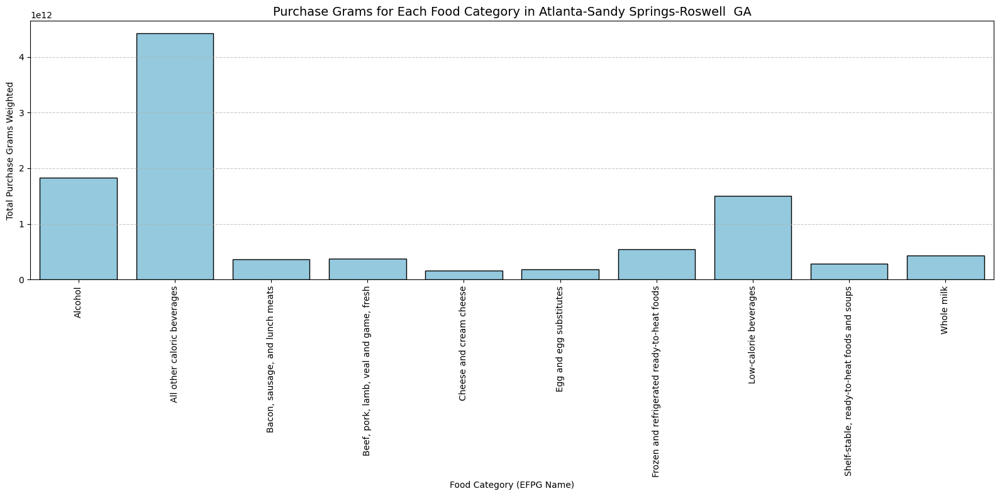

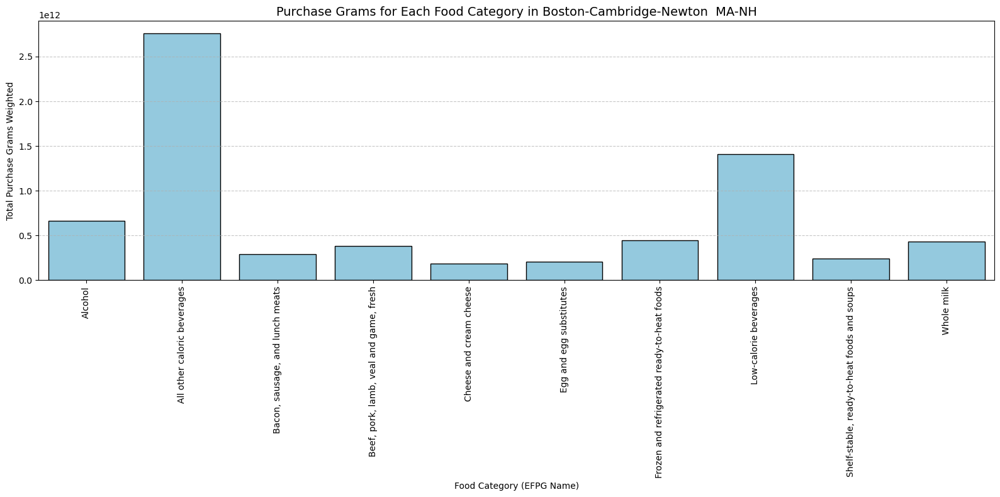

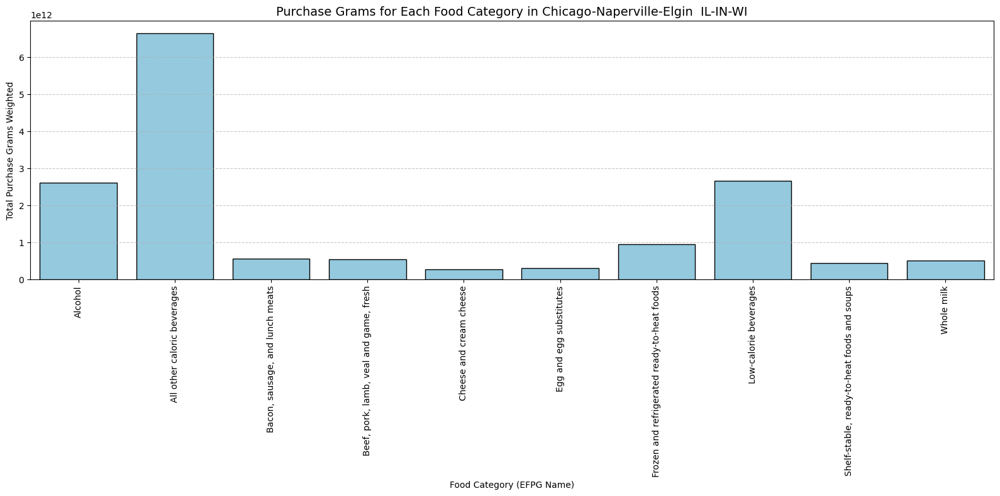

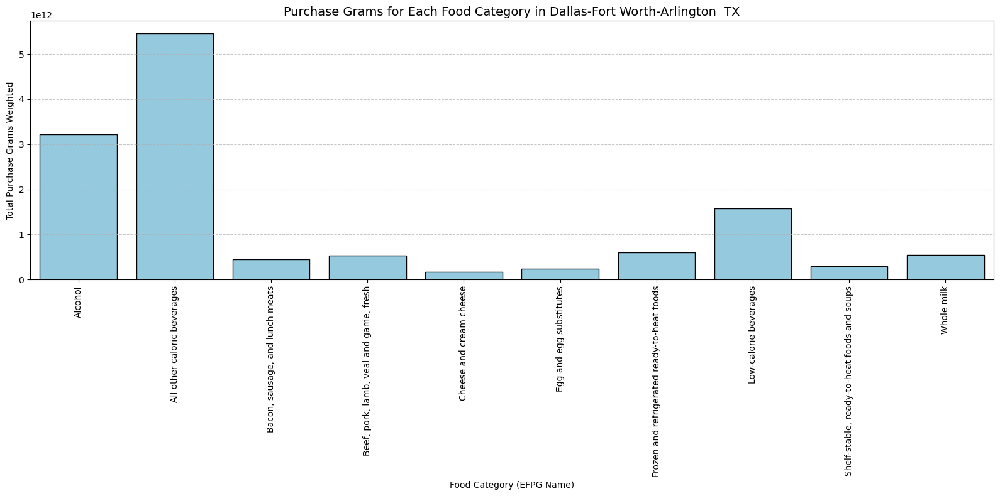

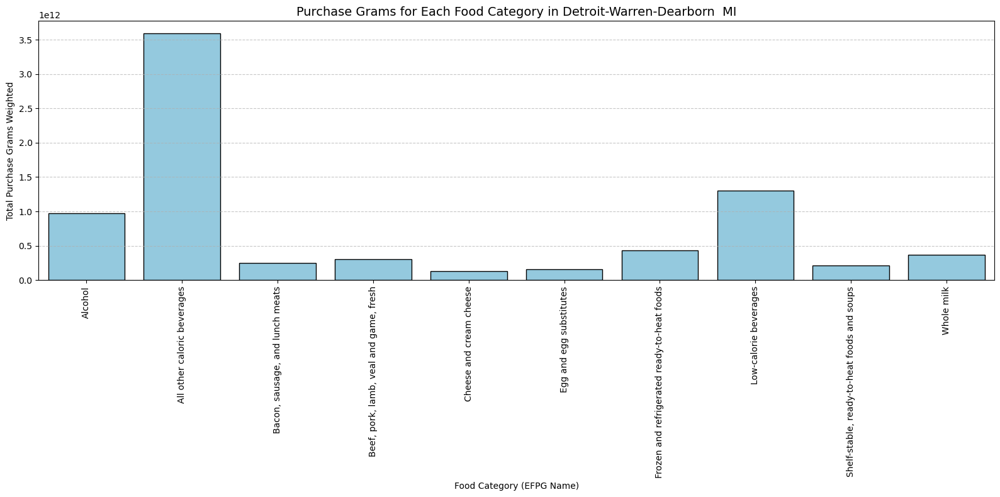

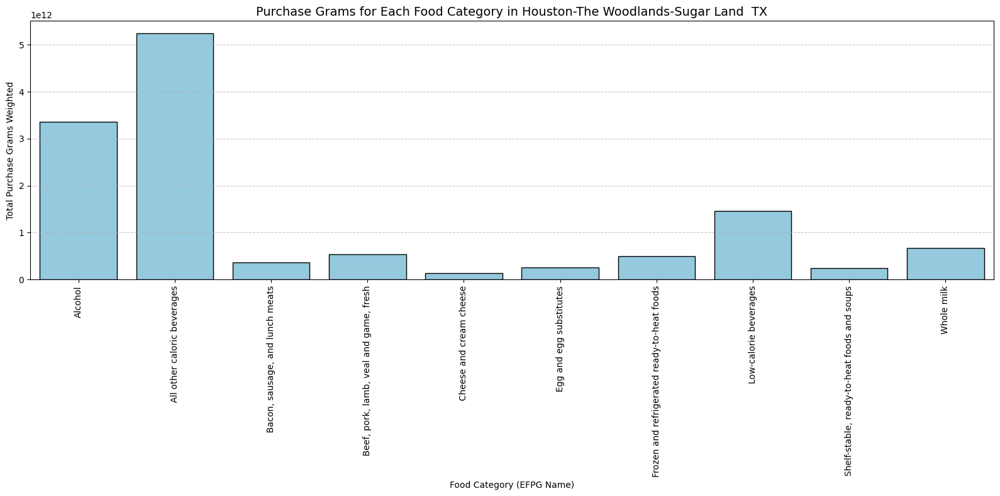

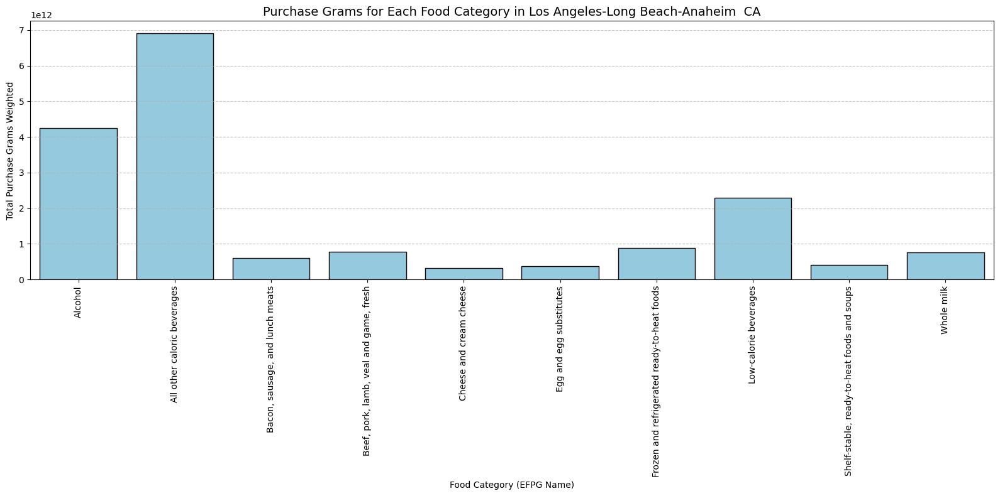

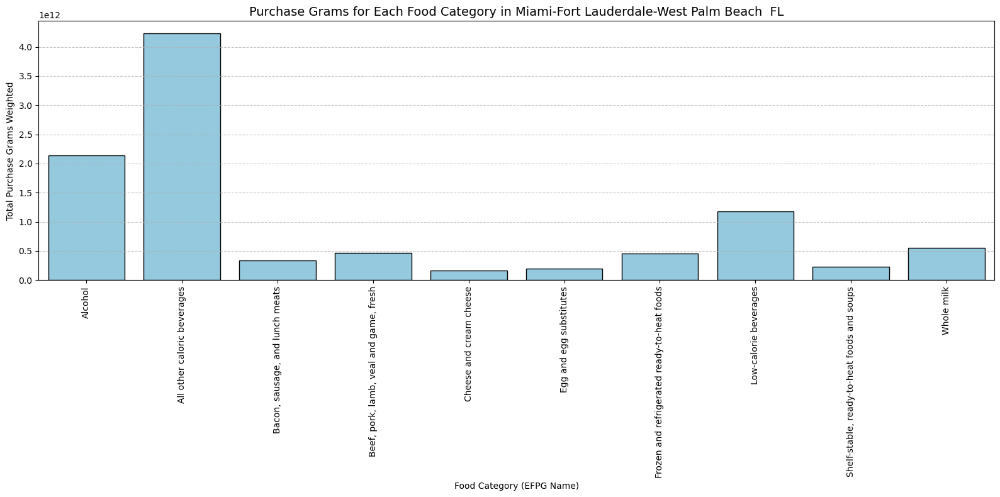

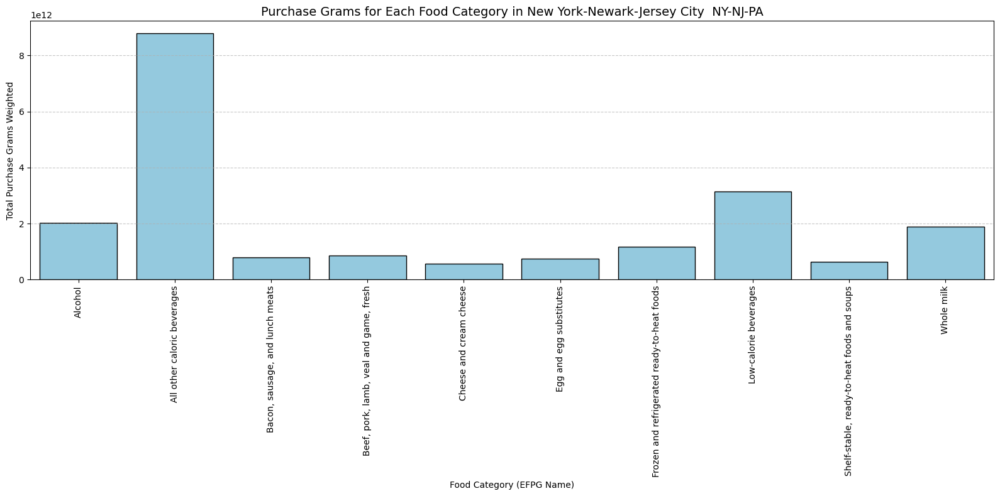

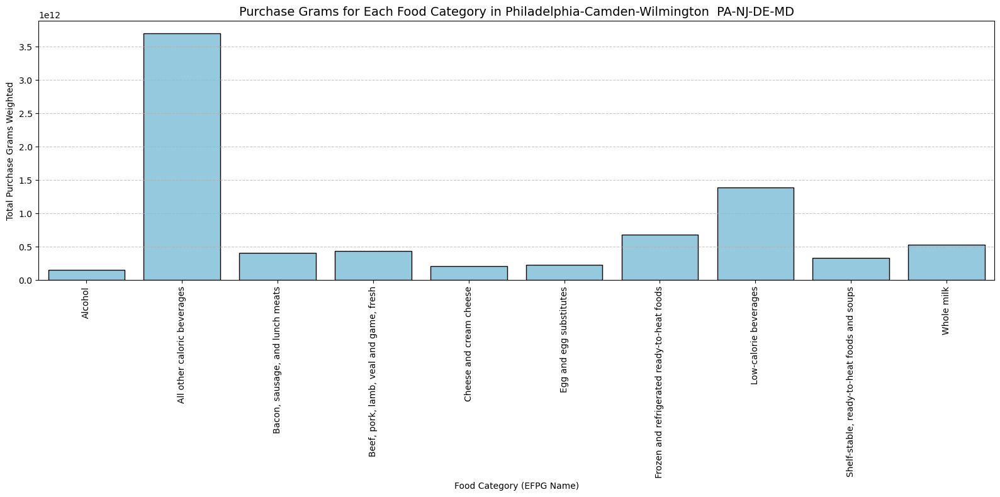

In [5]:
# Grouping the data by Metroregion_name and EFPG_name
metro_efpg_data = city_df.groupby(['Metroregion_name', 'EFPG_name'])['Purchase_grams_wtd'].sum().reset_index()

# Plotting a bar chart for each Metroregion_name
for metro_name in metro_efpg_data['Metroregion_name'].unique():
    metro_data = metro_efpg_data[metro_efpg_data['Metroregion_name'] == metro_name]
    
    plt.figure(figsize=(16, 8))
    sns.barplot(data=metro_data, x='EFPG_name', y='Purchase_grams_wtd', ci=None, color='skyblue', edgecolor='black')
    plt.title(f"Purchase Grams for Each Food Category in {metro_name}", fontsize=14)
    plt.xlabel("Food Category (EFPG Name)")
    plt.ylabel("Total Purchase Grams Weighted")
    plt.xticks(rotation=90)
    plt.grid(axis='y', linestyle='--', alpha=0.7)
    plt.tight_layout()
    plt.show()



# ARIMA

#### Defining a function which takes in food category(efpg_name) and city name(metroregion_name) as input and returns seasonally adjusted data and seasonal decomposition.

In [6]:
from statsmodels.tsa.seasonal import seasonal_decompose

def make_seasonally_adjusted(data, efpg_name, metroregion_name):
    """
    Create a seasonally adjusted time series for the given EFPG_name and Metroregion_name.
    """
    # Filter the data for the specific EFPG_name and Metroregion_name
    filtered_data = data[
        (data['EFPG_name'] == efpg_name) & 
        (data['Metroregion_name'] == metroregion_name)
    ]
    
    # Aggregate purchase grams by date
    time_series = filtered_data.groupby('Date')['Purchase_grams_wtd'].sum()
    
    # Ensure the time series has no missing values
    time_series = time_series.asfreq('MS').fillna(0)
    
    # Decompose the time series
    decomposition = seasonal_decompose(time_series, model='additive', period=12)
    seasonally_adjusted = time_series - decomposition.seasonal
    
    return seasonally_adjusted, decomposition


In [7]:
import matplotlib.pyplot as plt

def plot_seasonally_adjusted(seasonally_adjusted, efpg_name, metroregion_name):
    """
    Plot the seasonally adjusted data for a given EFPG_name and Metroregion_name.
    """
    plt.figure(figsize=(12, 6))
    plt.plot(seasonally_adjusted, label="Seasonally Adjusted", color='orange')
    plt.title(f"Seasonally Adjusted Data for {efpg_name} in {metroregion_name}")
    plt.xlabel("Date")
    plt.ylabel("Purchase Grams Weighted")
    plt.grid()
    plt.legend()
    plt.tight_layout()
    plt.show()

In [8]:
def visualize_seasonal_decompose(decomposition, efpg_name, metroregion_name):
    """
    Visualize the seasonal decomposition components for a given EFPG_name and Metroregion_name.
    """
    plt.figure(figsize=(14, 10))
    
    plt.subplot(4, 1, 1)
    plt.plot(decomposition.observed, label='Observed', color='blue')
    plt.title(f"Observed Component - {efpg_name} in {metroregion_name}")
    plt.legend()
    
    plt.subplot(4, 1, 2)
    plt.plot(decomposition.trend, label='Trend', color='orange')
    plt.title("Trend Component")
    plt.legend()
    
    plt.subplot(4, 1, 3)
    plt.plot(decomposition.seasonal, label='Seasonal', color='green')
    plt.title("Seasonal Component")
    plt.legend()
    
    plt.subplot(4, 1, 4)
    plt.plot(decomposition.resid, label='Residual', color='red')
    plt.title("Residual Component")
    plt.legend()
    
    plt.tight_layout()
    plt.show()


#### Function which takes a timeseries data as input to check for stationarity.

In [9]:
from statsmodels.tsa.stattools import adfuller

def check_stationarity(seasonally_adjusted):
    """
    Check stationarity of the data using the Augmented Dickey-Fuller test.
    """
    result = adfuller(seasonally_adjusted.dropna())
    print("Augmented Dickey-Fuller Test Results:")
    print(f"ADF Statistic: {result[0]:.4f}")
    print(f"p-value: {result[1]:.4f}")
    print("Critical Values:")
    for key, value in result[4].items():
        print(f"   {key}: {value:.4f}")
    
    if result[1] <= 0.05:
        print("The seasonally adjusted data is stationary (reject null hypothesis).")
    else:
        print("The seasonally adjusted data is non-stationary (fail to reject null hypothesis).")


#### Function to plot ACF and PACF plots

In [10]:
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf

def plot_acf_pacf(seasonally_adjusted):
    """
    Plot ACF and PACF for seasonally adjusted data.
    """
    plt.figure(figsize=(12, 6))
    plt.subplot(1, 2, 1)
    plot_acf(seasonally_adjusted.dropna(), lags=40, ax=plt.gca())
    plt.title("ACF")
    
    plt.subplot(1, 2, 2)
    plot_pacf(seasonally_adjusted.dropna(), lags=40, ax=plt.gca(), method='ywm')
    plt.title("PACF")
    
    plt.tight_layout()
    plt.show()


## Arima with Seasonal Adjusted Data
The Approach is to substract the seasonal component from the actual data to get the seasonally decomposed data, as ARIMA cannot deal with seasonality then make forecasts using ARIMA and add back the seasonal component to the forecasts. 

In [11]:
from statsmodels.tsa.arima.model import ARIMA
from sklearn.metrics import mean_absolute_error, mean_squared_error
import numpy as np
def arima_with_custom_order(data, efpg_name, metroregion_name, p, d, q, forecast_steps=18):
    """
    function performs ARIMA with seasonal adjustment, allowing custom (p, d, q) values, 
    display in-sample and next 6 months' forecast, and include evaluation metrics: RMSE, MAE and AIC.
    """
    # Filter the data for the specific EFPG_name and Metroregion_name
    filtered_data = data[
        (data['EFPG_name'] == efpg_name) & 
        (data['Metroregion_name'] == metroregion_name)
    ]
    
    # Aggregate purchase grams by date
    time_series = filtered_data.groupby('Date')['Purchase_grams_wtd'].sum()
    
    # Ensure the time series has no missing values
    time_series = time_series.asfreq('MS').fillna(0)
    
    # Step 1: Decomposing the time series
    decomposition = seasonal_decompose(time_series, model='additive', period=12)
    seasonally_adjusted = time_series - decomposition.seasonal

    # Step 2: Fiting an ARIMA model with custom (p, d, q) values to the seasonally adjusted series
    try:
        model = ARIMA(seasonally_adjusted, order=(p, d, q))
        fitted_model = model.fit()
    except Exception as e:
        print(f"Error fitting ARIMA model: {e}")
        return None

    # Step 3: Forecasting using the ARIMA model
    forecast_adjusted = fitted_model.forecast(steps=forecast_steps)
    
    # Step 4: Adding the seasonal component back to the forecast
    seasonal_component = decomposition.seasonal[-12:]  # Last year of seasonal component
    forecast_final = forecast_adjusted + np.tile(seasonal_component, int(np.ceil(forecast_steps / 12)))[:forecast_steps]
    
    # Separate in-sample forecast and next 6 months
    forecast_in_sample = forecast_final[:12]
    forecast_next_six_months = forecast_final[12:18]
    
    # Evaluation metrics
    actual = time_series[-12:]
    if len(actual) > 0:
        mae = mean_absolute_error(actual, forecast_in_sample)
        rmse = np.sqrt(mean_squared_error(actual, forecast_in_sample))
        aic = fitted_model.aic
        print(f"Mean Absolute Error (MAE): {mae:.2f}")
        print(f"Root Mean Squared Error (RMSE): {rmse:.2f}")
        print(f"Akaike Information Criterion (AIC): {aic:.2f}")
    else:
        print("Not enough data for evaluation metrics.")
    
    # Step 5: Ploting the results
    plt.figure(figsize=(12, 6))
    plt.plot(time_series, label='Original', color='blue')
    plt.plot(seasonally_adjusted, label='Seasonally Adjusted', linestyle='--', color='orange')
    plt.plot(time_series.index[-12:], forecast_in_sample[:12], label='In-sample Forecast', color='red')
    plt.plot(pd.date_range(start=time_series.index[-1], periods=7, freq='MS'), 
             np.concatenate(([forecast_in_sample[-1]], forecast_next_six_months)), 
             label='Next 6 Months Forecast', color='green')
    plt.legend()
    plt.title(f"ARIMA with Seasonal Adjustment for {efpg_name} in {metroregion_name}")
    plt.xlabel("Date")
    plt.ylabel("Purchase Grams Weighted")
    plt.grid()
    plt.tight_layout()
    plt.show()


## 'Whole milk', 'Atlanta-Sandy Springs-Roswell  GA'

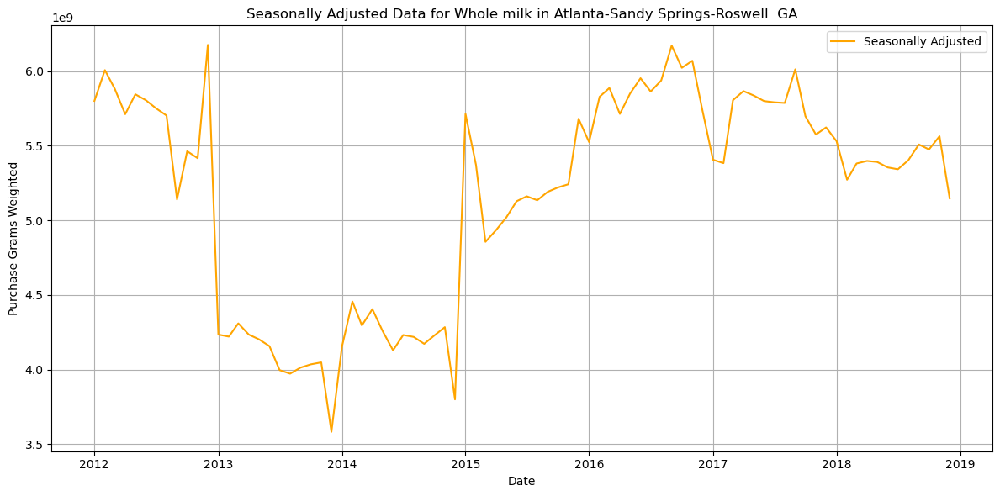

Augmented Dickey-Fuller Test Results:
ADF Statistic: -1.6559
p-value: 0.4540
Critical Values:
   1%: -3.5138
   5%: -2.8979
   10%: -2.5862
The seasonally adjusted data is non-stationary (fail to reject null hypothesis).


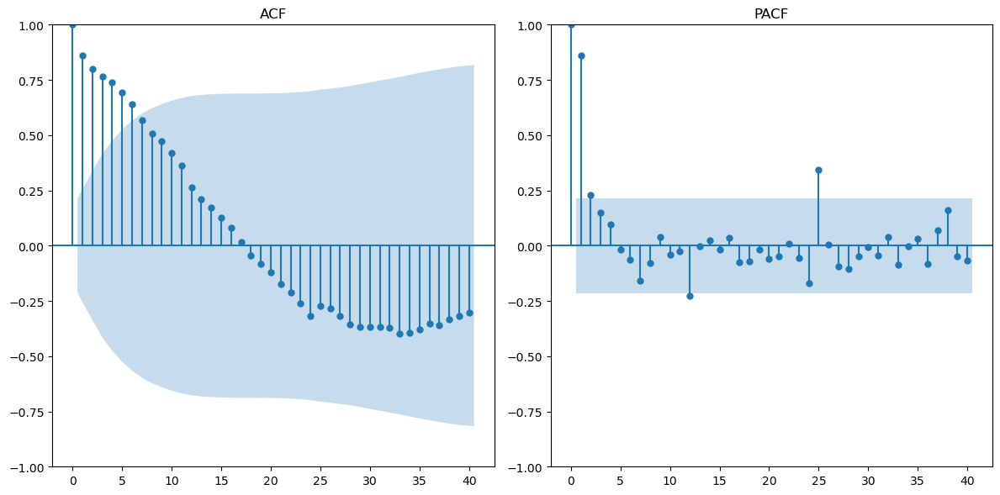

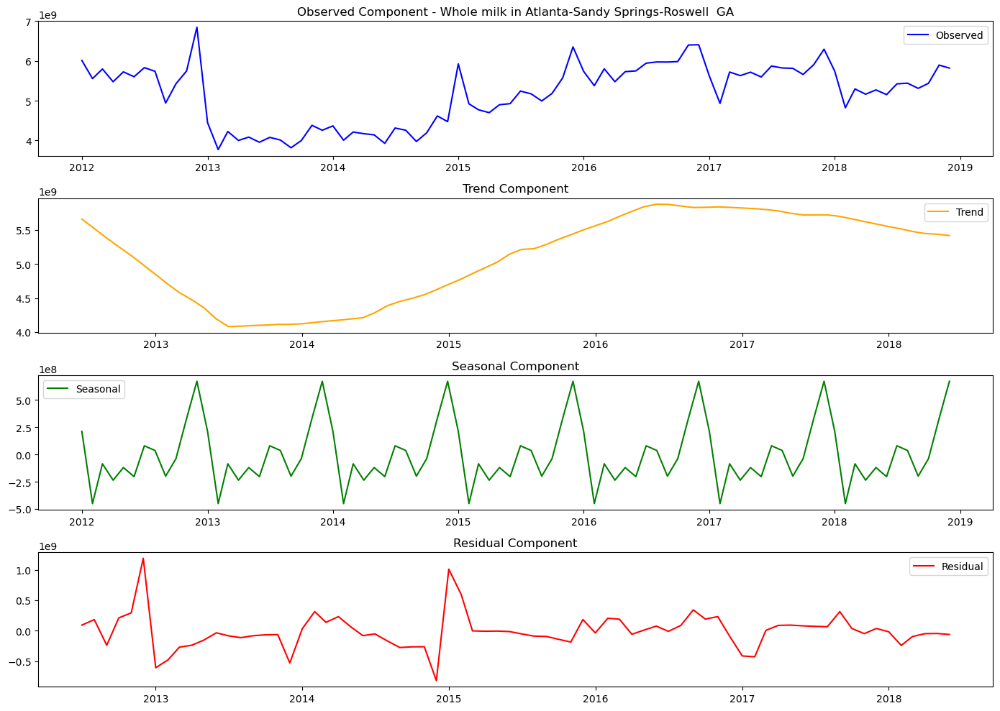

In [12]:
# Step 1: Create seasonally adjusted data
seasonally_adjusted, decomposition = make_seasonally_adjusted(city_df, 'Whole milk', 'Atlanta-Sandy Springs-Roswell  GA')

# Step 2:Plot Seasonally adjusted & Check stationarity
plot_seasonally_adjusted(seasonally_adjusted,'Whole milk', 'Atlanta-Sandy Springs-Roswell  GA')
check_stationarity(seasonally_adjusted)

# Step 3: Plot ACF and PACF
plot_acf_pacf(seasonally_adjusted)

# Step 4: Visualize Seasonal_decomposition
visualize_seasonal_decompose(decomposition, 'Whole milk', 'Atlanta-Sandy Springs-Roswell  GA')


## Applying differencing and check for stationarity

Augmented Dickey-Fuller Test Results:
ADF Statistic: -8.6940
p-value: 0.0000
Critical Values:
   1%: -3.5138
   5%: -2.8979
   10%: -2.5862
The seasonally adjusted data is stationary (reject null hypothesis).


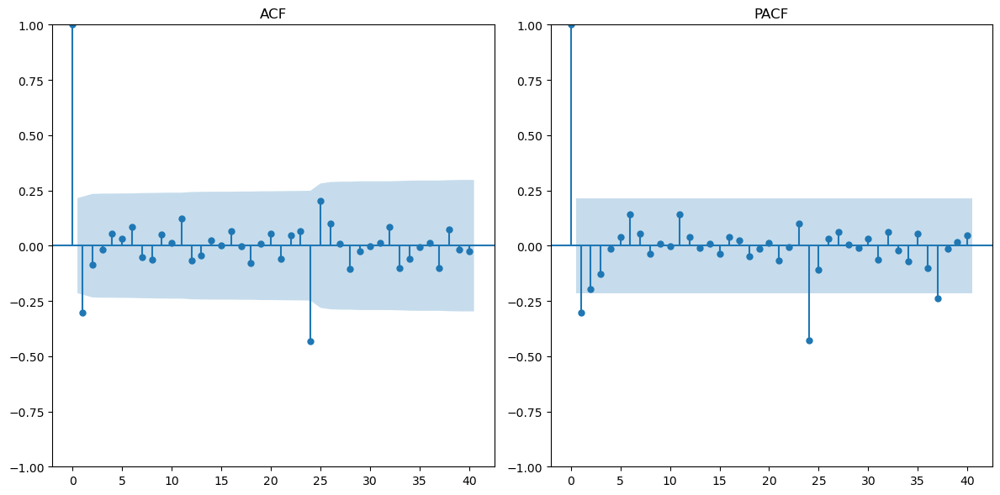

In [13]:
# Differencing the seasonally adjusted data
differenced_seasonally_adjusted = seasonally_adjusted.diff().dropna()

# Check stationarity on differenced data
check_stationarity(differenced_seasonally_adjusted)

# Plot ACF and PACF on differenced data
plot_acf_pacf(differenced_seasonally_adjusted)

**d=1 as stationary for 1st differencing p=1 and q=1 as only 1 significant spike in ACF and PACF plots**

Mean Absolute Error (MAE): 214595433.76
Root Mean Squared Error (RMSE): 234979771.80
Akaike Information Criterion (AIC): 3514.86


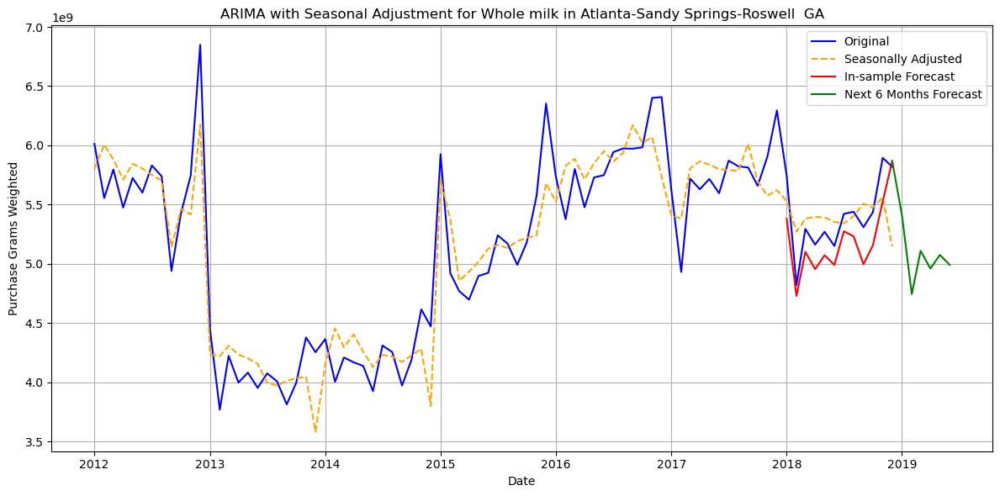

In [14]:

# ARIMA with p,d and q values as (1,1,1).
arima_with_custom_order(city_df, 'Whole milk', 'Atlanta-Sandy Springs-Roswell  GA', p=1, d=1, q=1, forecast_steps=18)


Mean Absolute Error (MAE): 216006548.67
Root Mean Squared Error (RMSE): 237188627.56
Akaike Information Criterion (AIC): 3516.60


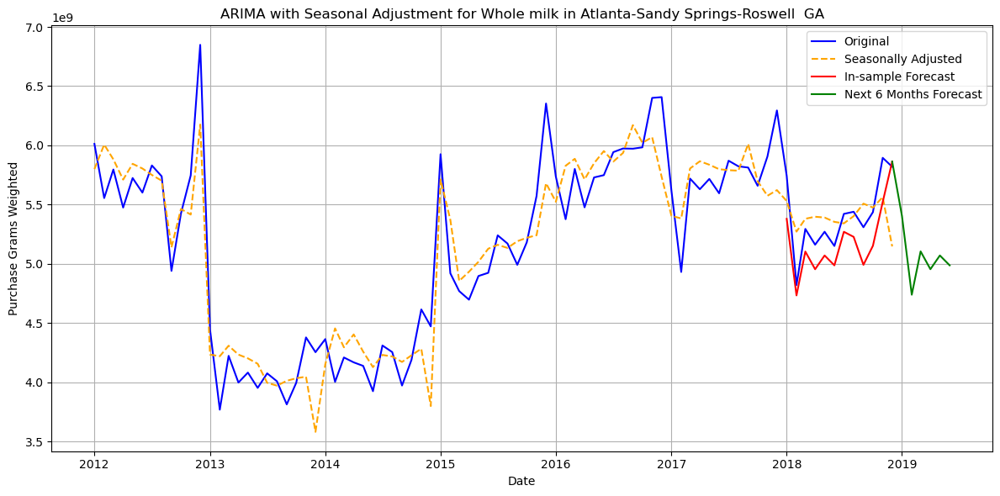

In [15]:
# testing with (p=1, d=1, q=2) values
arima_with_custom_order(city_df, 'Whole milk', 'Atlanta-Sandy Springs-Roswell  GA', p=1, d=1, q=2, forecast_steps=18)

Mean Absolute Error (MAE): 216007327.00
Root Mean Squared Error (RMSE): 237277241.68
Akaike Information Criterion (AIC): 3516.72


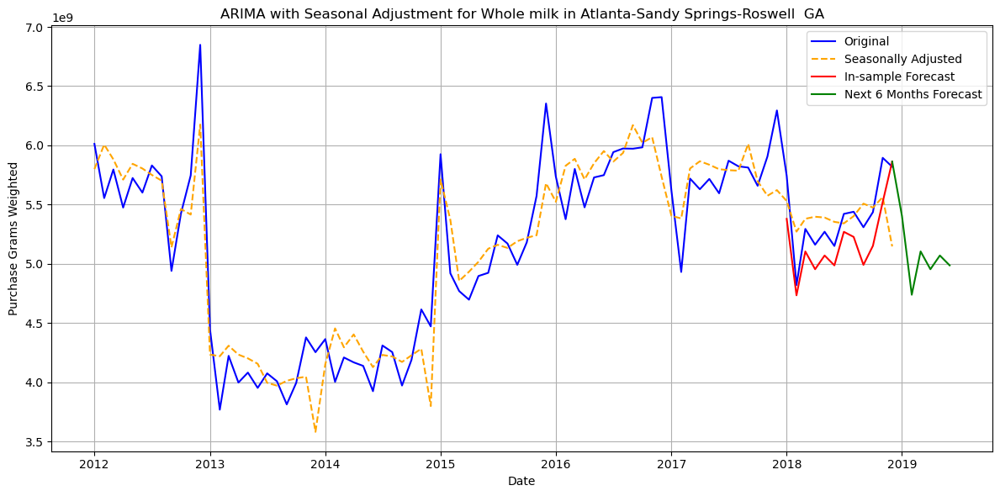

In [16]:
# testing with (p=2, d=1, q=1) values
arima_with_custom_order(city_df, 'Whole milk', 'Atlanta-Sandy Springs-Roswell  GA', p=2, d=1, q=1, forecast_steps=18)

#### Since p=1,d=1 and q=1 has the least AIC score.

### 'Alcohol', 'New York-Newark-Jersey City  NY-NJ-PA'

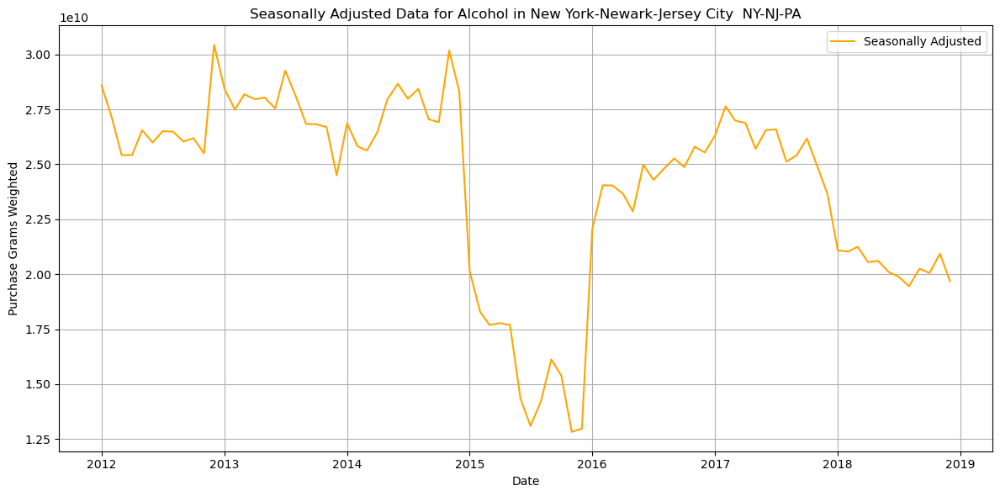

Augmented Dickey-Fuller Test Results:
ADF Statistic: -2.4724
p-value: 0.1223
Critical Values:
   1%: -3.5171
   5%: -2.8994
   10%: -2.5870
The seasonally adjusted data is non-stationary (fail to reject null hypothesis).


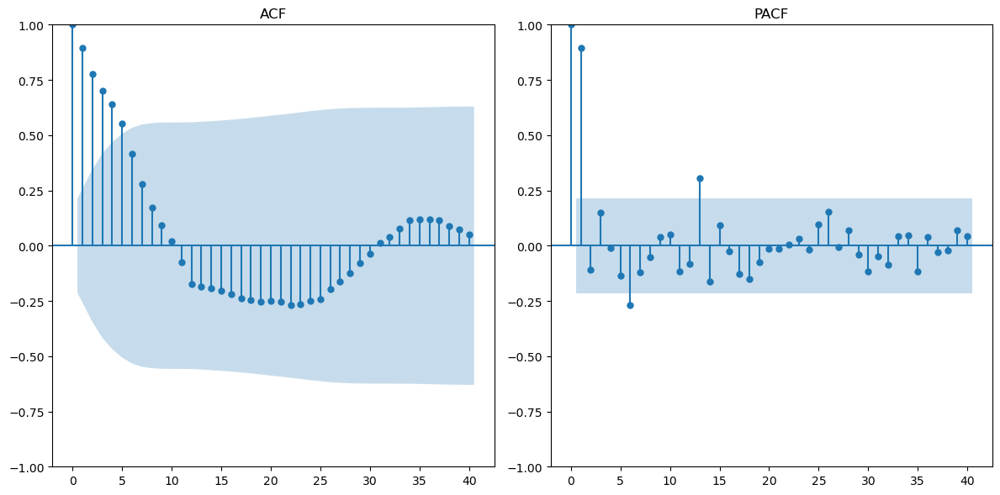

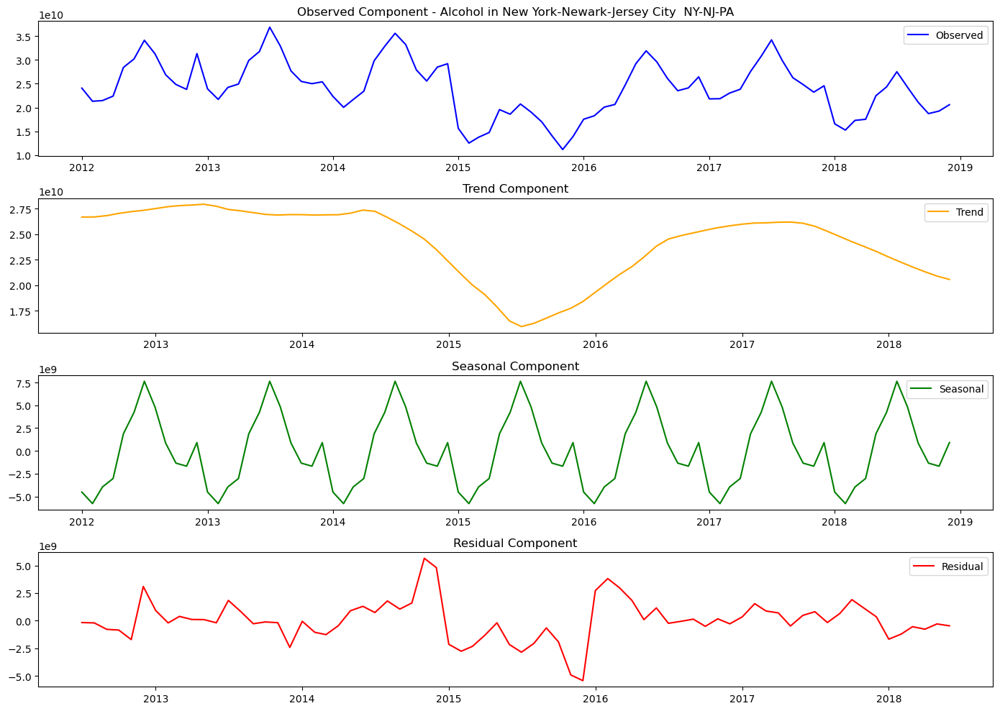

In [17]:
# Step 1: Create seasonally adjusted data
seasonally_adjusted, decomposition = make_seasonally_adjusted(city_df, 'Alcohol', 'New York-Newark-Jersey City  NY-NJ-PA')

# Step 2:Plot Seasonally adjusted & Check stationarity
plot_seasonally_adjusted(seasonally_adjusted,'Alcohol', 'New York-Newark-Jersey City  NY-NJ-PA')
check_stationarity(seasonally_adjusted)

# Step 3: Plot ACF and PACF
plot_acf_pacf(seasonally_adjusted)

# Step 4: Visualize Seasonal_decomposition
visualize_seasonal_decompose(decomposition, 'Alcohol', 'New York-Newark-Jersey City  NY-NJ-PA')


**Apply differencing and check for stationarity**

Augmented Dickey-Fuller Test Results:
ADF Statistic: -7.5889
p-value: 0.0000
Critical Values:
   1%: -3.5138
   5%: -2.8979
   10%: -2.5862
The seasonally adjusted data is stationary (reject null hypothesis).


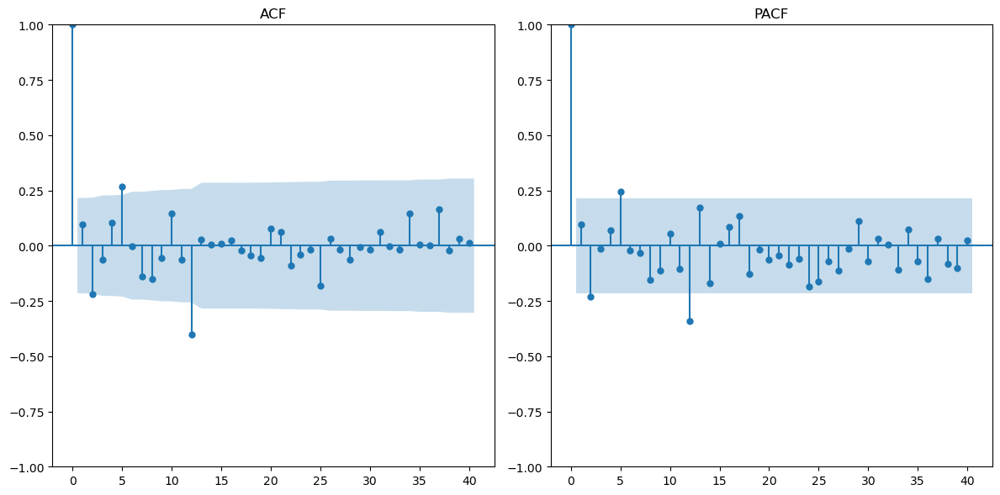

In [18]:
# Differencing the seasonally adjusted data
differenced_seasonally_adjusted = seasonally_adjusted.diff().dropna()

# Check stationarity on differenced data
check_stationarity(differenced_seasonally_adjusted)

# Plot ACF and PACF on differenced data
plot_acf_pacf(differenced_seasonally_adjusted)

**d=1 since stationary after first differencing p=2 and q=2 2 significant spike in ACF and PACF before becoming insignificant**

Mean Absolute Error (MAE): 736843676.90
Root Mean Squared Error (RMSE): 892594857.30
Akaike Information Criterion (AIC): 3782.91


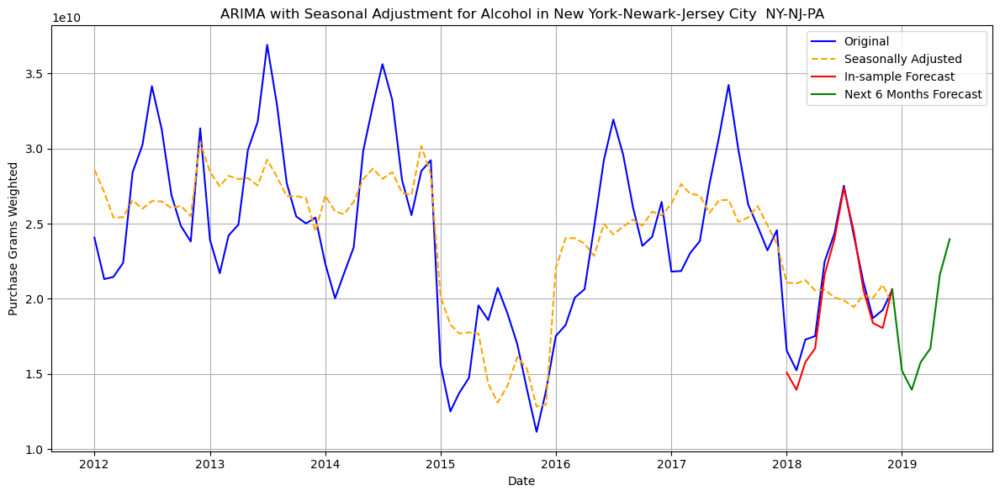

In [19]:
arima_with_custom_order(city_df, 'Alcohol', 'New York-Newark-Jersey City  NY-NJ-PA', p=2, d=1, q=1, forecast_steps=18)

Mean Absolute Error (MAE): 714760420.93
Root Mean Squared Error (RMSE): 850405217.16
Akaike Information Criterion (AIC): 3780.11


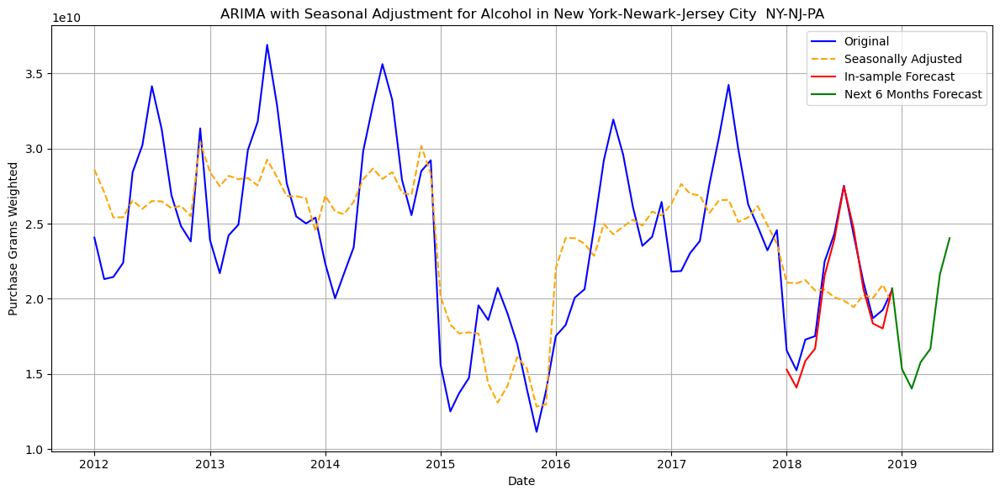

In [20]:
arima_with_custom_order(city_df, 'Alcohol', 'New York-Newark-Jersey City  NY-NJ-PA', p=2, d=1, q=2, forecast_steps=18)

Mean Absolute Error (MAE): 741106115.86
Root Mean Squared Error (RMSE): 897683318.38
Akaike Information Criterion (AIC): 3783.36


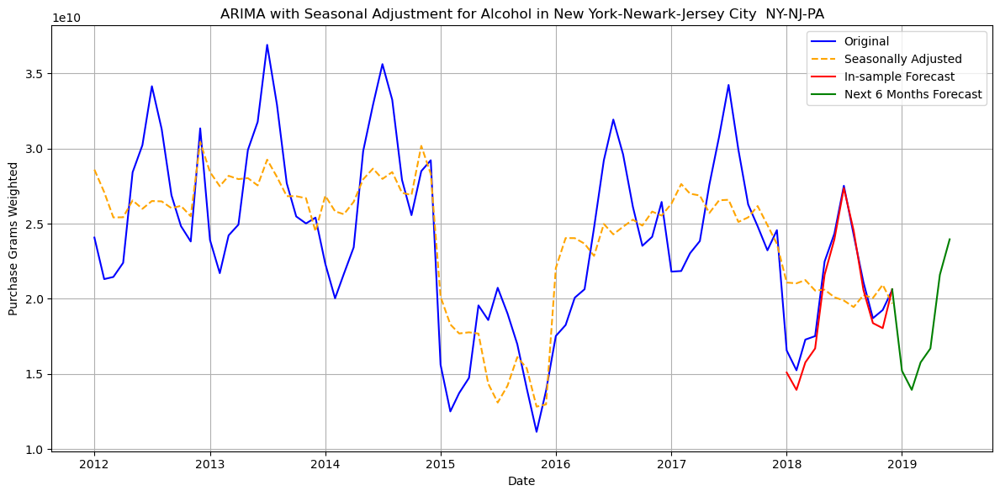

In [21]:
arima_with_custom_order(city_df, 'Alcohol', 'New York-Newark-Jersey City  NY-NJ-PA', p=1, d=1, q=2, forecast_steps=18)

**p=2 d=1 q=2 has the least AIC score and best parameters**

### 'Cheese and cream cheese', 'Dallas-Fort Worth-Arlington  TX'

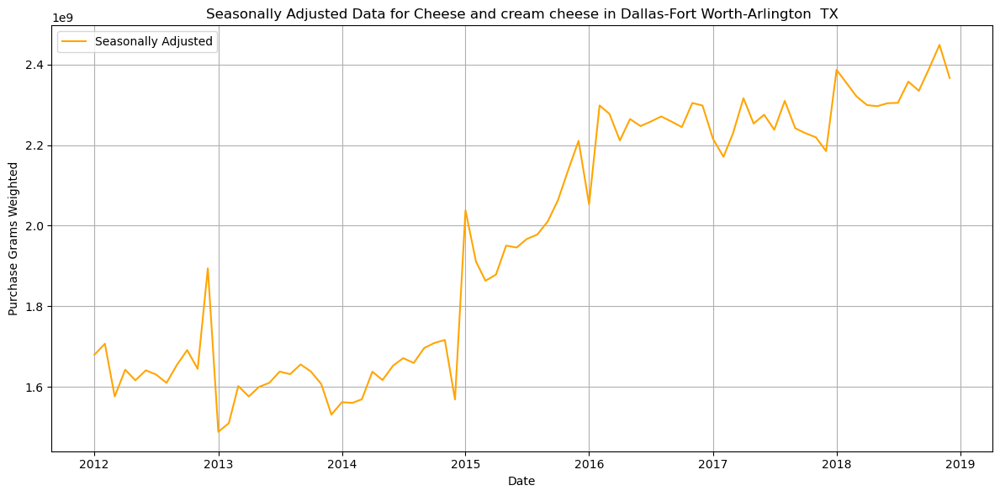

Augmented Dickey-Fuller Test Results:
ADF Statistic: -0.2797
p-value: 0.9283
Critical Values:
   1%: -3.5138
   5%: -2.8979
   10%: -2.5862
The seasonally adjusted data is non-stationary (fail to reject null hypothesis).


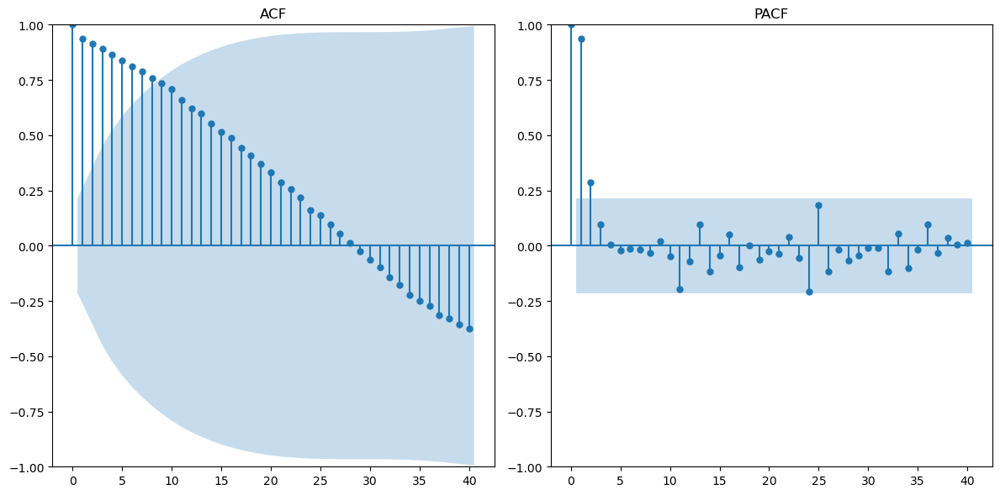

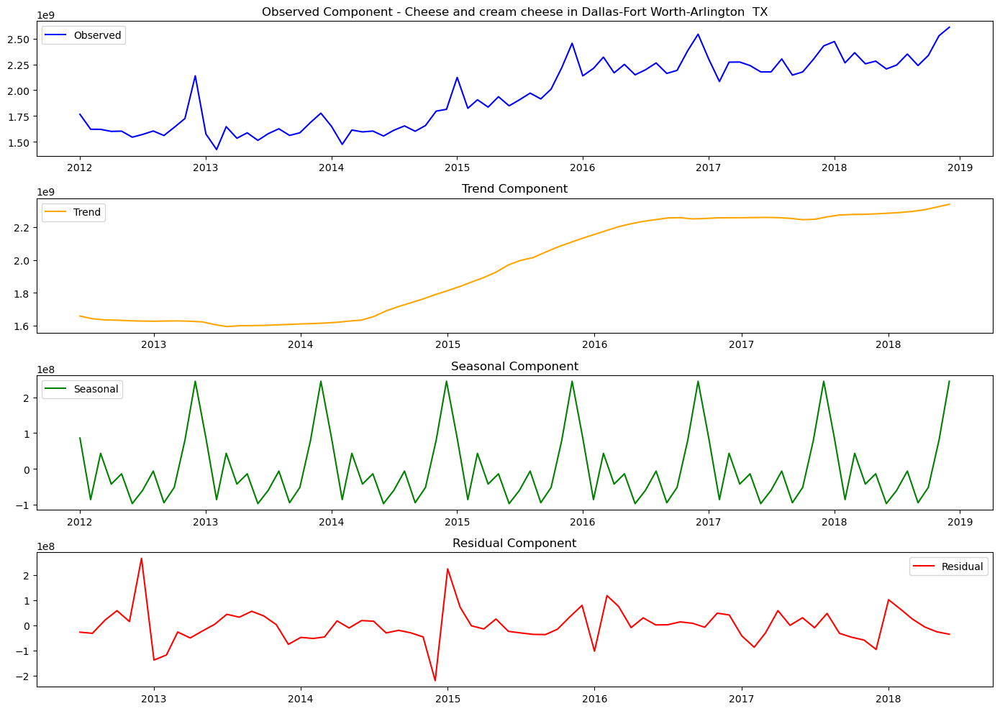

In [22]:
# Step 1: Create seasonally adjusted data
seasonally_adjusted, decomposition = make_seasonally_adjusted(city_df, 'Cheese and cream cheese', 'Dallas-Fort Worth-Arlington  TX')

# Step 2:Plot Seasonally adjusted & Check stationarity
plot_seasonally_adjusted(seasonally_adjusted,'Cheese and cream cheese', 'Dallas-Fort Worth-Arlington  TX')
check_stationarity(seasonally_adjusted)

# Step 3: Plot ACF and PACF
plot_acf_pacf(seasonally_adjusted)

# Step 4: Visualize Seasonal_decomposition
visualize_seasonal_decompose(decomposition, 'Cheese and cream cheese', 'Dallas-Fort Worth-Arlington  TX')


**Applying differencing and check for stationarity**

Augmented Dickey-Fuller Test Results:
ADF Statistic: -10.3946
p-value: 0.0000
Critical Values:
   1%: -3.5138
   5%: -2.8979
   10%: -2.5862
The seasonally adjusted data is stationary (reject null hypothesis).


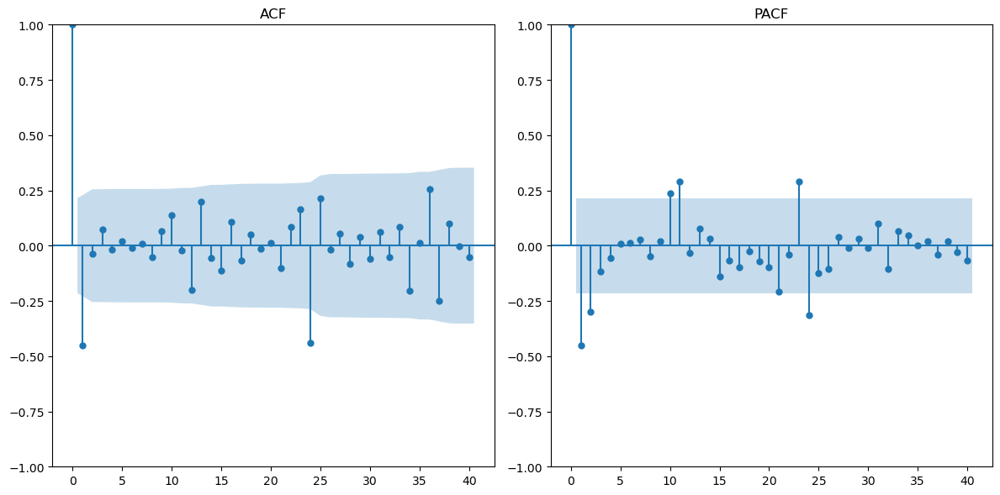

In [23]:
# Differencing the seasonally adjusted data
differenced_seasonally_adjusted = seasonally_adjusted.diff().dropna()

# Check stationarity on differenced data
check_stationarity(differenced_seasonally_adjusted)

# Plot ACF and PACF on differenced data
plot_acf_pacf(differenced_seasonally_adjusted)

**d=1 as stationary after 1st differencing p=1 and q=1, only one significant spikes before the series becomes insignificant**

Mean Absolute Error (MAE): 44192143.87
Root Mean Squared Error (RMSE): 51678536.80
Akaike Information Criterion (AIC): 3290.16


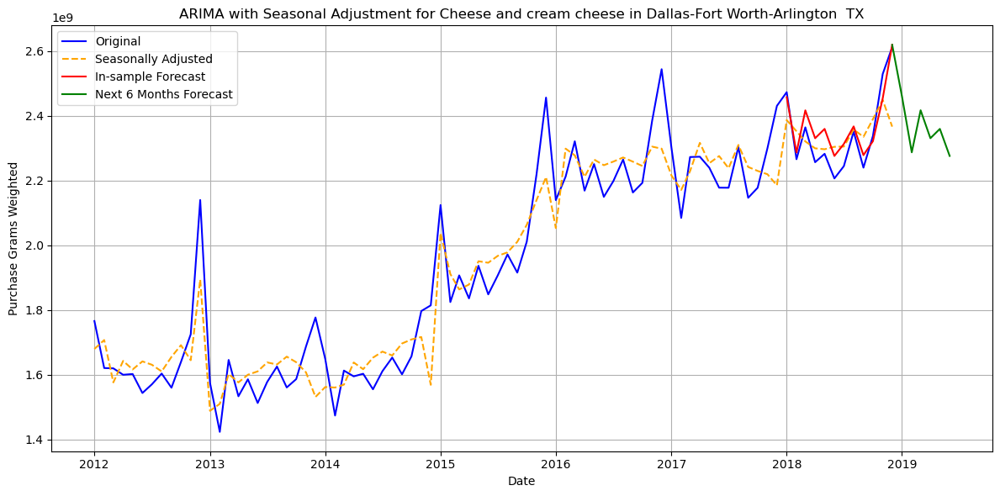

In [24]:
# ARIMA with p=1,d=1 & q=1
arima_with_custom_order(city_df, 'Cheese and cream cheese', 'Dallas-Fort Worth-Arlington  TX', p=1, d=1, q=1, forecast_steps=18)

## 'Cheese and cream cheese', 'Atlanta-Sandy Springs-Roswell  GA'

Augmented Dickey-Fuller Test Results:
ADF Statistic: -1.5643
p-value: 0.5015
Critical Values:
   1%: -3.5138
   5%: -2.8979
   10%: -2.5862
The seasonally adjusted data is non-stationary (fail to reject null hypothesis).


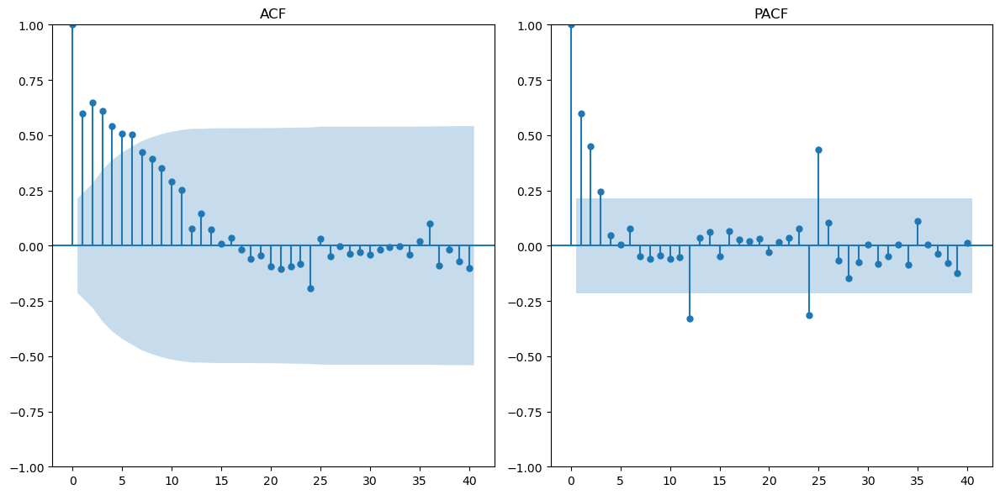

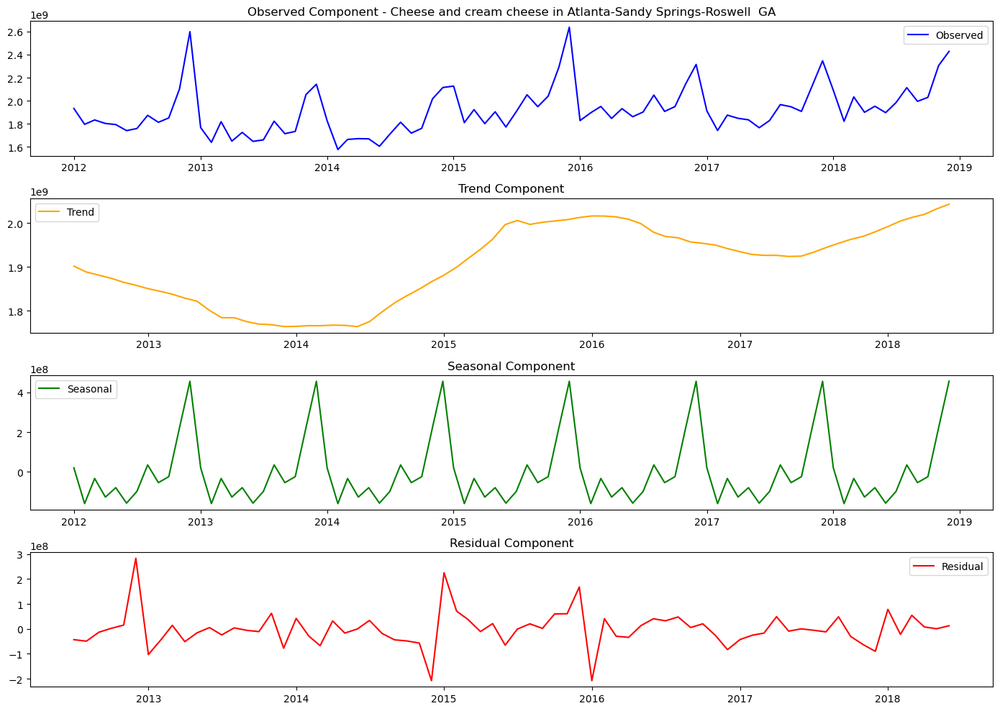

In [25]:
# Step 1: Create seasonally adjusted data
seasonally_adjusted, decomposition = make_seasonally_adjusted(city_df, 'Cheese and cream cheese', 'Atlanta-Sandy Springs-Roswell  GA')

# Step 2:Plot Seasonally adjusted & Check stationarity
check_stationarity(seasonally_adjusted)

# Step 3: Plot ACF and PACF
plot_acf_pacf(seasonally_adjusted)

# Step 4: Visualize Seasonal_decomposition
visualize_seasonal_decompose(decomposition, 'Cheese and cream cheese', 'Atlanta-Sandy Springs-Roswell  GA')

**Applying first differencing and check for stationarity**

Augmented Dickey-Fuller Test Results:
ADF Statistic: -10.9214
p-value: 0.0000
Critical Values:
   1%: -3.5138
   5%: -2.8979
   10%: -2.5862
The seasonally adjusted data is stationary (reject null hypothesis).


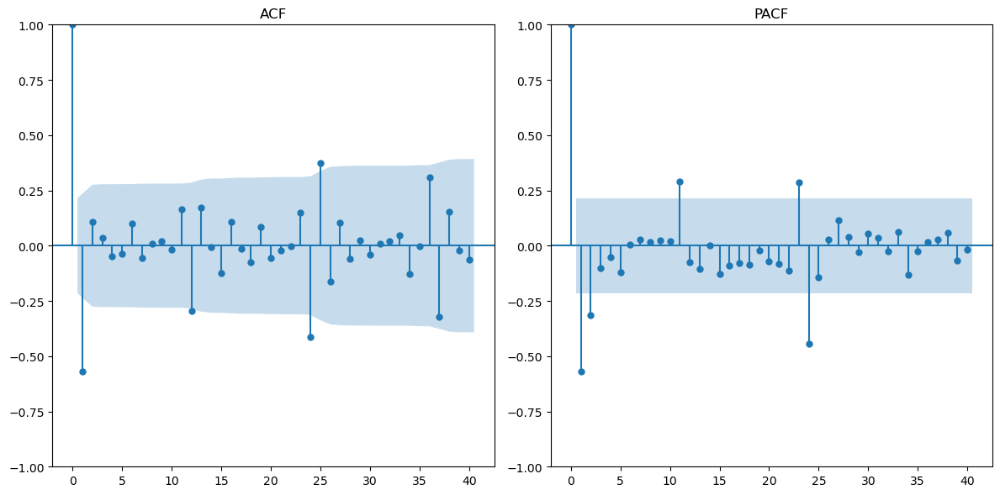

In [26]:
# Differencing the seasonally adjusted data
differenced_seasonally_adjusted = seasonally_adjusted.diff().dropna()

# Check stationarity on differenced data
check_stationarity(differenced_seasonally_adjusted)

# Plot ACF and PACF on differenced data
plot_acf_pacf(differenced_seasonally_adjusted)

Mean Absolute Error (MAE): 64944410.39
Root Mean Squared Error (RMSE): 72113866.80
Akaike Information Criterion (AIC): 3309.72


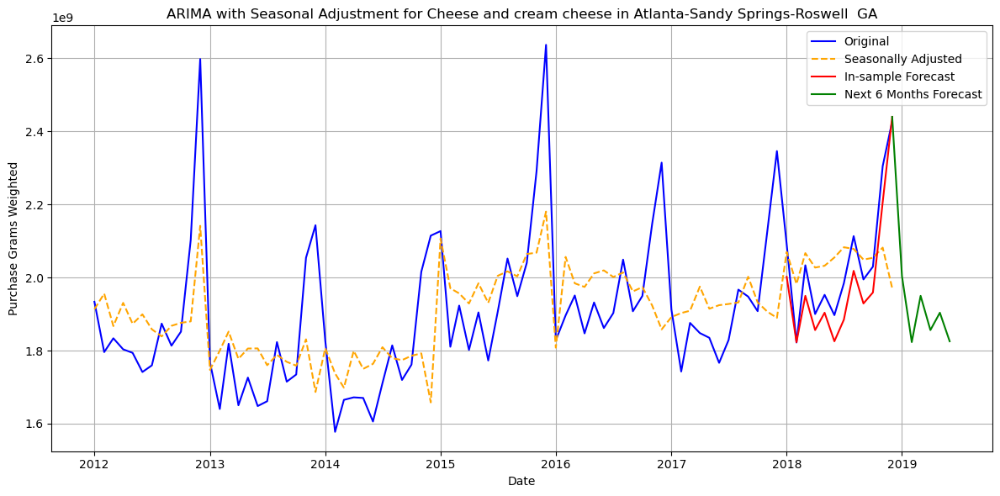

In [27]:
# ARIMA with p=1,d=1 & q=1
arima_with_custom_order(city_df, 'Cheese and cream cheese', 'Atlanta-Sandy Springs-Roswell  GA', p=1, d=1, q=1, forecast_steps=18)

#### optional code to plot ACF and PACF plot and also returns the number of differencing required for the data to become stationary for all food categories in each metroregion


Analyzing Whole milk in Atlanta-Sandy Springs-Roswell  GA...

Stationarity Check for Whole milk in Atlanta-Sandy Springs-Roswell  GA (Original):
ADF Statistic: -1.6559
p-value: 0.4540
The data is not stationary.
Differencing the data for Whole milk in Atlanta-Sandy Springs-Roswell  GA...

Stationarity Check for Whole milk in Atlanta-Sandy Springs-Roswell  GA (Differenced):
ADF Statistic: -8.6940
p-value: 0.0000
The data is stationary.
Plotting ACF and PACF for differenced data of Whole milk in Atlanta-Sandy Springs-Roswell  GA...


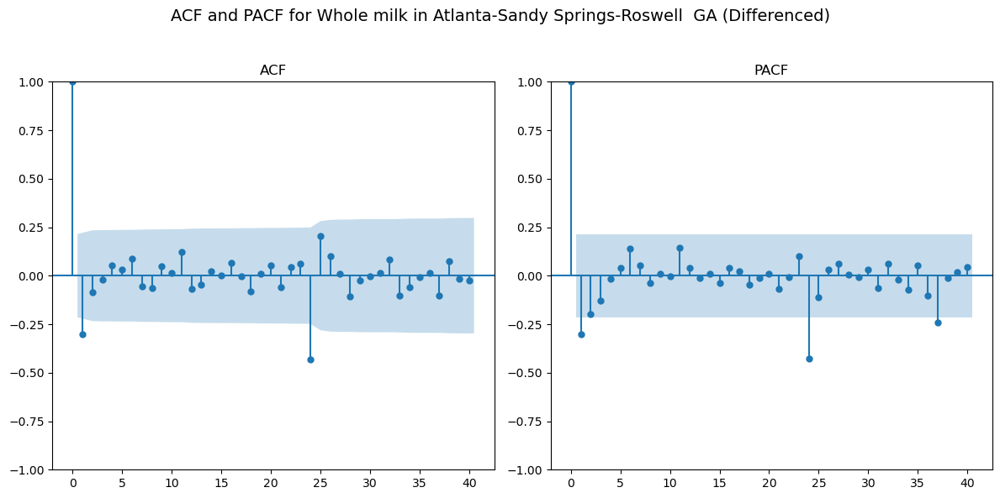


Analyzing Whole milk in Boston-Cambridge-Newton  MA-NH...

Stationarity Check for Whole milk in Boston-Cambridge-Newton  MA-NH (Original):
ADF Statistic: -1.7770
p-value: 0.3920
The data is not stationary.
Differencing the data for Whole milk in Boston-Cambridge-Newton  MA-NH...

Stationarity Check for Whole milk in Boston-Cambridge-Newton  MA-NH (Differenced):
ADF Statistic: -10.5810
p-value: 0.0000
The data is stationary.
Plotting ACF and PACF for differenced data of Whole milk in Boston-Cambridge-Newton  MA-NH...


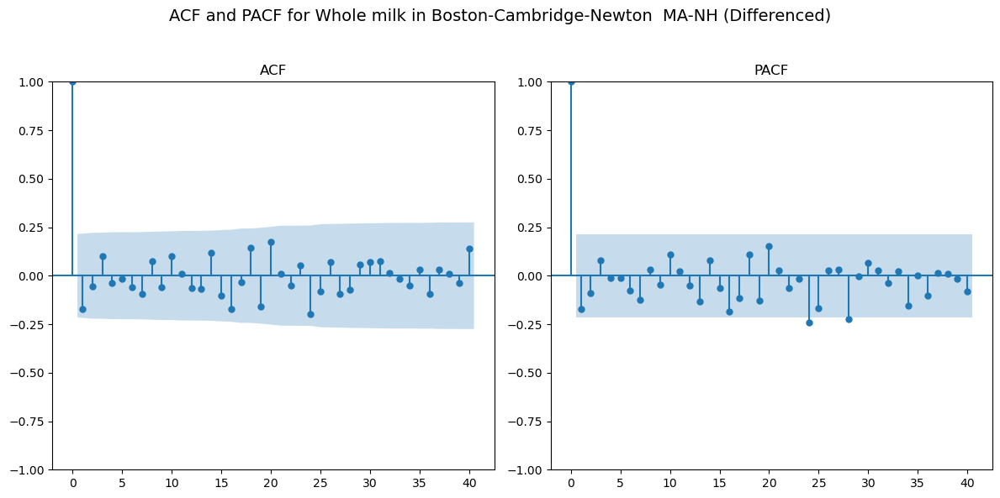


Analyzing Whole milk in Chicago-Naperville-Elgin  IL-IN-WI...

Stationarity Check for Whole milk in Chicago-Naperville-Elgin  IL-IN-WI (Original):
ADF Statistic: -1.9388
p-value: 0.3140
The data is not stationary.
Differencing the data for Whole milk in Chicago-Naperville-Elgin  IL-IN-WI...

Stationarity Check for Whole milk in Chicago-Naperville-Elgin  IL-IN-WI (Differenced):
ADF Statistic: -5.8806
p-value: 0.0000
The data is stationary.
Plotting ACF and PACF for differenced data of Whole milk in Chicago-Naperville-Elgin  IL-IN-WI...


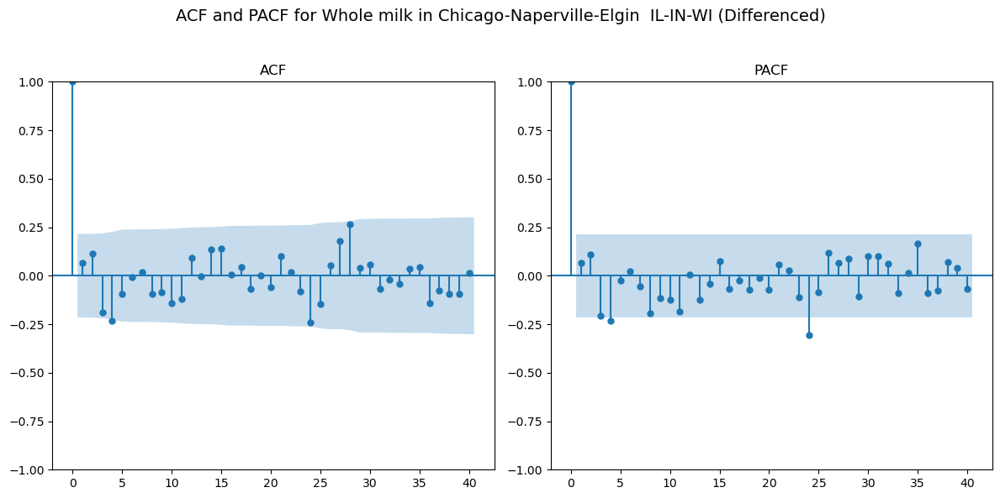


Analyzing Whole milk in Dallas-Fort Worth-Arlington  TX...

Stationarity Check for Whole milk in Dallas-Fort Worth-Arlington  TX (Original):
ADF Statistic: -2.1302
p-value: 0.2326
The data is not stationary.
Differencing the data for Whole milk in Dallas-Fort Worth-Arlington  TX...

Stationarity Check for Whole milk in Dallas-Fort Worth-Arlington  TX (Differenced):
ADF Statistic: -11.2260
p-value: 0.0000
The data is stationary.
Plotting ACF and PACF for differenced data of Whole milk in Dallas-Fort Worth-Arlington  TX...


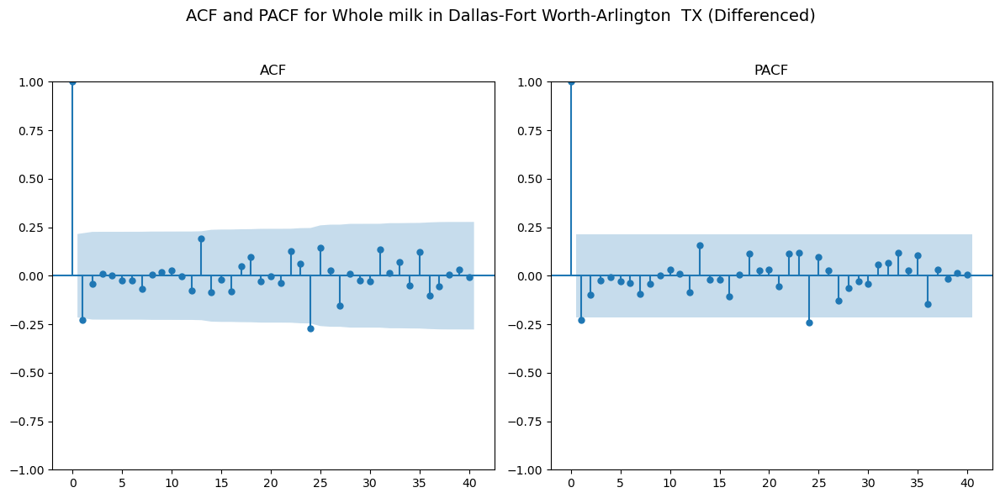


Analyzing Whole milk in Detroit-Warren-Dearborn  MI...

Stationarity Check for Whole milk in Detroit-Warren-Dearborn  MI (Original):
ADF Statistic: -2.3580
p-value: 0.1540
The data is not stationary.
Differencing the data for Whole milk in Detroit-Warren-Dearborn  MI...

Stationarity Check for Whole milk in Detroit-Warren-Dearborn  MI (Differenced):
ADF Statistic: -11.4003
p-value: 0.0000
The data is stationary.
Plotting ACF and PACF for differenced data of Whole milk in Detroit-Warren-Dearborn  MI...


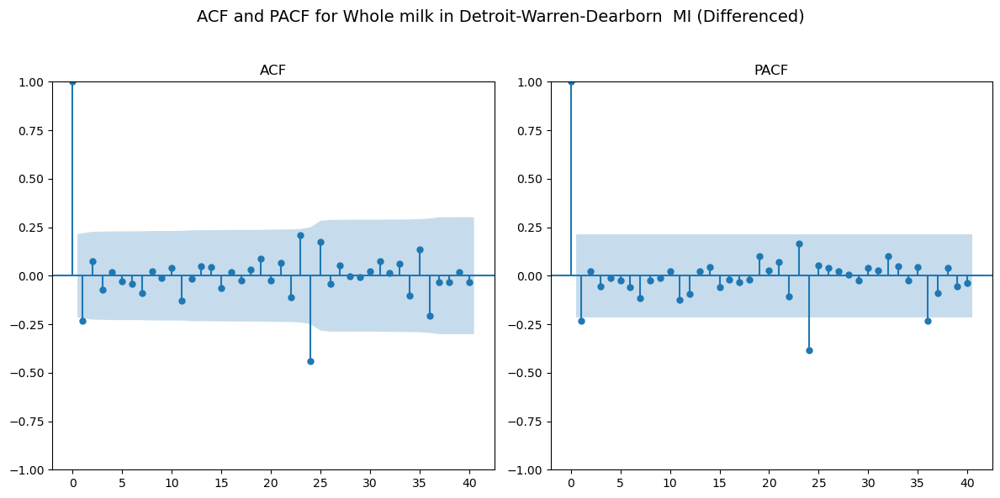


Analyzing Whole milk in Houston-The Woodlands-Sugar Land  TX...

Stationarity Check for Whole milk in Houston-The Woodlands-Sugar Land  TX (Original):
ADF Statistic: -1.9804
p-value: 0.2952
The data is not stationary.
Differencing the data for Whole milk in Houston-The Woodlands-Sugar Land  TX...

Stationarity Check for Whole milk in Houston-The Woodlands-Sugar Land  TX (Differenced):
ADF Statistic: -7.7044
p-value: 0.0000
The data is stationary.
Plotting ACF and PACF for differenced data of Whole milk in Houston-The Woodlands-Sugar Land  TX...


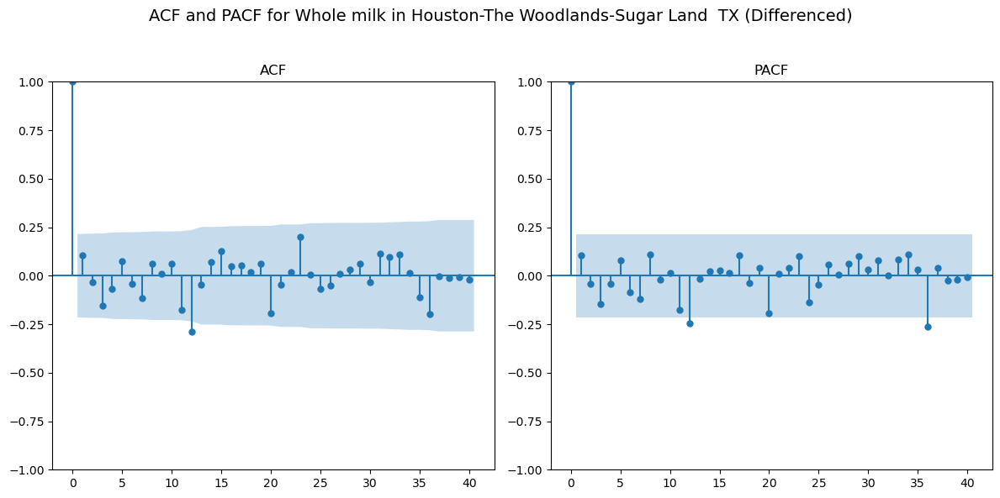


Analyzing Whole milk in Los Angeles-Long Beach-Anaheim  CA...

Stationarity Check for Whole milk in Los Angeles-Long Beach-Anaheim  CA (Original):
ADF Statistic: -1.1751
p-value: 0.6842
The data is not stationary.
Differencing the data for Whole milk in Los Angeles-Long Beach-Anaheim  CA...

Stationarity Check for Whole milk in Los Angeles-Long Beach-Anaheim  CA (Differenced):
ADF Statistic: -6.5575
p-value: 0.0000
The data is stationary.
Plotting ACF and PACF for differenced data of Whole milk in Los Angeles-Long Beach-Anaheim  CA...


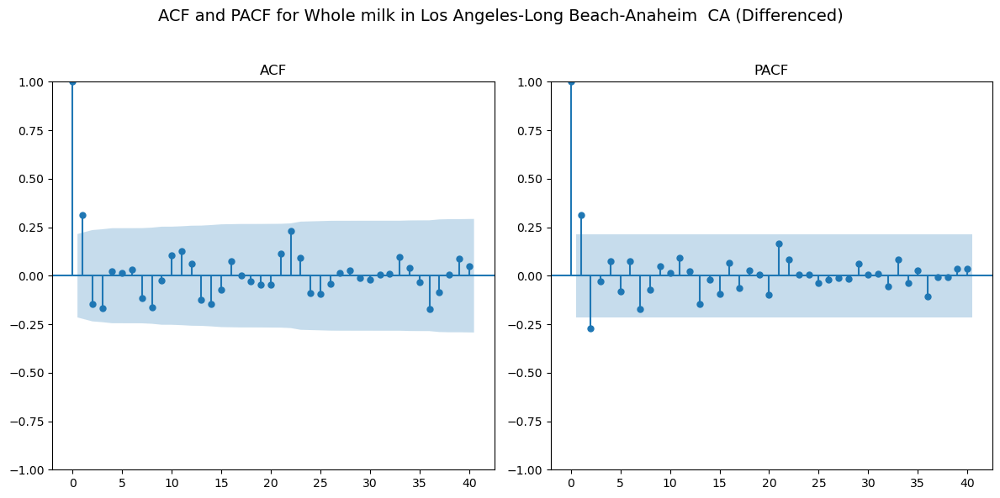


Analyzing Whole milk in Miami-Fort Lauderdale-West Palm Beach  FL...

Stationarity Check for Whole milk in Miami-Fort Lauderdale-West Palm Beach  FL (Original):
ADF Statistic: -2.9465
p-value: 0.0402
The data is stationary.
Plotting ACF and PACF for original data of Whole milk in Miami-Fort Lauderdale-West Palm Beach  FL...


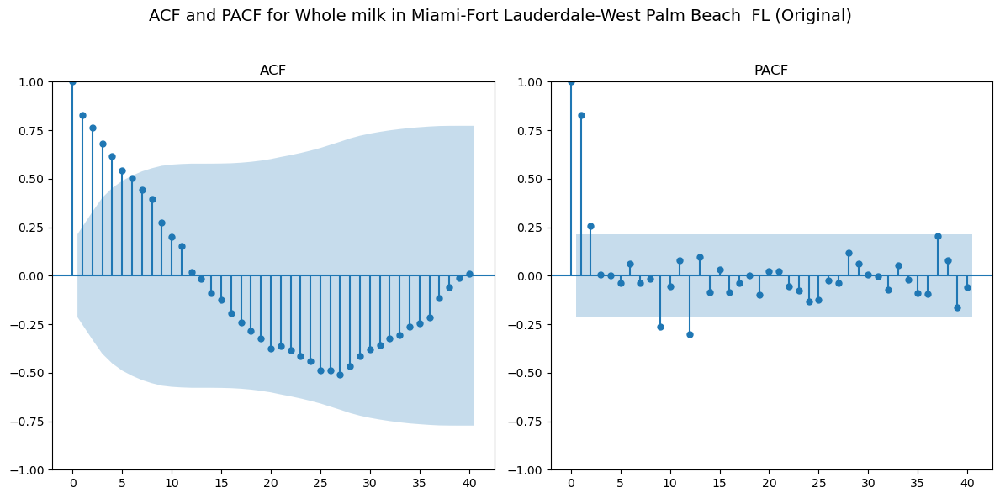


Analyzing Whole milk in New York-Newark-Jersey City  NY-NJ-PA...

Stationarity Check for Whole milk in New York-Newark-Jersey City  NY-NJ-PA (Original):
ADF Statistic: -1.8951
p-value: 0.3344
The data is not stationary.
Differencing the data for Whole milk in New York-Newark-Jersey City  NY-NJ-PA...

Stationarity Check for Whole milk in New York-Newark-Jersey City  NY-NJ-PA (Differenced):
ADF Statistic: -8.4943
p-value: 0.0000
The data is stationary.
Plotting ACF and PACF for differenced data of Whole milk in New York-Newark-Jersey City  NY-NJ-PA...


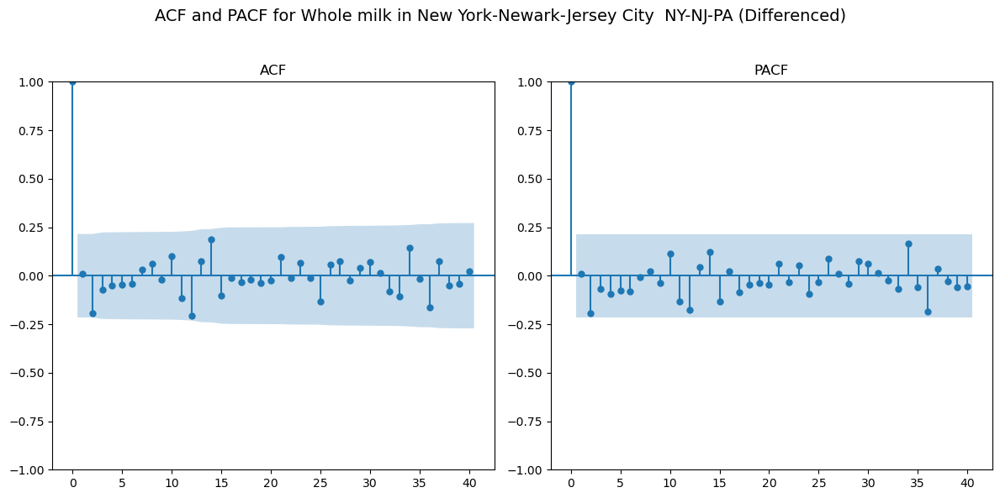


Analyzing Whole milk in Philadelphia-Camden-Wilmington  PA-NJ-DE-MD...

Stationarity Check for Whole milk in Philadelphia-Camden-Wilmington  PA-NJ-DE-MD (Original):
ADF Statistic: -1.9634
p-value: 0.3028
The data is not stationary.
Differencing the data for Whole milk in Philadelphia-Camden-Wilmington  PA-NJ-DE-MD...

Stationarity Check for Whole milk in Philadelphia-Camden-Wilmington  PA-NJ-DE-MD (Differenced):
ADF Statistic: -7.9731
p-value: 0.0000
The data is stationary.
Plotting ACF and PACF for differenced data of Whole milk in Philadelphia-Camden-Wilmington  PA-NJ-DE-MD...


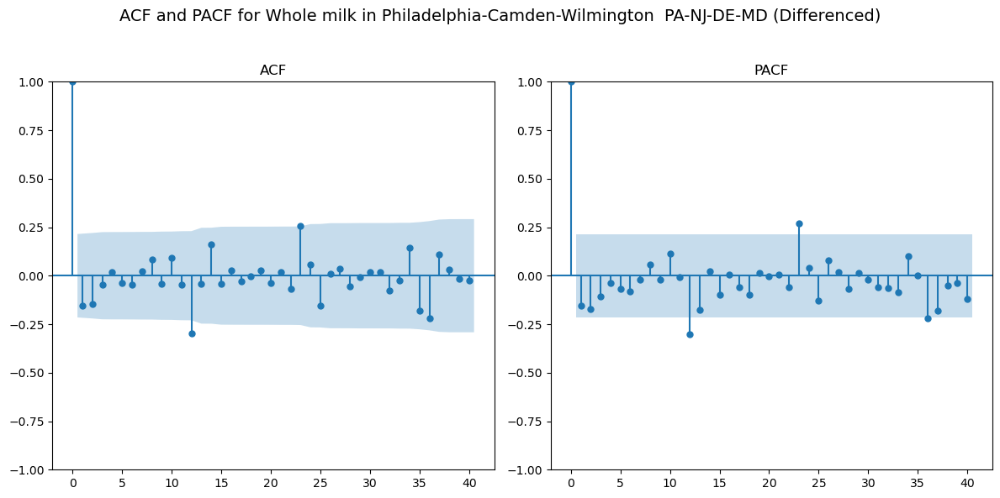


Analyzing Cheese and cream cheese in Atlanta-Sandy Springs-Roswell  GA...

Stationarity Check for Cheese and cream cheese in Atlanta-Sandy Springs-Roswell  GA (Original):
ADF Statistic: -1.5643
p-value: 0.5015
The data is not stationary.
Differencing the data for Cheese and cream cheese in Atlanta-Sandy Springs-Roswell  GA...

Stationarity Check for Cheese and cream cheese in Atlanta-Sandy Springs-Roswell  GA (Differenced):
ADF Statistic: -10.9214
p-value: 0.0000
The data is stationary.
Plotting ACF and PACF for differenced data of Cheese and cream cheese in Atlanta-Sandy Springs-Roswell  GA...


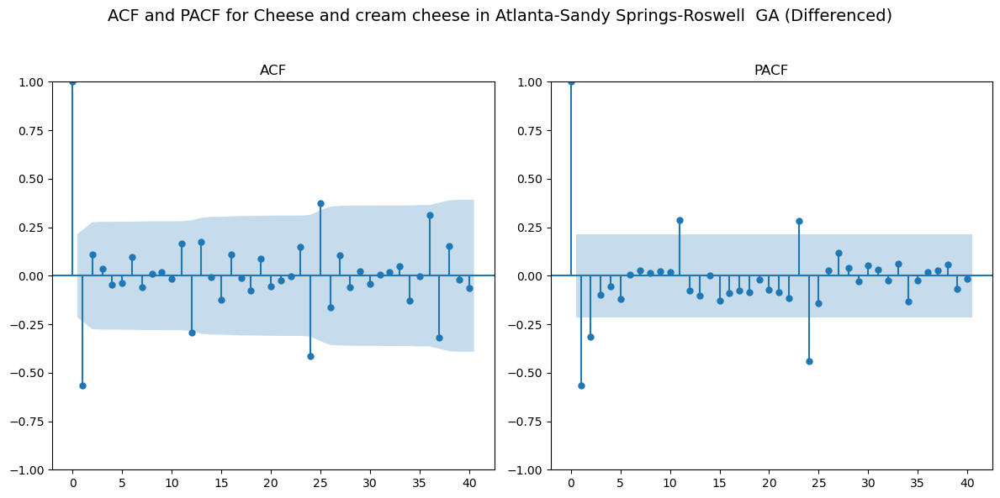


Analyzing Cheese and cream cheese in Boston-Cambridge-Newton  MA-NH...

Stationarity Check for Cheese and cream cheese in Boston-Cambridge-Newton  MA-NH (Original):
ADF Statistic: -6.4794
p-value: 0.0000
The data is stationary.
Plotting ACF and PACF for original data of Cheese and cream cheese in Boston-Cambridge-Newton  MA-NH...


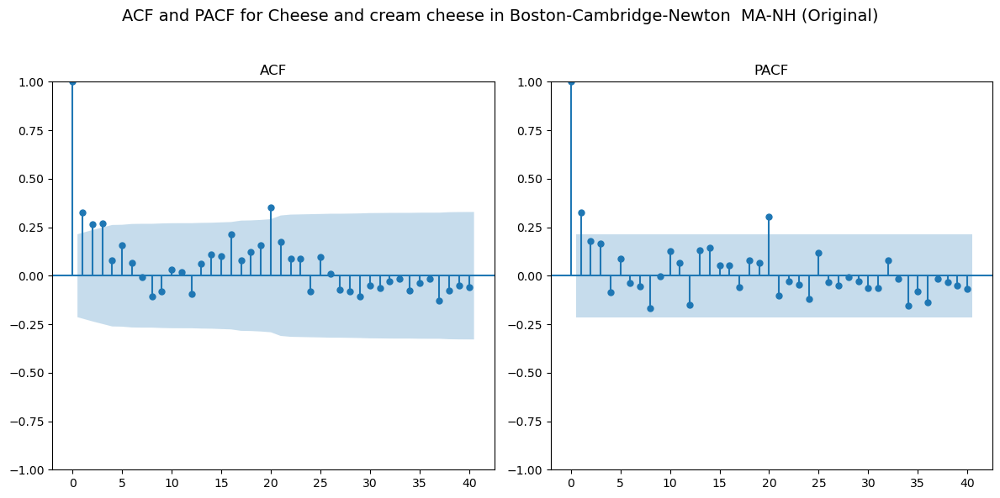


Analyzing Cheese and cream cheese in Chicago-Naperville-Elgin  IL-IN-WI...

Stationarity Check for Cheese and cream cheese in Chicago-Naperville-Elgin  IL-IN-WI (Original):
ADF Statistic: -3.5039
p-value: 0.0079
The data is stationary.
Plotting ACF and PACF for original data of Cheese and cream cheese in Chicago-Naperville-Elgin  IL-IN-WI...


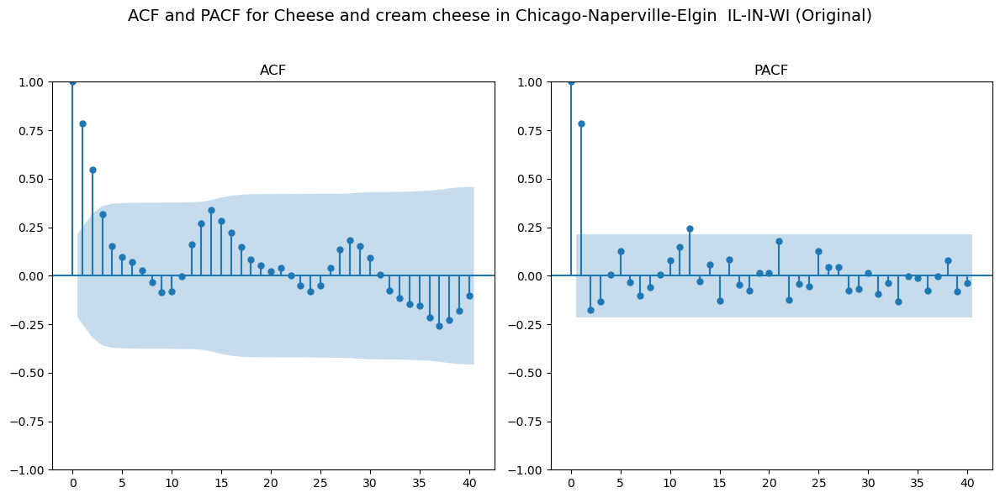


Analyzing Cheese and cream cheese in Dallas-Fort Worth-Arlington  TX...

Stationarity Check for Cheese and cream cheese in Dallas-Fort Worth-Arlington  TX (Original):
ADF Statistic: -0.2797
p-value: 0.9283
The data is not stationary.
Differencing the data for Cheese and cream cheese in Dallas-Fort Worth-Arlington  TX...

Stationarity Check for Cheese and cream cheese in Dallas-Fort Worth-Arlington  TX (Differenced):
ADF Statistic: -10.3946
p-value: 0.0000
The data is stationary.
Plotting ACF and PACF for differenced data of Cheese and cream cheese in Dallas-Fort Worth-Arlington  TX...


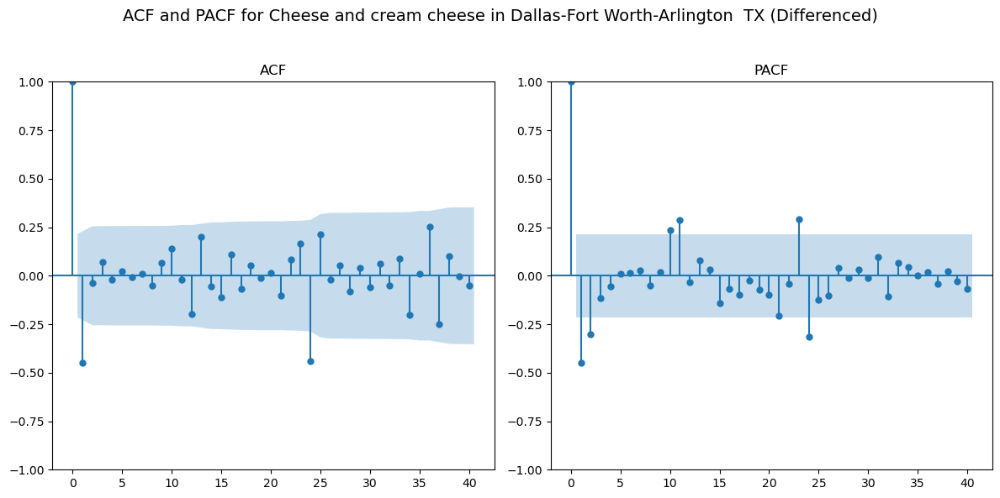


Analyzing Cheese and cream cheese in Detroit-Warren-Dearborn  MI...

Stationarity Check for Cheese and cream cheese in Detroit-Warren-Dearborn  MI (Original):
ADF Statistic: -1.7248
p-value: 0.4184
The data is not stationary.
Differencing the data for Cheese and cream cheese in Detroit-Warren-Dearborn  MI...

Stationarity Check for Cheese and cream cheese in Detroit-Warren-Dearborn  MI (Differenced):
ADF Statistic: -13.8255
p-value: 0.0000
The data is stationary.
Plotting ACF and PACF for differenced data of Cheese and cream cheese in Detroit-Warren-Dearborn  MI...


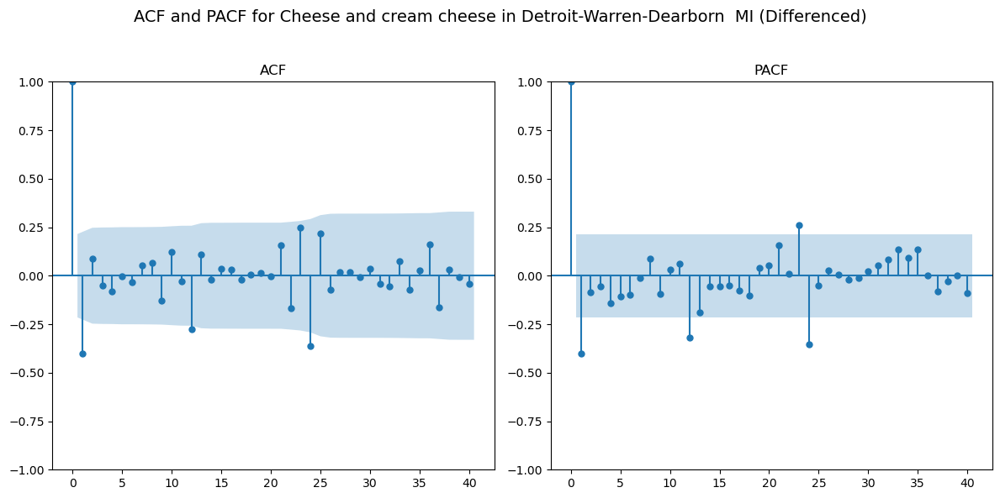


Analyzing Cheese and cream cheese in Houston-The Woodlands-Sugar Land  TX...

Stationarity Check for Cheese and cream cheese in Houston-The Woodlands-Sugar Land  TX (Original):
ADF Statistic: -2.0006
p-value: 0.2863
The data is not stationary.
Differencing the data for Cheese and cream cheese in Houston-The Woodlands-Sugar Land  TX...

Stationarity Check for Cheese and cream cheese in Houston-The Woodlands-Sugar Land  TX (Differenced):
ADF Statistic: -10.4993
p-value: 0.0000
The data is stationary.
Plotting ACF and PACF for differenced data of Cheese and cream cheese in Houston-The Woodlands-Sugar Land  TX...


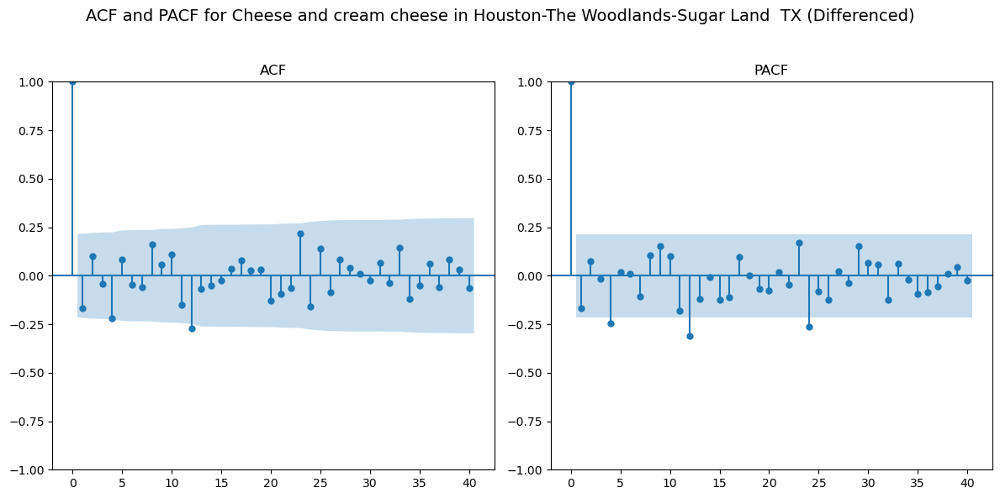


Analyzing Cheese and cream cheese in Los Angeles-Long Beach-Anaheim  CA...

Stationarity Check for Cheese and cream cheese in Los Angeles-Long Beach-Anaheim  CA (Original):
ADF Statistic: -1.9466
p-value: 0.3105
The data is not stationary.
Differencing the data for Cheese and cream cheese in Los Angeles-Long Beach-Anaheim  CA...

Stationarity Check for Cheese and cream cheese in Los Angeles-Long Beach-Anaheim  CA (Differenced):
ADF Statistic: -9.1368
p-value: 0.0000
The data is stationary.
Plotting ACF and PACF for differenced data of Cheese and cream cheese in Los Angeles-Long Beach-Anaheim  CA...


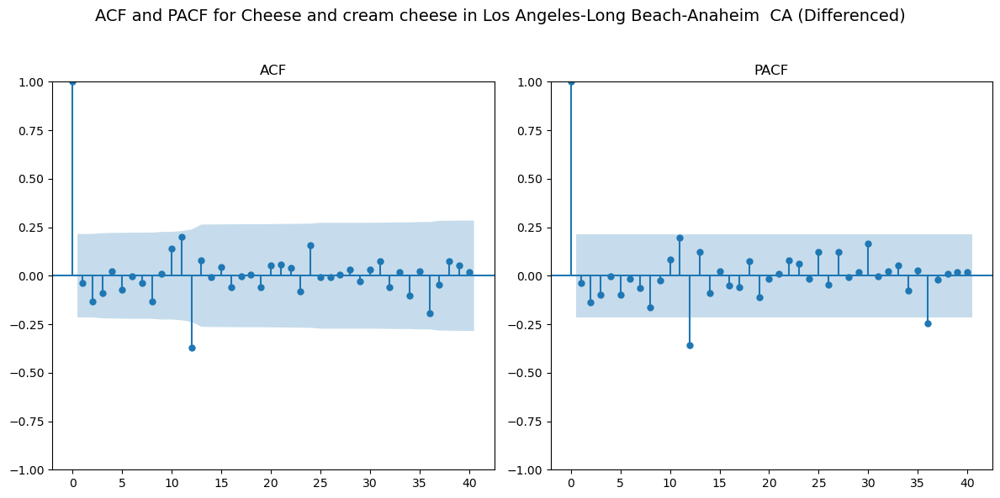


Analyzing Cheese and cream cheese in Miami-Fort Lauderdale-West Palm Beach  FL...

Stationarity Check for Cheese and cream cheese in Miami-Fort Lauderdale-West Palm Beach  FL (Original):
ADF Statistic: -2.3530
p-value: 0.1554
The data is not stationary.
Differencing the data for Cheese and cream cheese in Miami-Fort Lauderdale-West Palm Beach  FL...

Stationarity Check for Cheese and cream cheese in Miami-Fort Lauderdale-West Palm Beach  FL (Differenced):
ADF Statistic: -8.1270
p-value: 0.0000
The data is stationary.
Plotting ACF and PACF for differenced data of Cheese and cream cheese in Miami-Fort Lauderdale-West Palm Beach  FL...


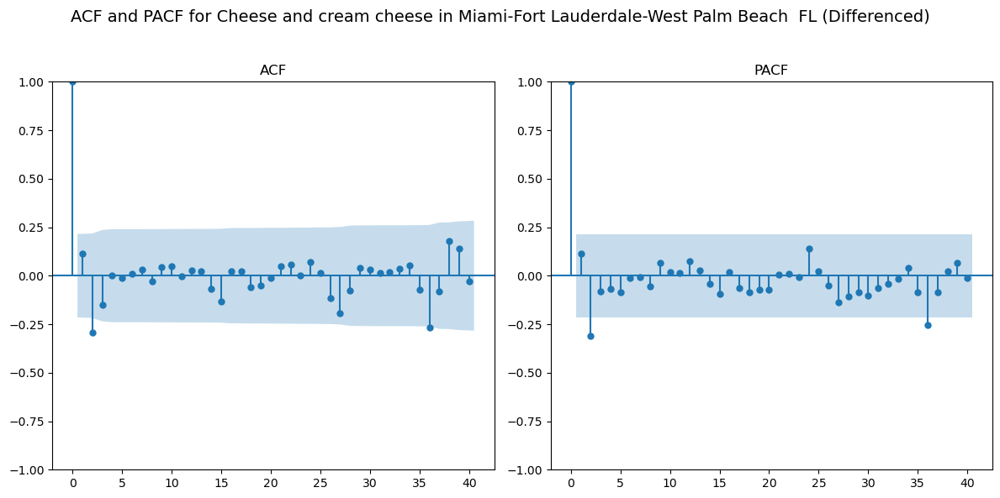


Analyzing Cheese and cream cheese in New York-Newark-Jersey City  NY-NJ-PA...

Stationarity Check for Cheese and cream cheese in New York-Newark-Jersey City  NY-NJ-PA (Original):
ADF Statistic: -4.1349
p-value: 0.0008
The data is stationary.
Plotting ACF and PACF for original data of Cheese and cream cheese in New York-Newark-Jersey City  NY-NJ-PA...


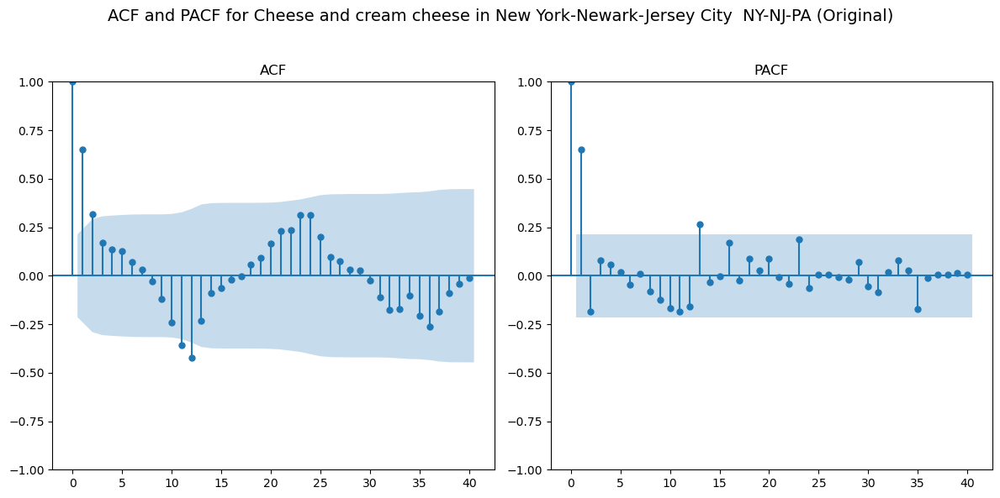


Analyzing Cheese and cream cheese in Philadelphia-Camden-Wilmington  PA-NJ-DE-MD...

Stationarity Check for Cheese and cream cheese in Philadelphia-Camden-Wilmington  PA-NJ-DE-MD (Original):
ADF Statistic: -2.7621
p-value: 0.0639
The data is not stationary.
Differencing the data for Cheese and cream cheese in Philadelphia-Camden-Wilmington  PA-NJ-DE-MD...

Stationarity Check for Cheese and cream cheese in Philadelphia-Camden-Wilmington  PA-NJ-DE-MD (Differenced):
ADF Statistic: -9.1200
p-value: 0.0000
The data is stationary.
Plotting ACF and PACF for differenced data of Cheese and cream cheese in Philadelphia-Camden-Wilmington  PA-NJ-DE-MD...


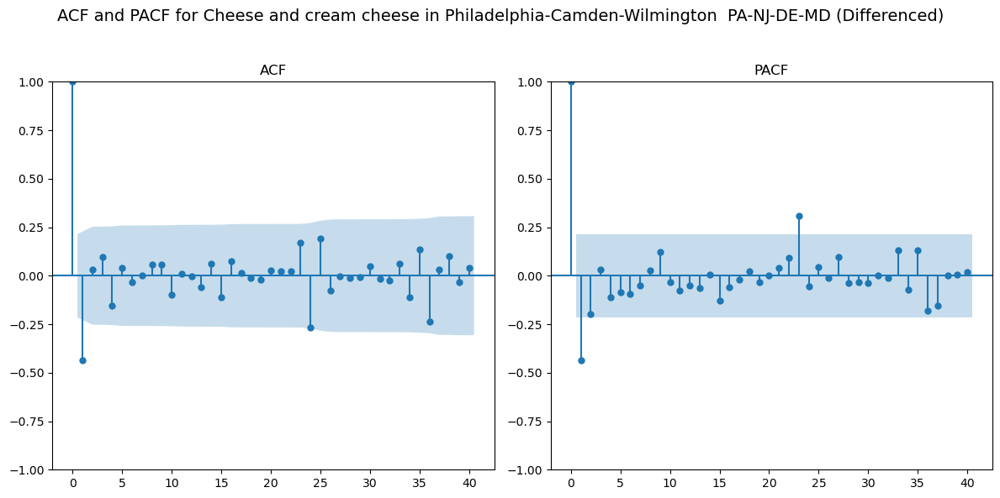


Analyzing Beef, pork, lamb, veal and game, fresh in Atlanta-Sandy Springs-Roswell  GA...

Stationarity Check for Beef, pork, lamb, veal and game, fresh in Atlanta-Sandy Springs-Roswell  GA (Original):
ADF Statistic: -1.8196
p-value: 0.3708
The data is not stationary.
Differencing the data for Beef, pork, lamb, veal and game, fresh in Atlanta-Sandy Springs-Roswell  GA...

Stationarity Check for Beef, pork, lamb, veal and game, fresh in Atlanta-Sandy Springs-Roswell  GA (Differenced):
ADF Statistic: -14.1741
p-value: 0.0000
The data is stationary.
Plotting ACF and PACF for differenced data of Beef, pork, lamb, veal and game, fresh in Atlanta-Sandy Springs-Roswell  GA...


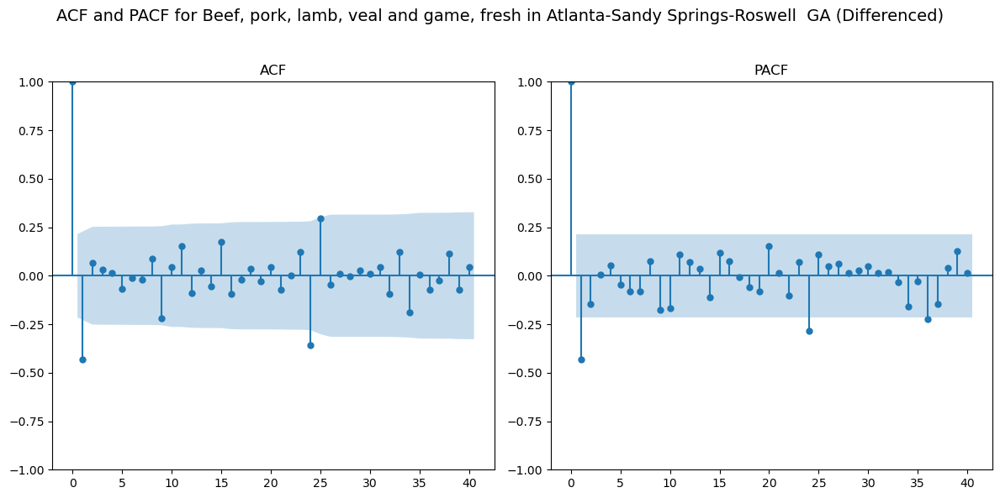


Analyzing Beef, pork, lamb, veal and game, fresh in Boston-Cambridge-Newton  MA-NH...

Stationarity Check for Beef, pork, lamb, veal and game, fresh in Boston-Cambridge-Newton  MA-NH (Original):
ADF Statistic: -1.4074
p-value: 0.5787
The data is not stationary.
Differencing the data for Beef, pork, lamb, veal and game, fresh in Boston-Cambridge-Newton  MA-NH...

Stationarity Check for Beef, pork, lamb, veal and game, fresh in Boston-Cambridge-Newton  MA-NH (Differenced):
ADF Statistic: -9.1802
p-value: 0.0000
The data is stationary.
Plotting ACF and PACF for differenced data of Beef, pork, lamb, veal and game, fresh in Boston-Cambridge-Newton  MA-NH...


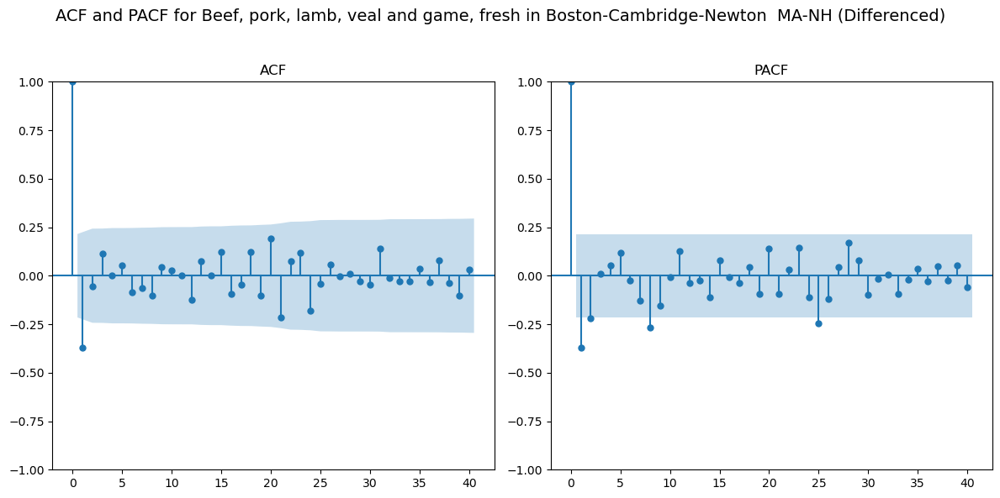


Analyzing Beef, pork, lamb, veal and game, fresh in Chicago-Naperville-Elgin  IL-IN-WI...

Stationarity Check for Beef, pork, lamb, veal and game, fresh in Chicago-Naperville-Elgin  IL-IN-WI (Original):
ADF Statistic: -3.4267
p-value: 0.0101
The data is stationary.
Plotting ACF and PACF for original data of Beef, pork, lamb, veal and game, fresh in Chicago-Naperville-Elgin  IL-IN-WI...


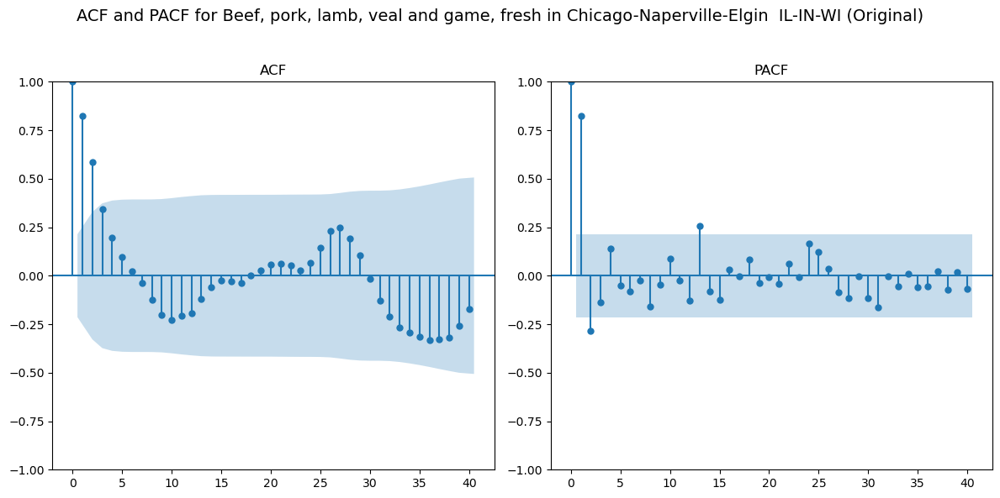


Analyzing Beef, pork, lamb, veal and game, fresh in Dallas-Fort Worth-Arlington  TX...

Stationarity Check for Beef, pork, lamb, veal and game, fresh in Dallas-Fort Worth-Arlington  TX (Original):
ADF Statistic: -1.1669
p-value: 0.6877
The data is not stationary.
Differencing the data for Beef, pork, lamb, veal and game, fresh in Dallas-Fort Worth-Arlington  TX...

Stationarity Check for Beef, pork, lamb, veal and game, fresh in Dallas-Fort Worth-Arlington  TX (Differenced):
ADF Statistic: -7.3665
p-value: 0.0000
The data is stationary.
Plotting ACF and PACF for differenced data of Beef, pork, lamb, veal and game, fresh in Dallas-Fort Worth-Arlington  TX...


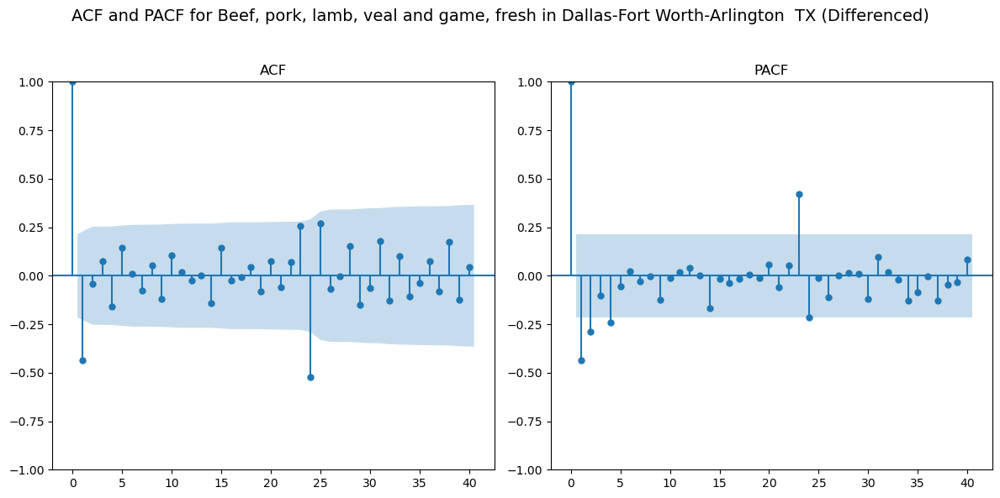


Analyzing Beef, pork, lamb, veal and game, fresh in Detroit-Warren-Dearborn  MI...

Stationarity Check for Beef, pork, lamb, veal and game, fresh in Detroit-Warren-Dearborn  MI (Original):
ADF Statistic: -2.2569
p-value: 0.1862
The data is not stationary.
Differencing the data for Beef, pork, lamb, veal and game, fresh in Detroit-Warren-Dearborn  MI...

Stationarity Check for Beef, pork, lamb, veal and game, fresh in Detroit-Warren-Dearborn  MI (Differenced):
ADF Statistic: -6.5688
p-value: 0.0000
The data is stationary.
Plotting ACF and PACF for differenced data of Beef, pork, lamb, veal and game, fresh in Detroit-Warren-Dearborn  MI...


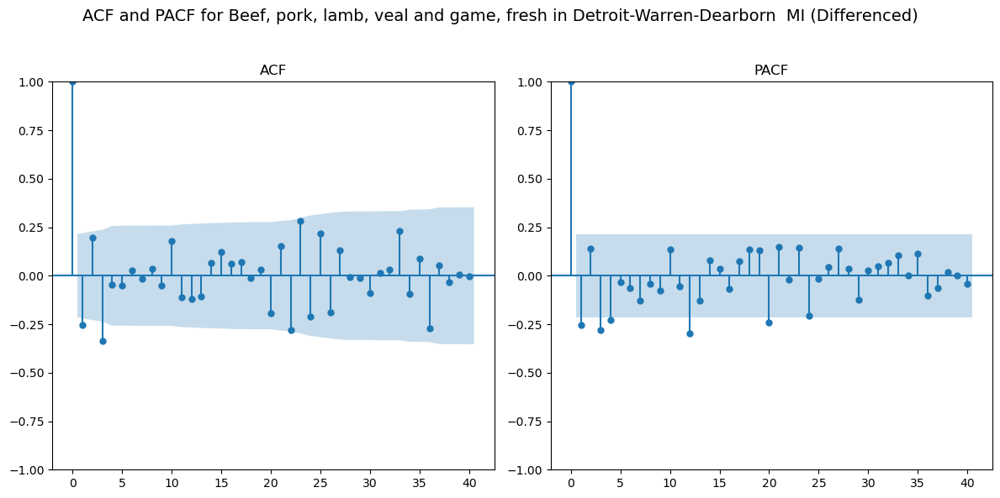


Analyzing Beef, pork, lamb, veal and game, fresh in Houston-The Woodlands-Sugar Land  TX...

Stationarity Check for Beef, pork, lamb, veal and game, fresh in Houston-The Woodlands-Sugar Land  TX (Original):
ADF Statistic: -1.9445
p-value: 0.3114
The data is not stationary.
Differencing the data for Beef, pork, lamb, veal and game, fresh in Houston-The Woodlands-Sugar Land  TX...

Stationarity Check for Beef, pork, lamb, veal and game, fresh in Houston-The Woodlands-Sugar Land  TX (Differenced):
ADF Statistic: -8.8905
p-value: 0.0000
The data is stationary.
Plotting ACF and PACF for differenced data of Beef, pork, lamb, veal and game, fresh in Houston-The Woodlands-Sugar Land  TX...


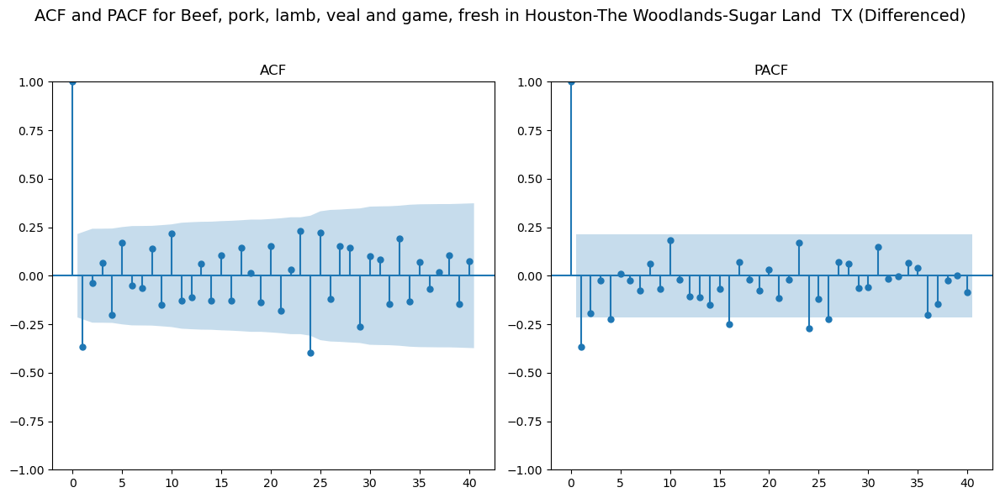


Analyzing Beef, pork, lamb, veal and game, fresh in Los Angeles-Long Beach-Anaheim  CA...

Stationarity Check for Beef, pork, lamb, veal and game, fresh in Los Angeles-Long Beach-Anaheim  CA (Original):
ADF Statistic: -2.0499
p-value: 0.2651
The data is not stationary.
Differencing the data for Beef, pork, lamb, veal and game, fresh in Los Angeles-Long Beach-Anaheim  CA...

Stationarity Check for Beef, pork, lamb, veal and game, fresh in Los Angeles-Long Beach-Anaheim  CA (Differenced):
ADF Statistic: -8.3452
p-value: 0.0000
The data is stationary.
Plotting ACF and PACF for differenced data of Beef, pork, lamb, veal and game, fresh in Los Angeles-Long Beach-Anaheim  CA...


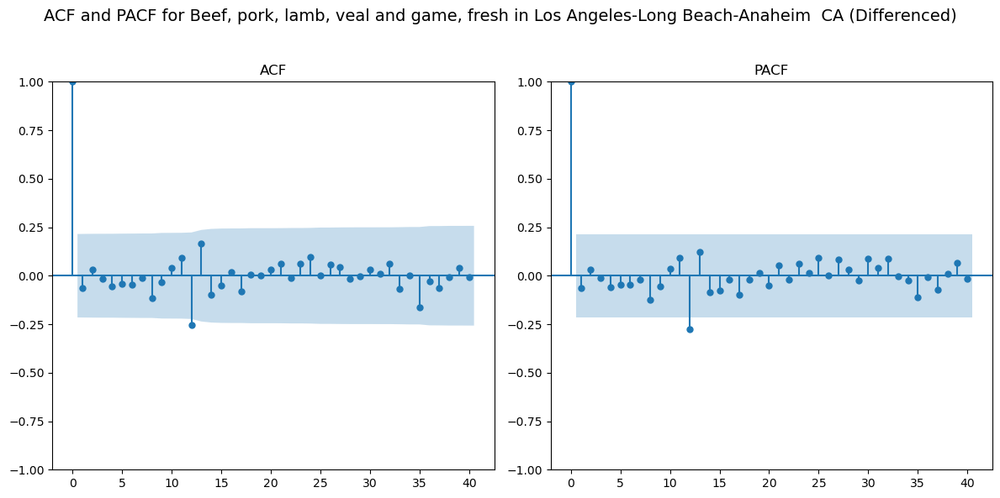


Analyzing Beef, pork, lamb, veal and game, fresh in Miami-Fort Lauderdale-West Palm Beach  FL...

Stationarity Check for Beef, pork, lamb, veal and game, fresh in Miami-Fort Lauderdale-West Palm Beach  FL (Original):
ADF Statistic: -2.4956
p-value: 0.1165
The data is not stationary.
Differencing the data for Beef, pork, lamb, veal and game, fresh in Miami-Fort Lauderdale-West Palm Beach  FL...

Stationarity Check for Beef, pork, lamb, veal and game, fresh in Miami-Fort Lauderdale-West Palm Beach  FL (Differenced):
ADF Statistic: -8.0115
p-value: 0.0000
The data is stationary.
Plotting ACF and PACF for differenced data of Beef, pork, lamb, veal and game, fresh in Miami-Fort Lauderdale-West Palm Beach  FL...


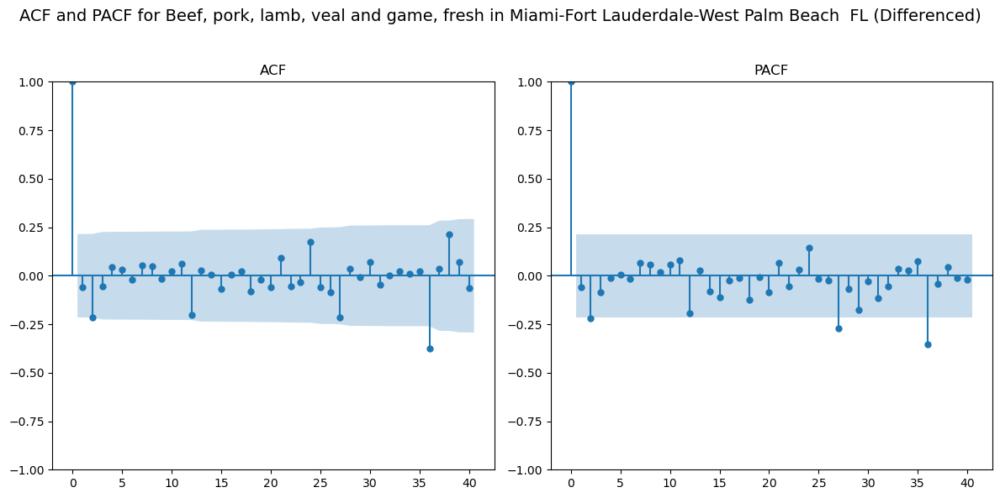


Analyzing Beef, pork, lamb, veal and game, fresh in New York-Newark-Jersey City  NY-NJ-PA...

Stationarity Check for Beef, pork, lamb, veal and game, fresh in New York-Newark-Jersey City  NY-NJ-PA (Original):
ADF Statistic: -3.9122
p-value: 0.0019
The data is stationary.
Plotting ACF and PACF for original data of Beef, pork, lamb, veal and game, fresh in New York-Newark-Jersey City  NY-NJ-PA...


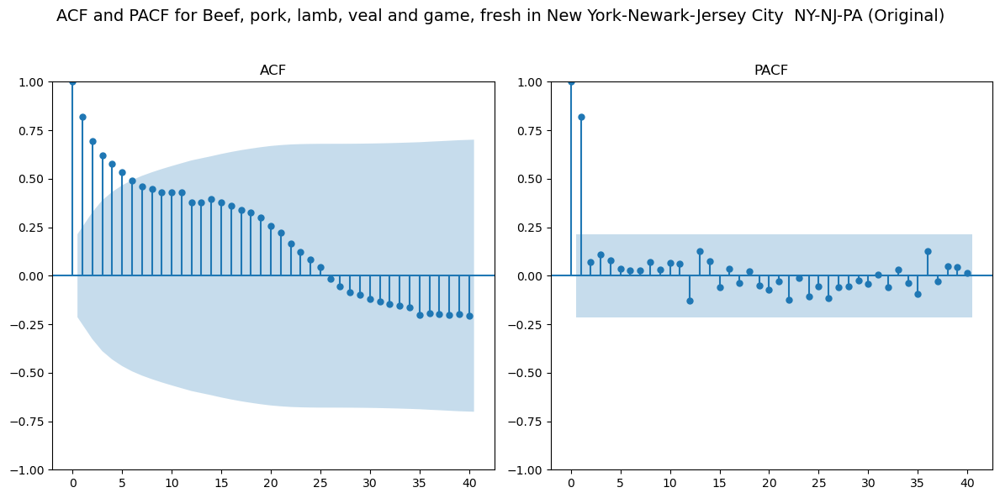


Analyzing Beef, pork, lamb, veal and game, fresh in Philadelphia-Camden-Wilmington  PA-NJ-DE-MD...

Stationarity Check for Beef, pork, lamb, veal and game, fresh in Philadelphia-Camden-Wilmington  PA-NJ-DE-MD (Original):
ADF Statistic: -3.6041
p-value: 0.0057
The data is stationary.
Plotting ACF and PACF for original data of Beef, pork, lamb, veal and game, fresh in Philadelphia-Camden-Wilmington  PA-NJ-DE-MD...


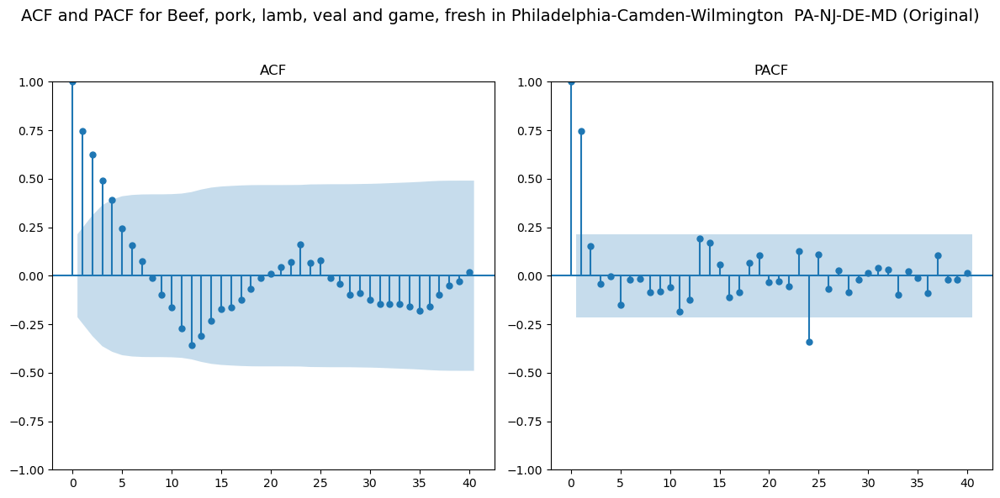


Analyzing Bacon, sausage, and lunch meats in Atlanta-Sandy Springs-Roswell  GA...

Stationarity Check for Bacon, sausage, and lunch meats in Atlanta-Sandy Springs-Roswell  GA (Original):
ADF Statistic: -1.8904
p-value: 0.3366
The data is not stationary.
Differencing the data for Bacon, sausage, and lunch meats in Atlanta-Sandy Springs-Roswell  GA...

Stationarity Check for Bacon, sausage, and lunch meats in Atlanta-Sandy Springs-Roswell  GA (Differenced):
ADF Statistic: -14.9031
p-value: 0.0000
The data is stationary.
Plotting ACF and PACF for differenced data of Bacon, sausage, and lunch meats in Atlanta-Sandy Springs-Roswell  GA...


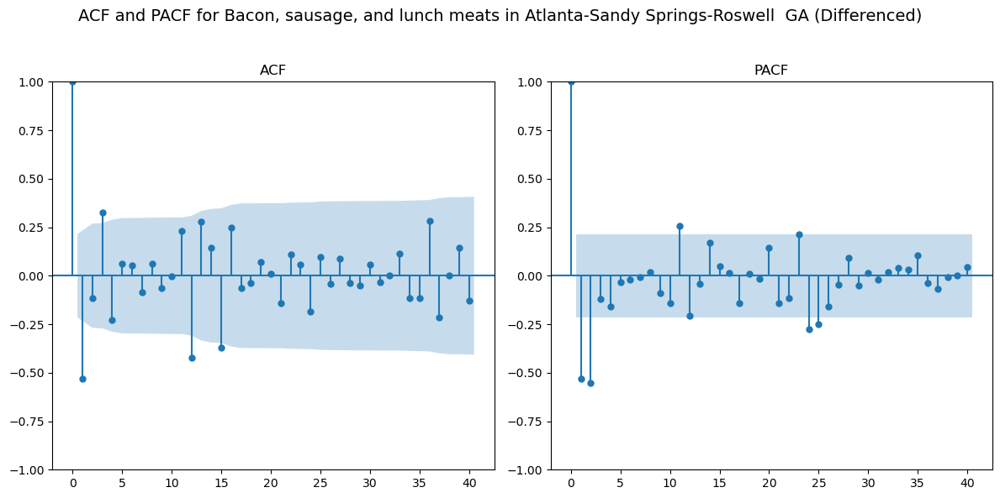


Analyzing Bacon, sausage, and lunch meats in Boston-Cambridge-Newton  MA-NH...

Stationarity Check for Bacon, sausage, and lunch meats in Boston-Cambridge-Newton  MA-NH (Original):
ADF Statistic: -1.3658
p-value: 0.5986
The data is not stationary.
Differencing the data for Bacon, sausage, and lunch meats in Boston-Cambridge-Newton  MA-NH...

Stationarity Check for Bacon, sausage, and lunch meats in Boston-Cambridge-Newton  MA-NH (Differenced):
ADF Statistic: -8.1946
p-value: 0.0000
The data is stationary.
Plotting ACF and PACF for differenced data of Bacon, sausage, and lunch meats in Boston-Cambridge-Newton  MA-NH...


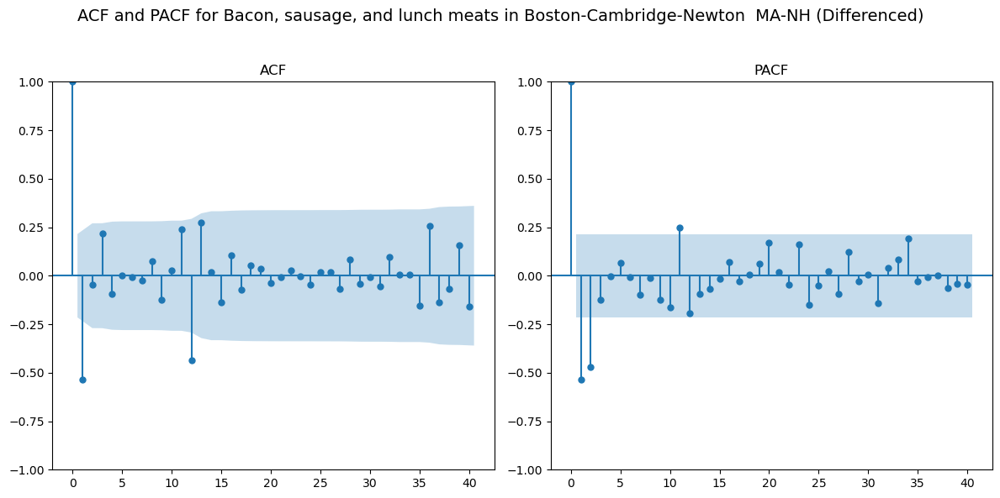


Analyzing Bacon, sausage, and lunch meats in Chicago-Naperville-Elgin  IL-IN-WI...

Stationarity Check for Bacon, sausage, and lunch meats in Chicago-Naperville-Elgin  IL-IN-WI (Original):
ADF Statistic: -3.5828
p-value: 0.0061
The data is stationary.
Plotting ACF and PACF for original data of Bacon, sausage, and lunch meats in Chicago-Naperville-Elgin  IL-IN-WI...


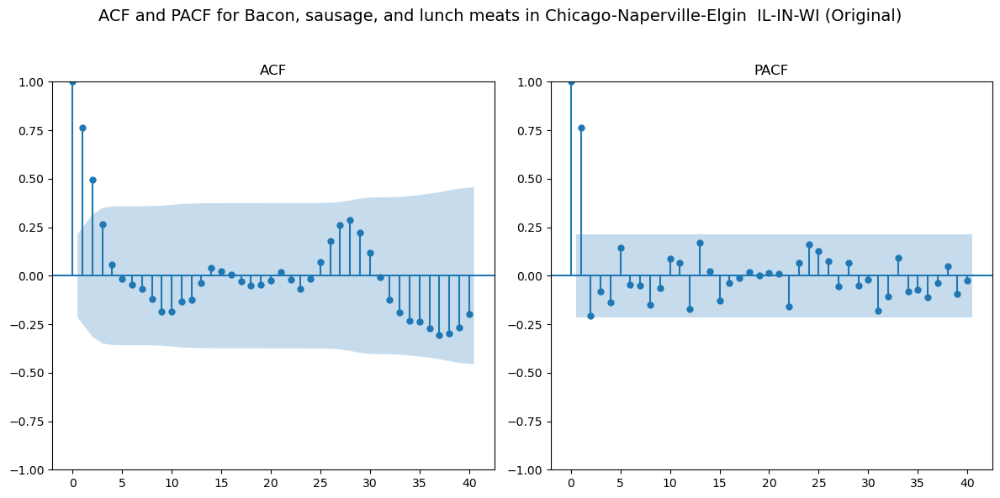


Analyzing Bacon, sausage, and lunch meats in Dallas-Fort Worth-Arlington  TX...

Stationarity Check for Bacon, sausage, and lunch meats in Dallas-Fort Worth-Arlington  TX (Original):
ADF Statistic: -0.8250
p-value: 0.8117
The data is not stationary.
Differencing the data for Bacon, sausage, and lunch meats in Dallas-Fort Worth-Arlington  TX...

Stationarity Check for Bacon, sausage, and lunch meats in Dallas-Fort Worth-Arlington  TX (Differenced):
ADF Statistic: -13.6652
p-value: 0.0000
The data is stationary.
Plotting ACF and PACF for differenced data of Bacon, sausage, and lunch meats in Dallas-Fort Worth-Arlington  TX...


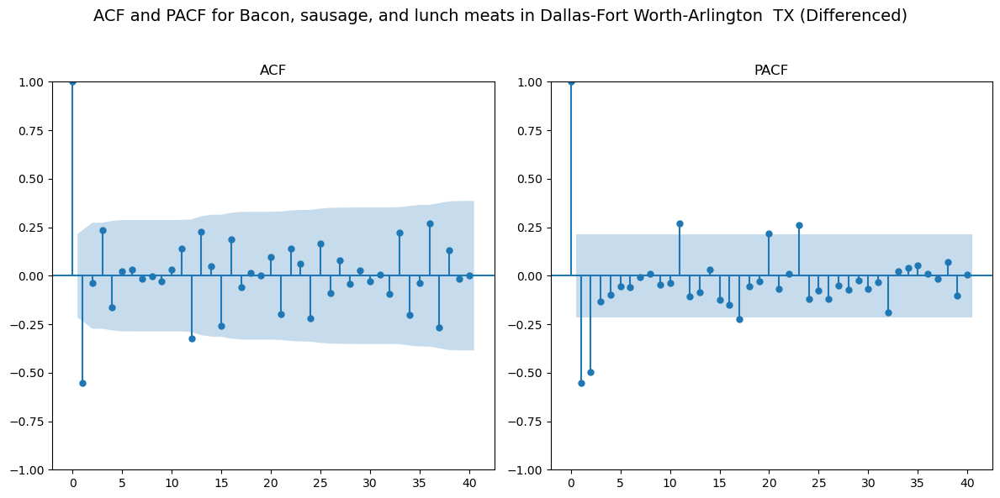


Analyzing Bacon, sausage, and lunch meats in Detroit-Warren-Dearborn  MI...

Stationarity Check for Bacon, sausage, and lunch meats in Detroit-Warren-Dearborn  MI (Original):
ADF Statistic: -2.0942
p-value: 0.2469
The data is not stationary.
Differencing the data for Bacon, sausage, and lunch meats in Detroit-Warren-Dearborn  MI...

Stationarity Check for Bacon, sausage, and lunch meats in Detroit-Warren-Dearborn  MI (Differenced):
ADF Statistic: -12.0425
p-value: 0.0000
The data is stationary.
Plotting ACF and PACF for differenced data of Bacon, sausage, and lunch meats in Detroit-Warren-Dearborn  MI...


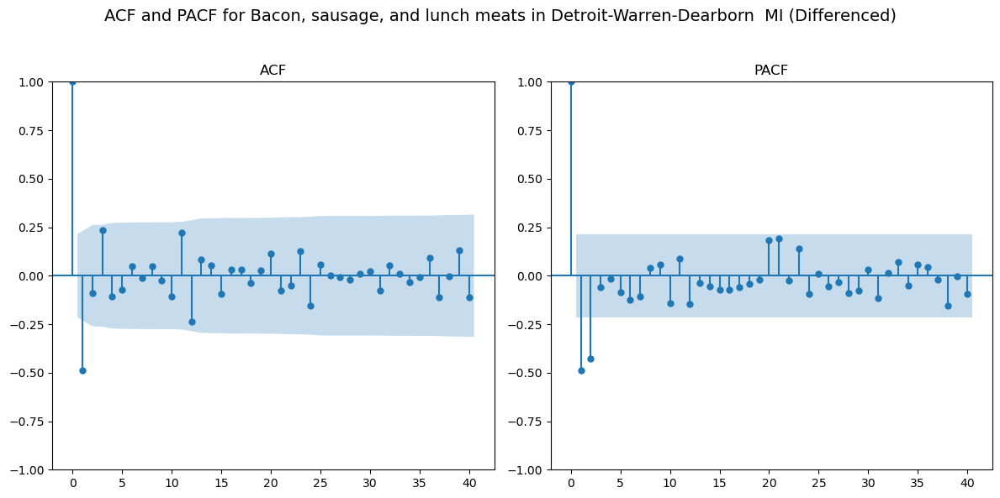


Analyzing Bacon, sausage, and lunch meats in Houston-The Woodlands-Sugar Land  TX...

Stationarity Check for Bacon, sausage, and lunch meats in Houston-The Woodlands-Sugar Land  TX (Original):
ADF Statistic: -1.9885
p-value: 0.2916
The data is not stationary.
Differencing the data for Bacon, sausage, and lunch meats in Houston-The Woodlands-Sugar Land  TX...

Stationarity Check for Bacon, sausage, and lunch meats in Houston-The Woodlands-Sugar Land  TX (Differenced):
ADF Statistic: -5.3374
p-value: 0.0000
The data is stationary.
Plotting ACF and PACF for differenced data of Bacon, sausage, and lunch meats in Houston-The Woodlands-Sugar Land  TX...


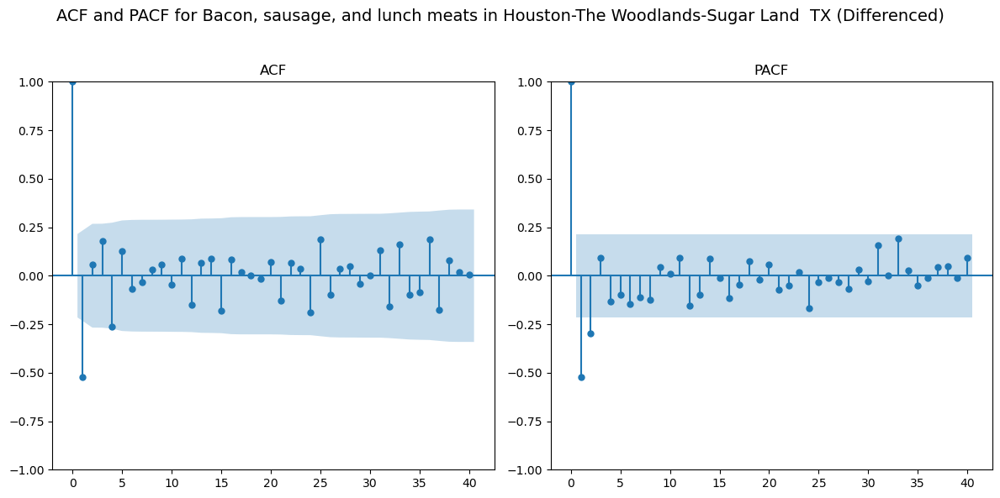


Analyzing Bacon, sausage, and lunch meats in Los Angeles-Long Beach-Anaheim  CA...

Stationarity Check for Bacon, sausage, and lunch meats in Los Angeles-Long Beach-Anaheim  CA (Original):
ADF Statistic: -3.5083
p-value: 0.0078
The data is stationary.
Plotting ACF and PACF for original data of Bacon, sausage, and lunch meats in Los Angeles-Long Beach-Anaheim  CA...


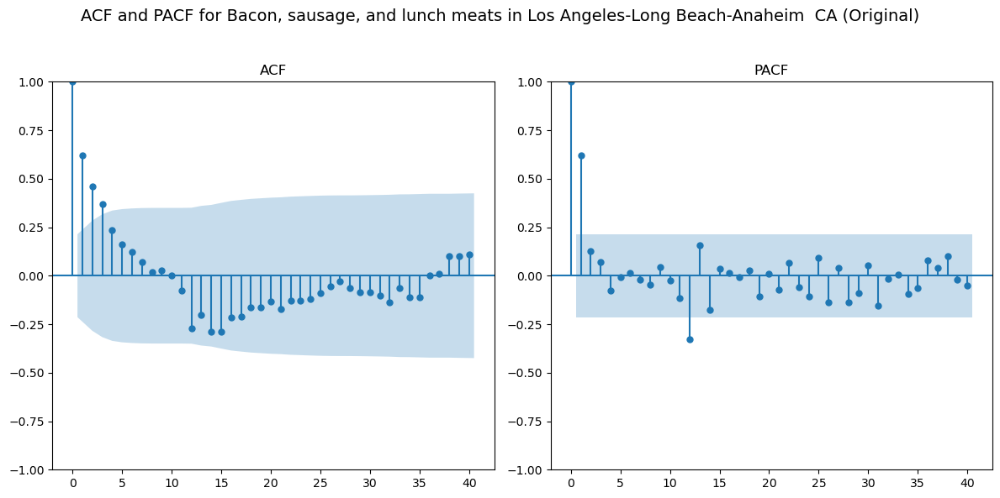


Analyzing Bacon, sausage, and lunch meats in Miami-Fort Lauderdale-West Palm Beach  FL...

Stationarity Check for Bacon, sausage, and lunch meats in Miami-Fort Lauderdale-West Palm Beach  FL (Original):
ADF Statistic: -2.8979
p-value: 0.0456
The data is stationary.
Plotting ACF and PACF for original data of Bacon, sausage, and lunch meats in Miami-Fort Lauderdale-West Palm Beach  FL...


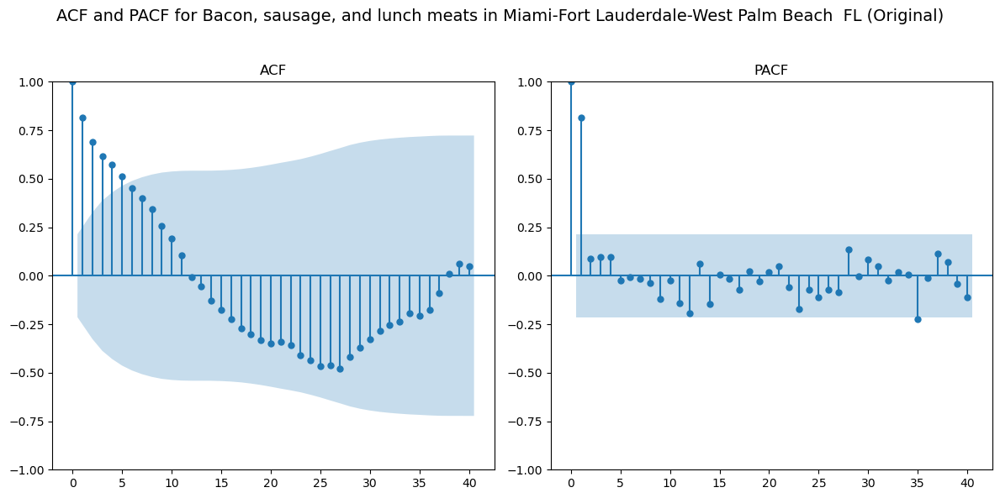


Analyzing Bacon, sausage, and lunch meats in New York-Newark-Jersey City  NY-NJ-PA...

Stationarity Check for Bacon, sausage, and lunch meats in New York-Newark-Jersey City  NY-NJ-PA (Original):
ADF Statistic: -4.2469
p-value: 0.0005
The data is stationary.
Plotting ACF and PACF for original data of Bacon, sausage, and lunch meats in New York-Newark-Jersey City  NY-NJ-PA...


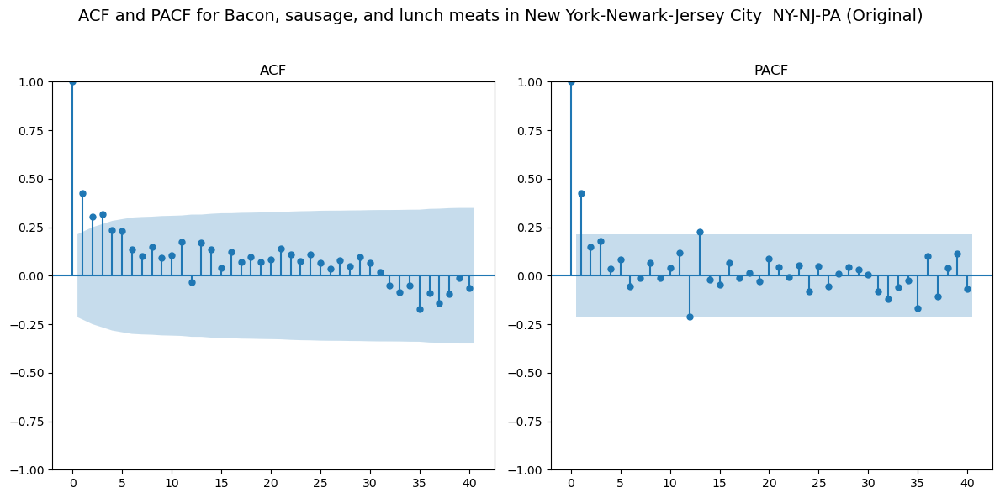


Analyzing Bacon, sausage, and lunch meats in Philadelphia-Camden-Wilmington  PA-NJ-DE-MD...

Stationarity Check for Bacon, sausage, and lunch meats in Philadelphia-Camden-Wilmington  PA-NJ-DE-MD (Original):
ADF Statistic: -3.8028
p-value: 0.0029
The data is stationary.
Plotting ACF and PACF for original data of Bacon, sausage, and lunch meats in Philadelphia-Camden-Wilmington  PA-NJ-DE-MD...


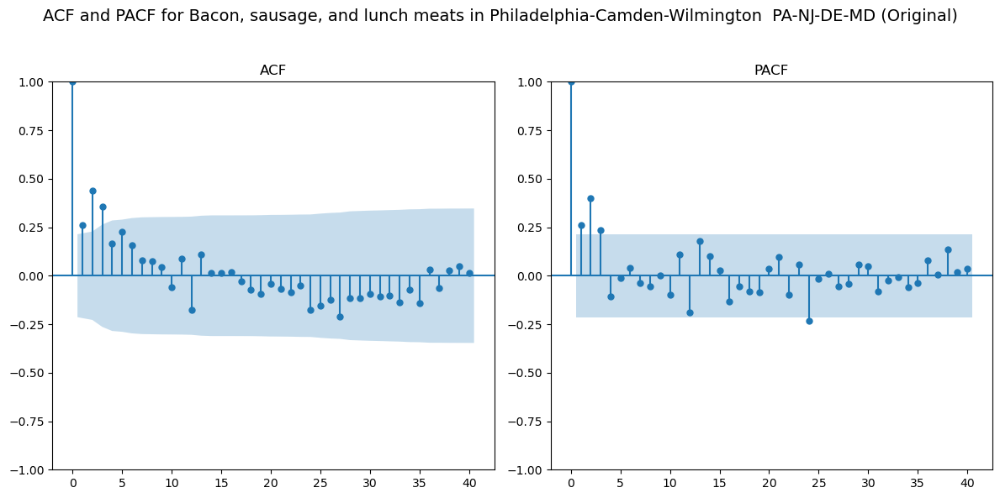


Analyzing Egg and egg substitutes in Atlanta-Sandy Springs-Roswell  GA...

Stationarity Check for Egg and egg substitutes in Atlanta-Sandy Springs-Roswell  GA (Original):
ADF Statistic: -1.7714
p-value: 0.3947
The data is not stationary.
Differencing the data for Egg and egg substitutes in Atlanta-Sandy Springs-Roswell  GA...

Stationarity Check for Egg and egg substitutes in Atlanta-Sandy Springs-Roswell  GA (Differenced):
ADF Statistic: -2.8939
p-value: 0.0461
The data is stationary.
Plotting ACF and PACF for differenced data of Egg and egg substitutes in Atlanta-Sandy Springs-Roswell  GA...


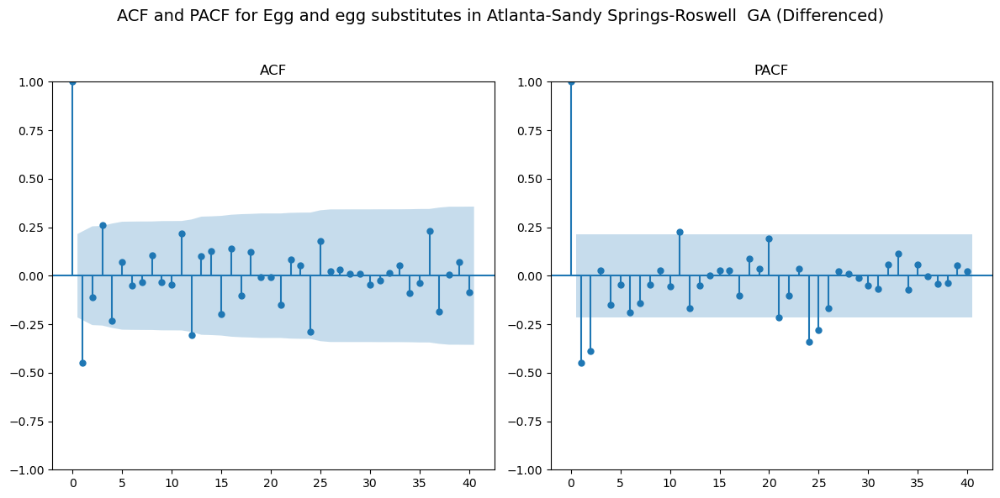


Analyzing Egg and egg substitutes in Boston-Cambridge-Newton  MA-NH...

Stationarity Check for Egg and egg substitutes in Boston-Cambridge-Newton  MA-NH (Original):
ADF Statistic: -5.9417
p-value: 0.0000
The data is stationary.
Plotting ACF and PACF for original data of Egg and egg substitutes in Boston-Cambridge-Newton  MA-NH...


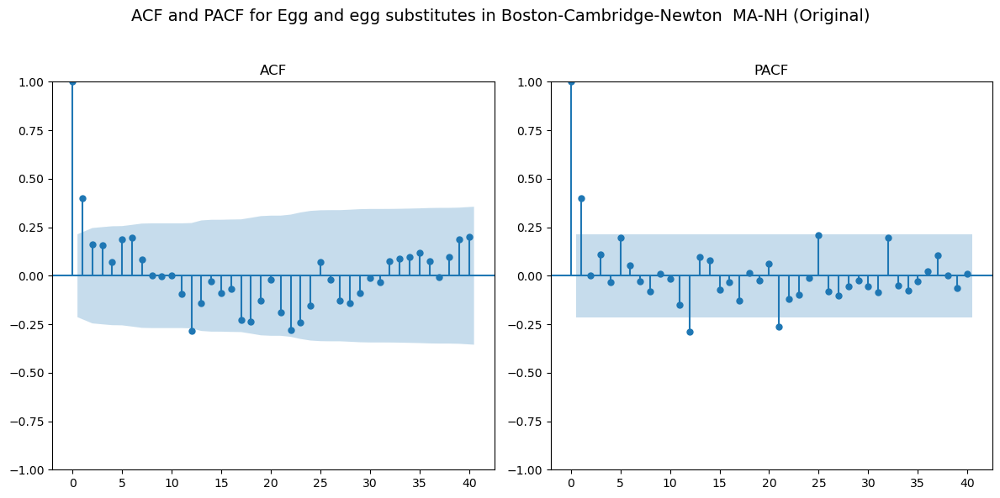


Analyzing Egg and egg substitutes in Chicago-Naperville-Elgin  IL-IN-WI...

Stationarity Check for Egg and egg substitutes in Chicago-Naperville-Elgin  IL-IN-WI (Original):
ADF Statistic: -0.9381
p-value: 0.7752
The data is not stationary.
Differencing the data for Egg and egg substitutes in Chicago-Naperville-Elgin  IL-IN-WI...

Stationarity Check for Egg and egg substitutes in Chicago-Naperville-Elgin  IL-IN-WI (Differenced):
ADF Statistic: -6.1153
p-value: 0.0000
The data is stationary.
Plotting ACF and PACF for differenced data of Egg and egg substitutes in Chicago-Naperville-Elgin  IL-IN-WI...


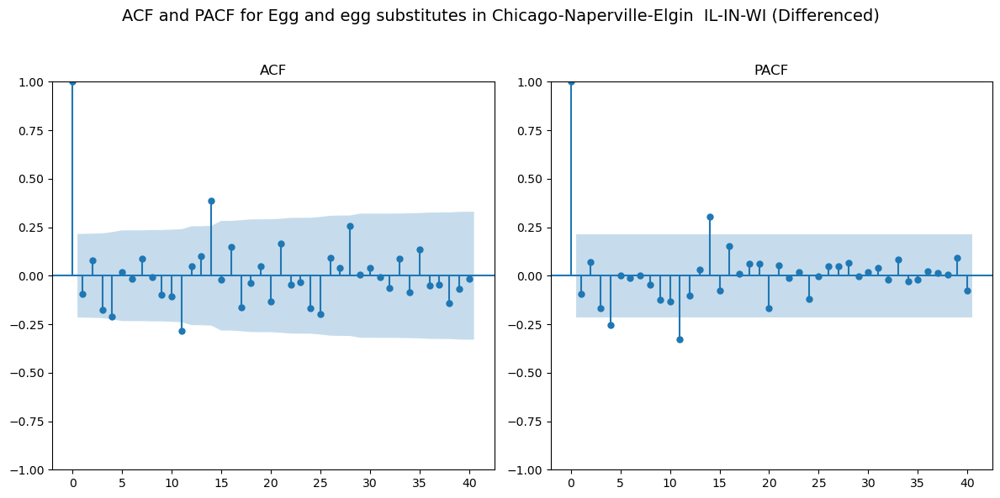


Analyzing Egg and egg substitutes in Dallas-Fort Worth-Arlington  TX...

Stationarity Check for Egg and egg substitutes in Dallas-Fort Worth-Arlington  TX (Original):
ADF Statistic: -1.9164
p-value: 0.3244
The data is not stationary.
Differencing the data for Egg and egg substitutes in Dallas-Fort Worth-Arlington  TX...

Stationarity Check for Egg and egg substitutes in Dallas-Fort Worth-Arlington  TX (Differenced):
ADF Statistic: -5.7206
p-value: 0.0000
The data is stationary.
Plotting ACF and PACF for differenced data of Egg and egg substitutes in Dallas-Fort Worth-Arlington  TX...


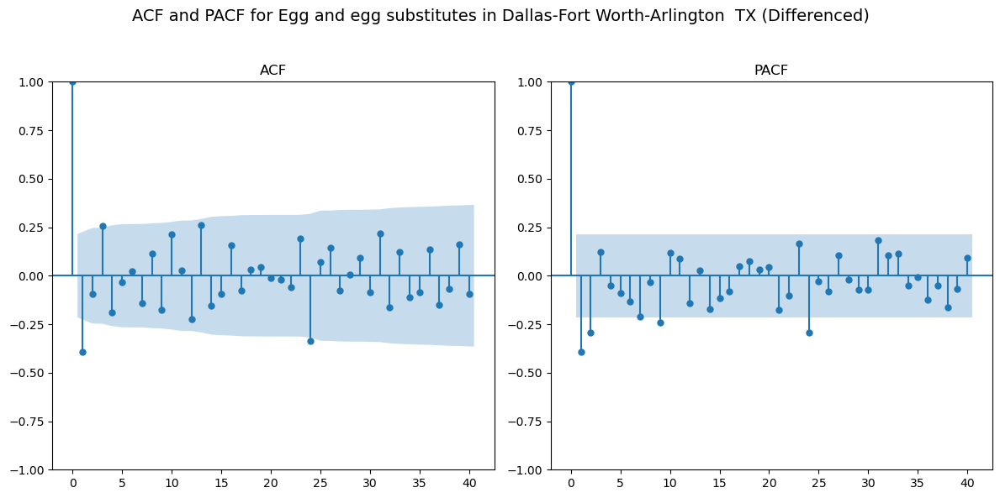


Analyzing Egg and egg substitutes in Detroit-Warren-Dearborn  MI...

Stationarity Check for Egg and egg substitutes in Detroit-Warren-Dearborn  MI (Original):
ADF Statistic: -1.4090
p-value: 0.5779
The data is not stationary.
Differencing the data for Egg and egg substitutes in Detroit-Warren-Dearborn  MI...

Stationarity Check for Egg and egg substitutes in Detroit-Warren-Dearborn  MI (Differenced):
ADF Statistic: -3.1550
p-value: 0.0227
The data is stationary.
Plotting ACF and PACF for differenced data of Egg and egg substitutes in Detroit-Warren-Dearborn  MI...


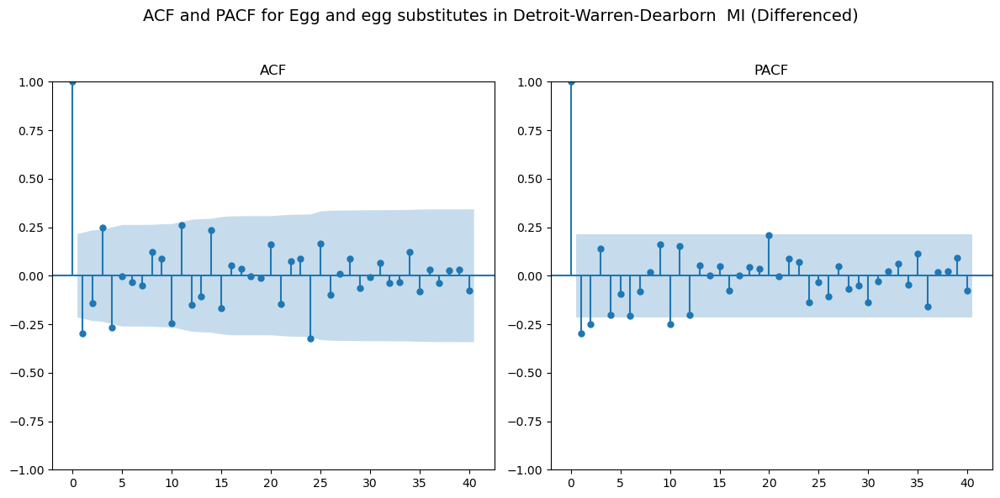


Analyzing Egg and egg substitutes in Houston-The Woodlands-Sugar Land  TX...

Stationarity Check for Egg and egg substitutes in Houston-The Woodlands-Sugar Land  TX (Original):
ADF Statistic: -2.9236
p-value: 0.0427
The data is stationary.
Plotting ACF and PACF for original data of Egg and egg substitutes in Houston-The Woodlands-Sugar Land  TX...


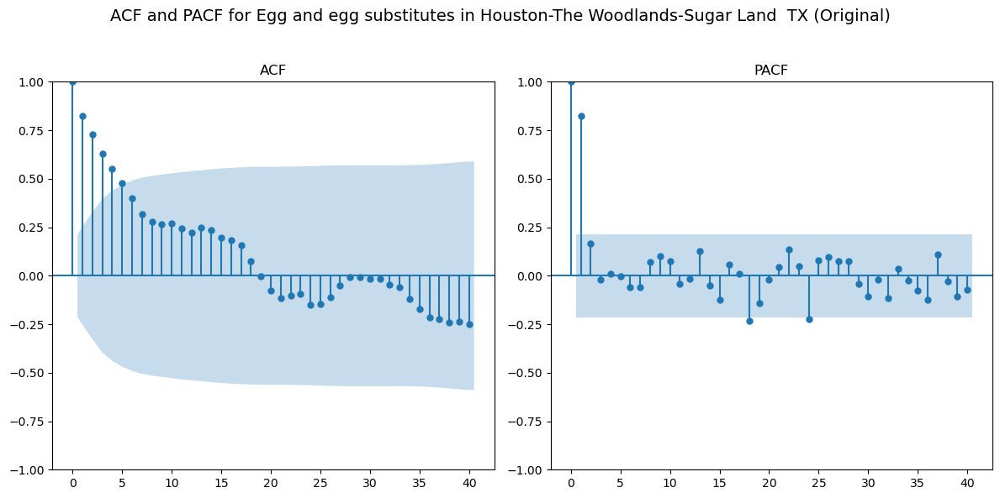


Analyzing Egg and egg substitutes in Los Angeles-Long Beach-Anaheim  CA...

Stationarity Check for Egg and egg substitutes in Los Angeles-Long Beach-Anaheim  CA (Original):
ADF Statistic: -1.0584
p-value: 0.7314
The data is not stationary.
Differencing the data for Egg and egg substitutes in Los Angeles-Long Beach-Anaheim  CA...

Stationarity Check for Egg and egg substitutes in Los Angeles-Long Beach-Anaheim  CA (Differenced):
ADF Statistic: -7.9360
p-value: 0.0000
The data is stationary.
Plotting ACF and PACF for differenced data of Egg and egg substitutes in Los Angeles-Long Beach-Anaheim  CA...


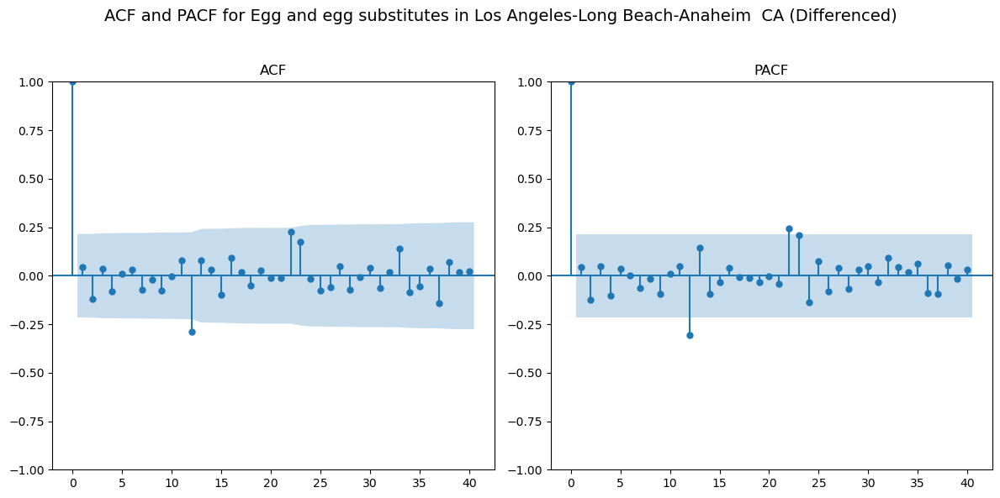


Analyzing Egg and egg substitutes in Miami-Fort Lauderdale-West Palm Beach  FL...

Stationarity Check for Egg and egg substitutes in Miami-Fort Lauderdale-West Palm Beach  FL (Original):
ADF Statistic: -2.4910
p-value: 0.1177
The data is not stationary.
Differencing the data for Egg and egg substitutes in Miami-Fort Lauderdale-West Palm Beach  FL...

Stationarity Check for Egg and egg substitutes in Miami-Fort Lauderdale-West Palm Beach  FL (Differenced):
ADF Statistic: -10.6745
p-value: 0.0000
The data is stationary.
Plotting ACF and PACF for differenced data of Egg and egg substitutes in Miami-Fort Lauderdale-West Palm Beach  FL...


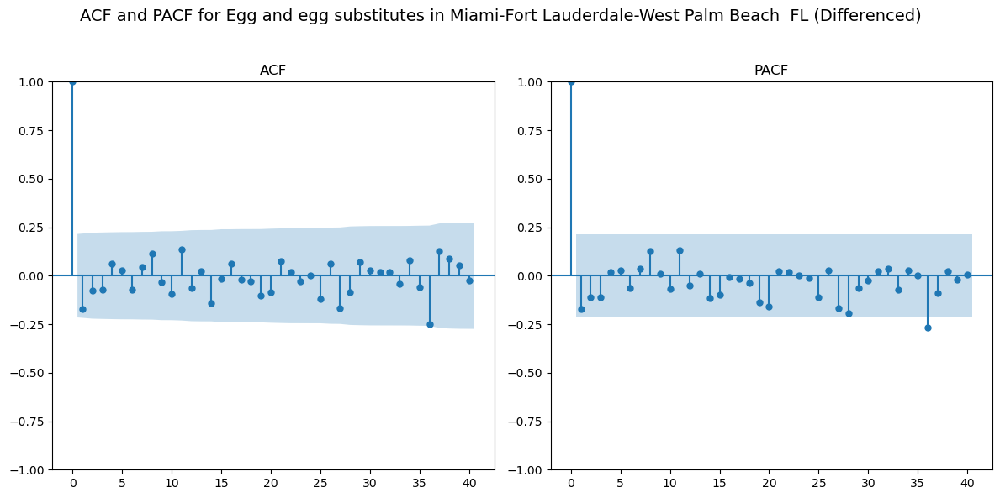


Analyzing Egg and egg substitutes in New York-Newark-Jersey City  NY-NJ-PA...

Stationarity Check for Egg and egg substitutes in New York-Newark-Jersey City  NY-NJ-PA (Original):
ADF Statistic: -2.2607
p-value: 0.1850
The data is not stationary.
Differencing the data for Egg and egg substitutes in New York-Newark-Jersey City  NY-NJ-PA...

Stationarity Check for Egg and egg substitutes in New York-Newark-Jersey City  NY-NJ-PA (Differenced):
ADF Statistic: -11.9105
p-value: 0.0000
The data is stationary.
Plotting ACF and PACF for differenced data of Egg and egg substitutes in New York-Newark-Jersey City  NY-NJ-PA...


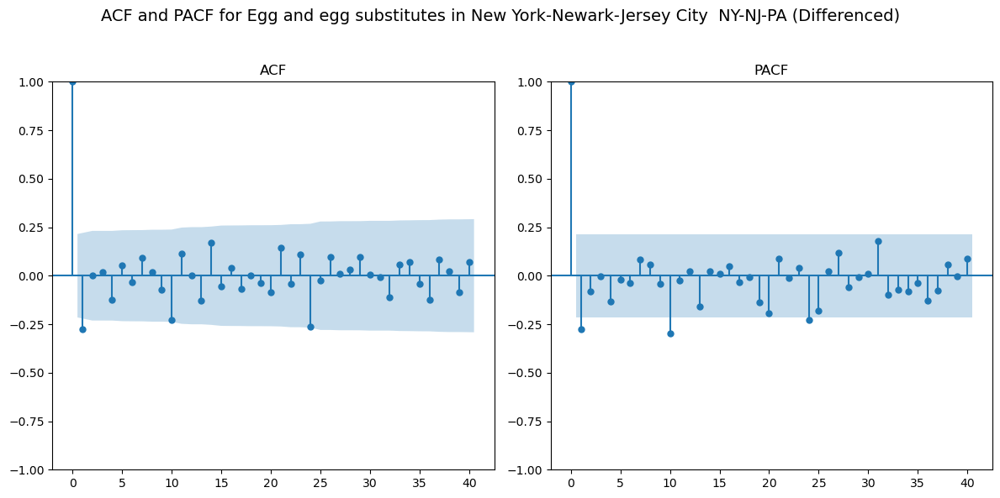


Analyzing Egg and egg substitutes in Philadelphia-Camden-Wilmington  PA-NJ-DE-MD...

Stationarity Check for Egg and egg substitutes in Philadelphia-Camden-Wilmington  PA-NJ-DE-MD (Original):
ADF Statistic: -2.0868
p-value: 0.2498
The data is not stationary.
Differencing the data for Egg and egg substitutes in Philadelphia-Camden-Wilmington  PA-NJ-DE-MD...

Stationarity Check for Egg and egg substitutes in Philadelphia-Camden-Wilmington  PA-NJ-DE-MD (Differenced):
ADF Statistic: -5.6496
p-value: 0.0000
The data is stationary.
Plotting ACF and PACF for differenced data of Egg and egg substitutes in Philadelphia-Camden-Wilmington  PA-NJ-DE-MD...


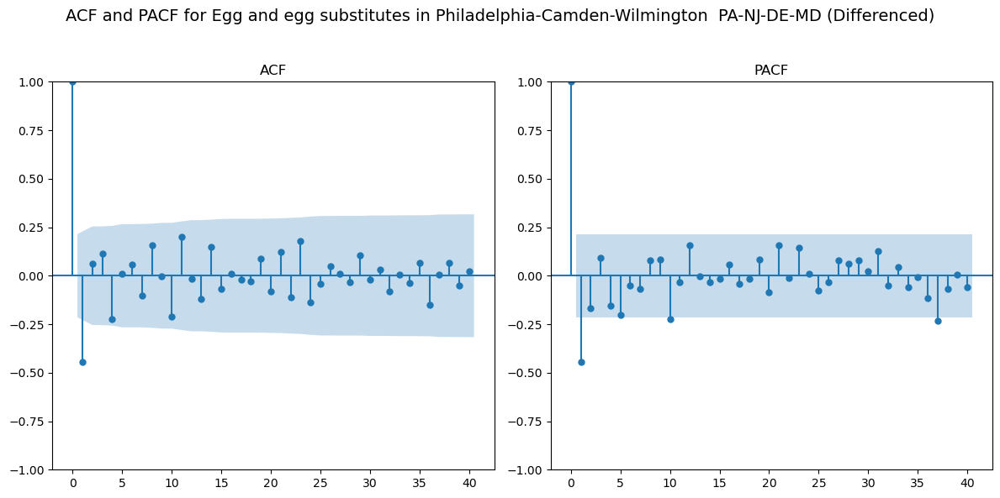


Analyzing Frozen and refrigerated ready-to-heat foods in Atlanta-Sandy Springs-Roswell  GA...

Stationarity Check for Frozen and refrigerated ready-to-heat foods in Atlanta-Sandy Springs-Roswell  GA (Original):
ADF Statistic: -1.9605
p-value: 0.3042
The data is not stationary.
Differencing the data for Frozen and refrigerated ready-to-heat foods in Atlanta-Sandy Springs-Roswell  GA...

Stationarity Check for Frozen and refrigerated ready-to-heat foods in Atlanta-Sandy Springs-Roswell  GA (Differenced):
ADF Statistic: -10.1215
p-value: 0.0000
The data is stationary.
Plotting ACF and PACF for differenced data of Frozen and refrigerated ready-to-heat foods in Atlanta-Sandy Springs-Roswell  GA...


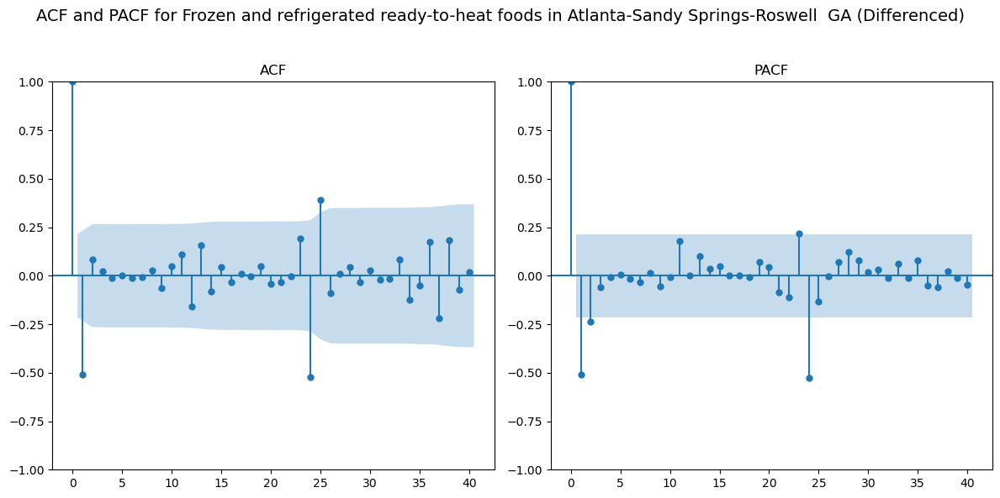


Analyzing Frozen and refrigerated ready-to-heat foods in Boston-Cambridge-Newton  MA-NH...

Stationarity Check for Frozen and refrigerated ready-to-heat foods in Boston-Cambridge-Newton  MA-NH (Original):
ADF Statistic: -2.6451
p-value: 0.0840
The data is not stationary.
Differencing the data for Frozen and refrigerated ready-to-heat foods in Boston-Cambridge-Newton  MA-NH...

Stationarity Check for Frozen and refrigerated ready-to-heat foods in Boston-Cambridge-Newton  MA-NH (Differenced):
ADF Statistic: -4.2165
p-value: 0.0006
The data is stationary.
Plotting ACF and PACF for differenced data of Frozen and refrigerated ready-to-heat foods in Boston-Cambridge-Newton  MA-NH...


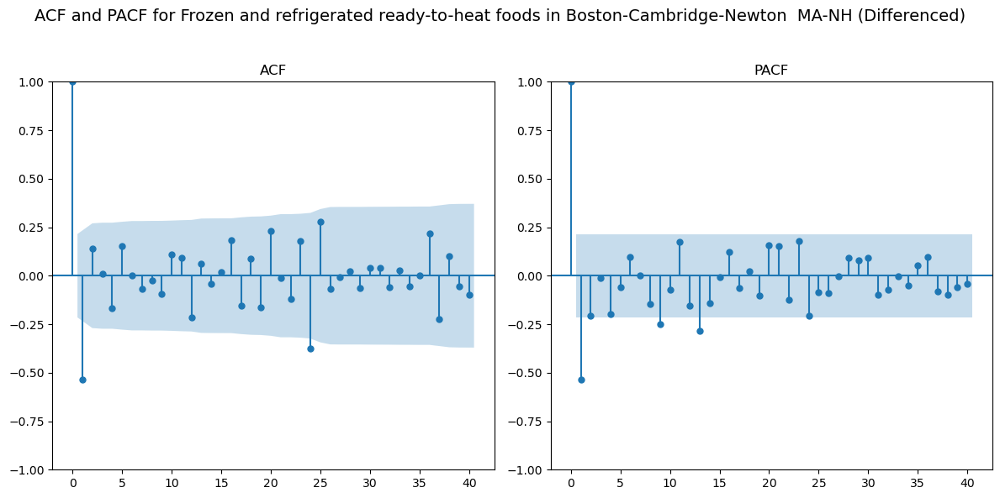


Analyzing Frozen and refrigerated ready-to-heat foods in Chicago-Naperville-Elgin  IL-IN-WI...

Stationarity Check for Frozen and refrigerated ready-to-heat foods in Chicago-Naperville-Elgin  IL-IN-WI (Original):
ADF Statistic: -4.0667
p-value: 0.0011
The data is stationary.
Plotting ACF and PACF for original data of Frozen and refrigerated ready-to-heat foods in Chicago-Naperville-Elgin  IL-IN-WI...


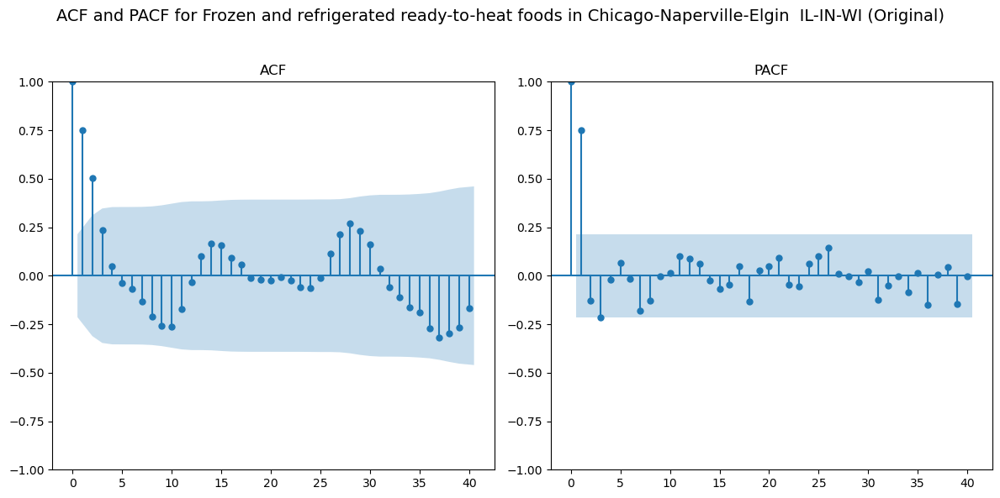


Analyzing Frozen and refrigerated ready-to-heat foods in Dallas-Fort Worth-Arlington  TX...

Stationarity Check for Frozen and refrigerated ready-to-heat foods in Dallas-Fort Worth-Arlington  TX (Original):
ADF Statistic: -0.2932
p-value: 0.9265
The data is not stationary.
Differencing the data for Frozen and refrigerated ready-to-heat foods in Dallas-Fort Worth-Arlington  TX...

Stationarity Check for Frozen and refrigerated ready-to-heat foods in Dallas-Fort Worth-Arlington  TX (Differenced):
ADF Statistic: -7.6792
p-value: 0.0000
The data is stationary.
Plotting ACF and PACF for differenced data of Frozen and refrigerated ready-to-heat foods in Dallas-Fort Worth-Arlington  TX...


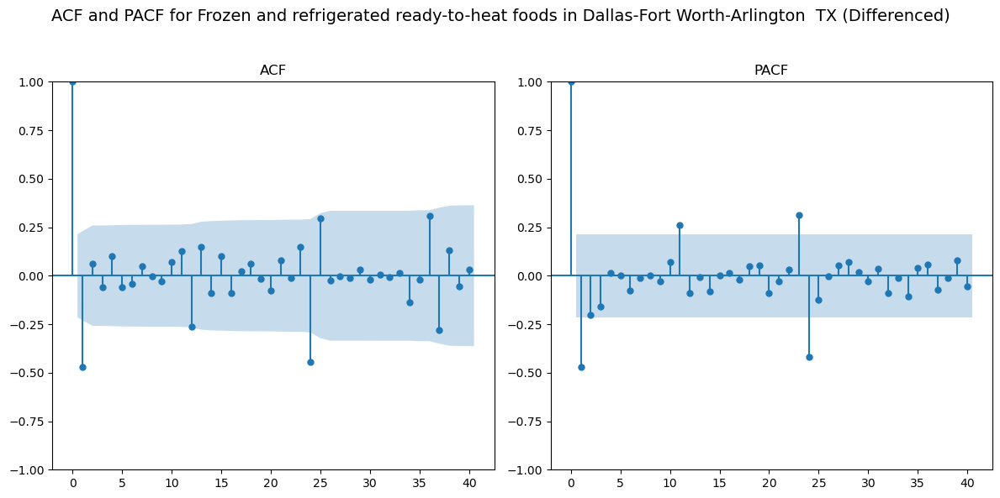


Analyzing Frozen and refrigerated ready-to-heat foods in Detroit-Warren-Dearborn  MI...

Stationarity Check for Frozen and refrigerated ready-to-heat foods in Detroit-Warren-Dearborn  MI (Original):
ADF Statistic: -2.7812
p-value: 0.0610
The data is not stationary.
Differencing the data for Frozen and refrigerated ready-to-heat foods in Detroit-Warren-Dearborn  MI...

Stationarity Check for Frozen and refrigerated ready-to-heat foods in Detroit-Warren-Dearborn  MI (Differenced):
ADF Statistic: -13.4737
p-value: 0.0000
The data is stationary.
Plotting ACF and PACF for differenced data of Frozen and refrigerated ready-to-heat foods in Detroit-Warren-Dearborn  MI...


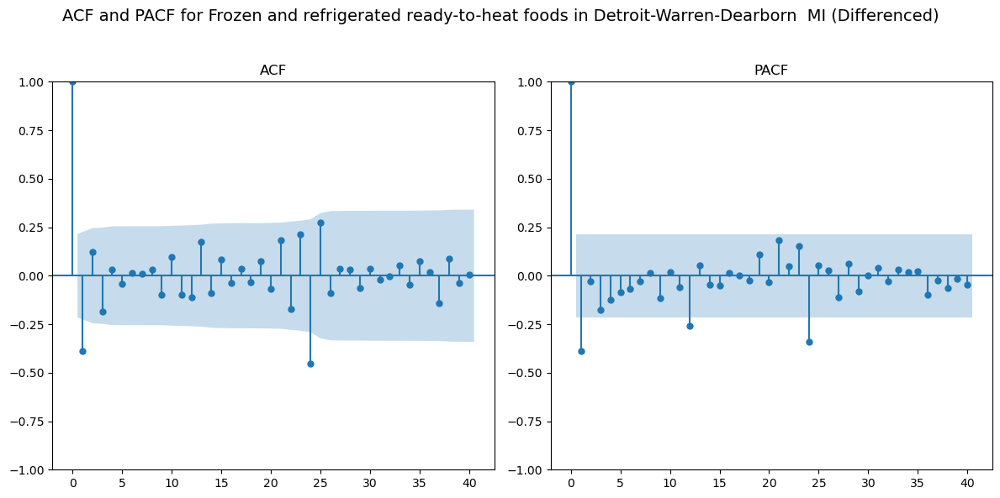


Analyzing Frozen and refrigerated ready-to-heat foods in Houston-The Woodlands-Sugar Land  TX...

Stationarity Check for Frozen and refrigerated ready-to-heat foods in Houston-The Woodlands-Sugar Land  TX (Original):
ADF Statistic: -3.1256
p-value: 0.0247
The data is stationary.
Plotting ACF and PACF for original data of Frozen and refrigerated ready-to-heat foods in Houston-The Woodlands-Sugar Land  TX...


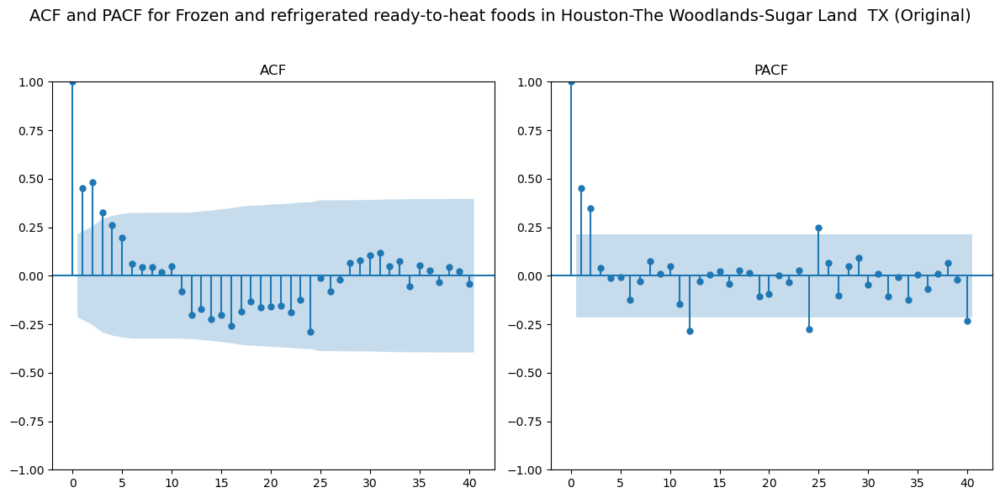


Analyzing Frozen and refrigerated ready-to-heat foods in Los Angeles-Long Beach-Anaheim  CA...

Stationarity Check for Frozen and refrigerated ready-to-heat foods in Los Angeles-Long Beach-Anaheim  CA (Original):
ADF Statistic: -3.0923
p-value: 0.0271
The data is stationary.
Plotting ACF and PACF for original data of Frozen and refrigerated ready-to-heat foods in Los Angeles-Long Beach-Anaheim  CA...


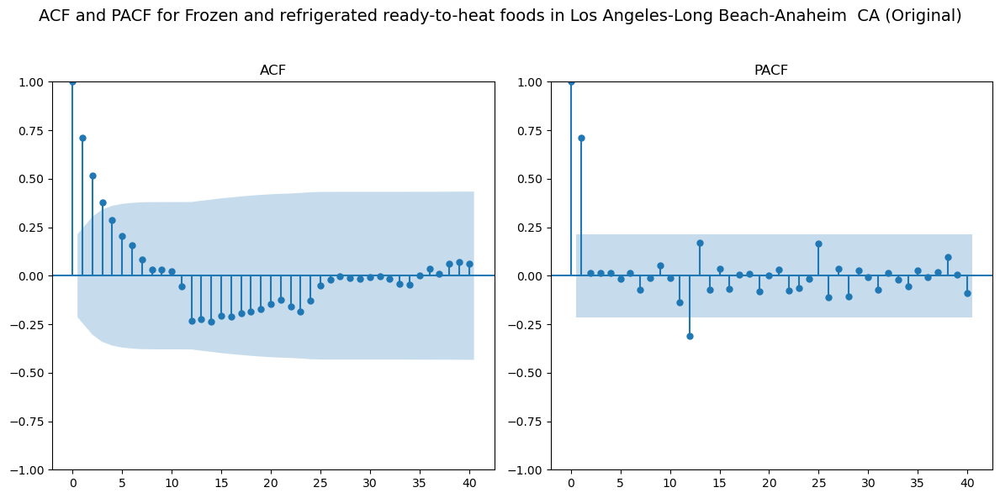


Analyzing Frozen and refrigerated ready-to-heat foods in Miami-Fort Lauderdale-West Palm Beach  FL...

Stationarity Check for Frozen and refrigerated ready-to-heat foods in Miami-Fort Lauderdale-West Palm Beach  FL (Original):
ADF Statistic: -2.6457
p-value: 0.0839
The data is not stationary.
Differencing the data for Frozen and refrigerated ready-to-heat foods in Miami-Fort Lauderdale-West Palm Beach  FL...

Stationarity Check for Frozen and refrigerated ready-to-heat foods in Miami-Fort Lauderdale-West Palm Beach  FL (Differenced):
ADF Statistic: -9.0956
p-value: 0.0000
The data is stationary.
Plotting ACF and PACF for differenced data of Frozen and refrigerated ready-to-heat foods in Miami-Fort Lauderdale-West Palm Beach  FL...


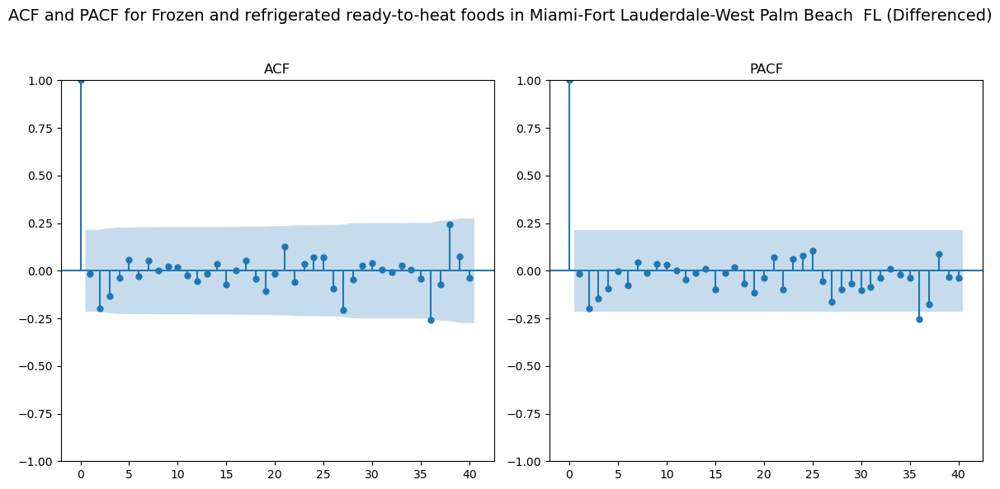


Analyzing Frozen and refrigerated ready-to-heat foods in New York-Newark-Jersey City  NY-NJ-PA...

Stationarity Check for Frozen and refrigerated ready-to-heat foods in New York-Newark-Jersey City  NY-NJ-PA (Original):
ADF Statistic: -4.4511
p-value: 0.0002
The data is stationary.
Plotting ACF and PACF for original data of Frozen and refrigerated ready-to-heat foods in New York-Newark-Jersey City  NY-NJ-PA...


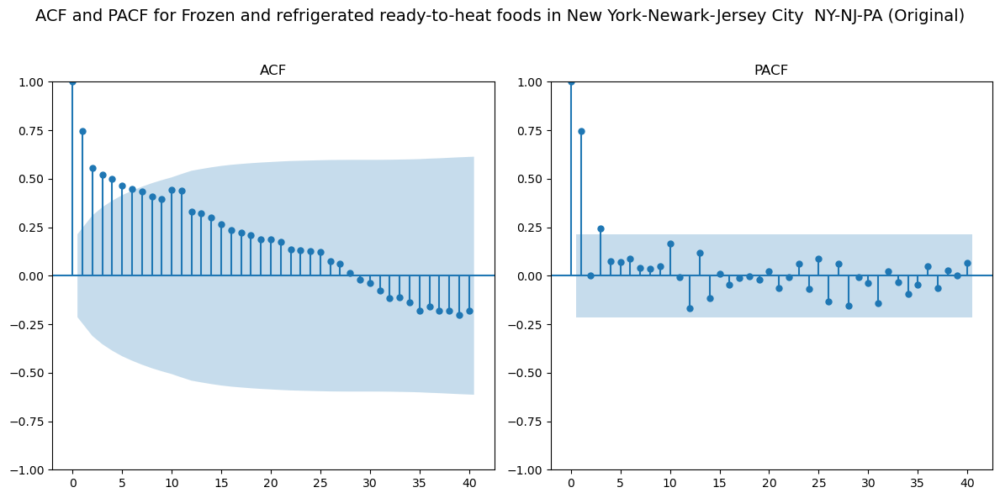


Analyzing Frozen and refrigerated ready-to-heat foods in Philadelphia-Camden-Wilmington  PA-NJ-DE-MD...

Stationarity Check for Frozen and refrigerated ready-to-heat foods in Philadelphia-Camden-Wilmington  PA-NJ-DE-MD (Original):
ADF Statistic: -1.4773
p-value: 0.5447
The data is not stationary.
Differencing the data for Frozen and refrigerated ready-to-heat foods in Philadelphia-Camden-Wilmington  PA-NJ-DE-MD...

Stationarity Check for Frozen and refrigerated ready-to-heat foods in Philadelphia-Camden-Wilmington  PA-NJ-DE-MD (Differenced):
ADF Statistic: -14.0597
p-value: 0.0000
The data is stationary.
Plotting ACF and PACF for differenced data of Frozen and refrigerated ready-to-heat foods in Philadelphia-Camden-Wilmington  PA-NJ-DE-MD...


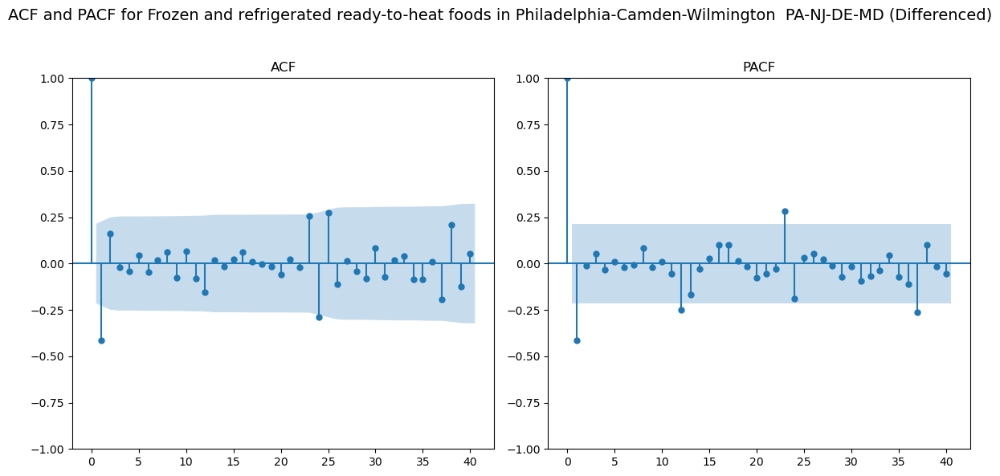


Analyzing Shelf-stable, ready-to-heat foods and soups in Atlanta-Sandy Springs-Roswell  GA...

Stationarity Check for Shelf-stable, ready-to-heat foods and soups in Atlanta-Sandy Springs-Roswell  GA (Original):
ADF Statistic: -3.0068
p-value: 0.0343
The data is stationary.
Plotting ACF and PACF for original data of Shelf-stable, ready-to-heat foods and soups in Atlanta-Sandy Springs-Roswell  GA...


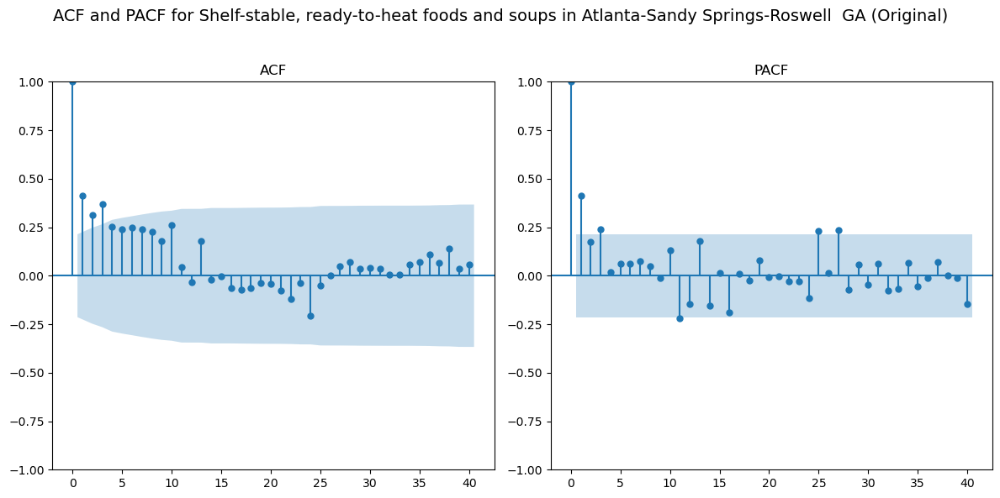


Analyzing Shelf-stable, ready-to-heat foods and soups in Boston-Cambridge-Newton  MA-NH...

Stationarity Check for Shelf-stable, ready-to-heat foods and soups in Boston-Cambridge-Newton  MA-NH (Original):
ADF Statistic: -3.4380
p-value: 0.0097
The data is stationary.
Plotting ACF and PACF for original data of Shelf-stable, ready-to-heat foods and soups in Boston-Cambridge-Newton  MA-NH...


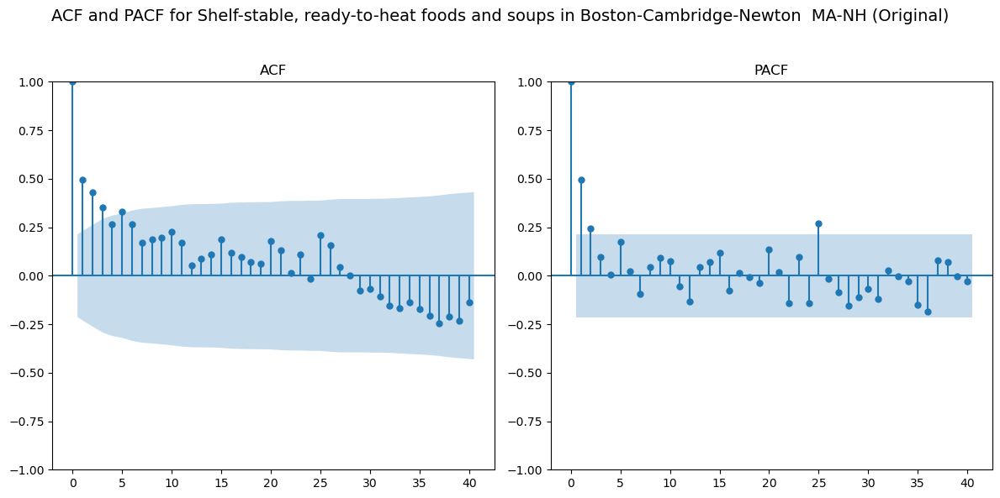


Analyzing Shelf-stable, ready-to-heat foods and soups in Chicago-Naperville-Elgin  IL-IN-WI...

Stationarity Check for Shelf-stable, ready-to-heat foods and soups in Chicago-Naperville-Elgin  IL-IN-WI (Original):
ADF Statistic: -4.1526
p-value: 0.0008
The data is stationary.
Plotting ACF and PACF for original data of Shelf-stable, ready-to-heat foods and soups in Chicago-Naperville-Elgin  IL-IN-WI...


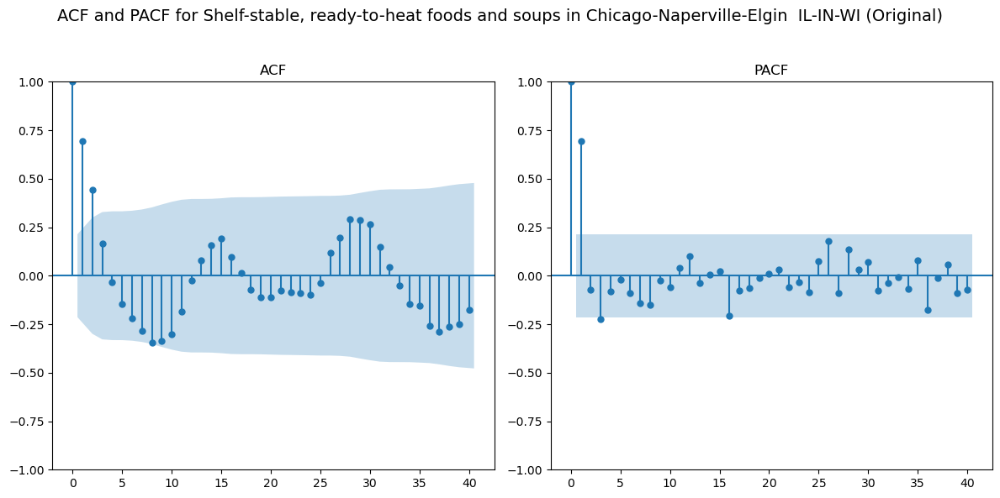


Analyzing Shelf-stable, ready-to-heat foods and soups in Dallas-Fort Worth-Arlington  TX...

Stationarity Check for Shelf-stable, ready-to-heat foods and soups in Dallas-Fort Worth-Arlington  TX (Original):
ADF Statistic: -7.2531
p-value: 0.0000
The data is stationary.
Plotting ACF and PACF for original data of Shelf-stable, ready-to-heat foods and soups in Dallas-Fort Worth-Arlington  TX...


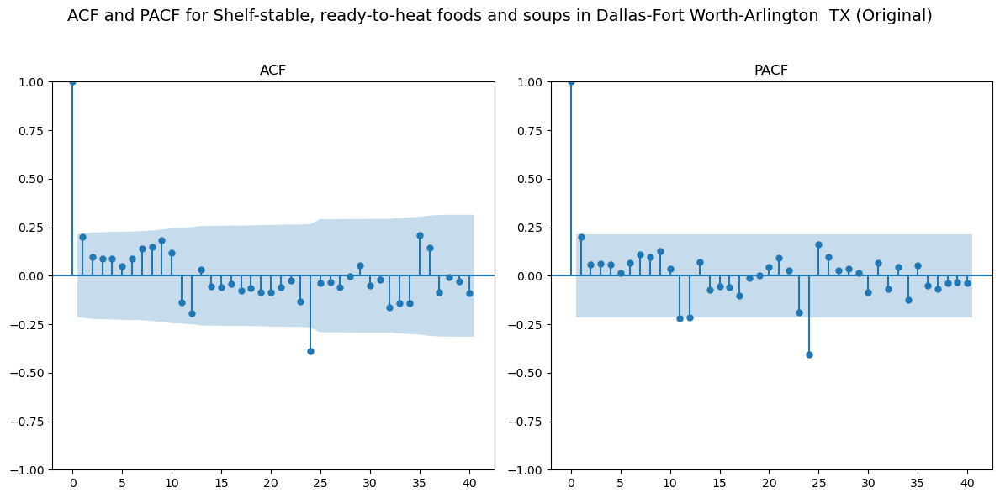


Analyzing Shelf-stable, ready-to-heat foods and soups in Detroit-Warren-Dearborn  MI...

Stationarity Check for Shelf-stable, ready-to-heat foods and soups in Detroit-Warren-Dearborn  MI (Original):
ADF Statistic: -3.5522
p-value: 0.0067
The data is stationary.
Plotting ACF and PACF for original data of Shelf-stable, ready-to-heat foods and soups in Detroit-Warren-Dearborn  MI...


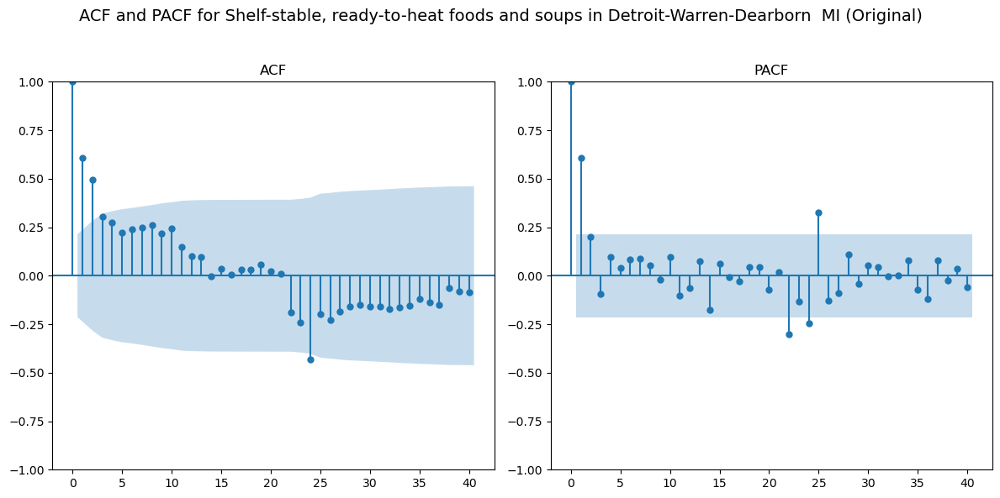


Analyzing Shelf-stable, ready-to-heat foods and soups in Houston-The Woodlands-Sugar Land  TX...

Stationarity Check for Shelf-stable, ready-to-heat foods and soups in Houston-The Woodlands-Sugar Land  TX (Original):
ADF Statistic: -2.9876
p-value: 0.0361
The data is stationary.
Plotting ACF and PACF for original data of Shelf-stable, ready-to-heat foods and soups in Houston-The Woodlands-Sugar Land  TX...


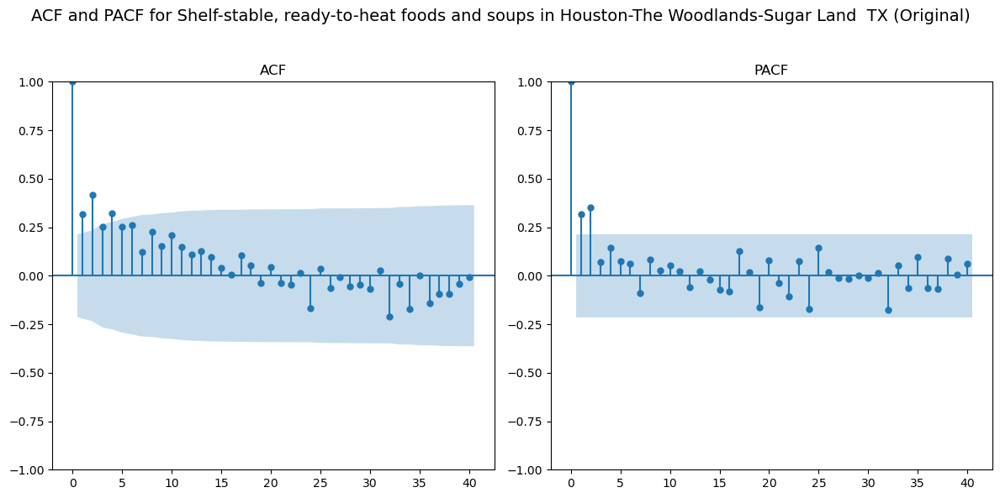


Analyzing Shelf-stable, ready-to-heat foods and soups in Los Angeles-Long Beach-Anaheim  CA...

Stationarity Check for Shelf-stable, ready-to-heat foods and soups in Los Angeles-Long Beach-Anaheim  CA (Original):
ADF Statistic: -4.4515
p-value: 0.0002
The data is stationary.
Plotting ACF and PACF for original data of Shelf-stable, ready-to-heat foods and soups in Los Angeles-Long Beach-Anaheim  CA...


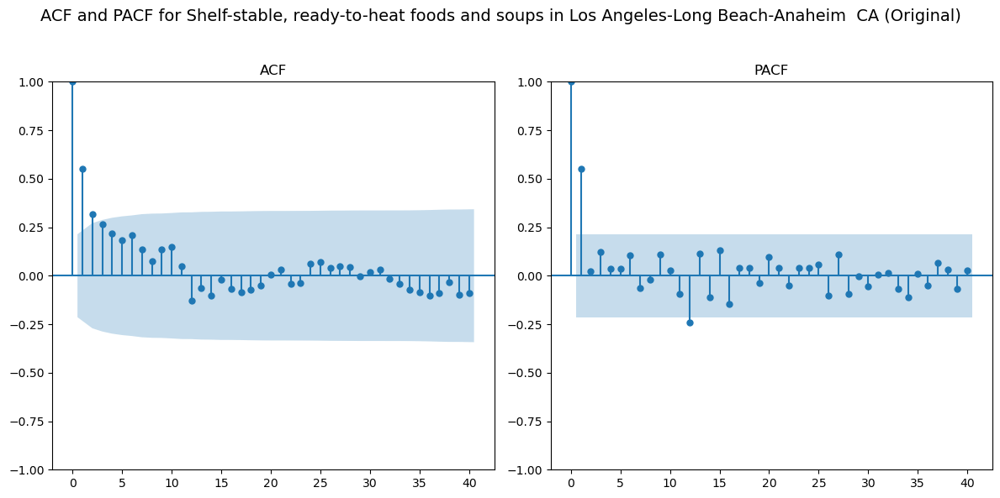


Analyzing Shelf-stable, ready-to-heat foods and soups in Miami-Fort Lauderdale-West Palm Beach  FL...

Stationarity Check for Shelf-stable, ready-to-heat foods and soups in Miami-Fort Lauderdale-West Palm Beach  FL (Original):
ADF Statistic: -3.2482
p-value: 0.0174
The data is stationary.
Plotting ACF and PACF for original data of Shelf-stable, ready-to-heat foods and soups in Miami-Fort Lauderdale-West Palm Beach  FL...


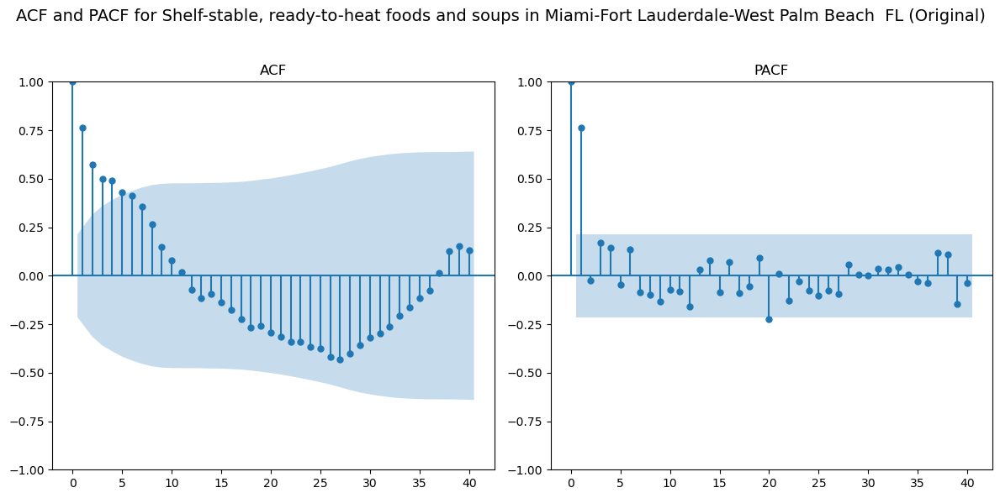


Analyzing Shelf-stable, ready-to-heat foods and soups in New York-Newark-Jersey City  NY-NJ-PA...

Stationarity Check for Shelf-stable, ready-to-heat foods and soups in New York-Newark-Jersey City  NY-NJ-PA (Original):
ADF Statistic: -3.5448
p-value: 0.0069
The data is stationary.
Plotting ACF and PACF for original data of Shelf-stable, ready-to-heat foods and soups in New York-Newark-Jersey City  NY-NJ-PA...


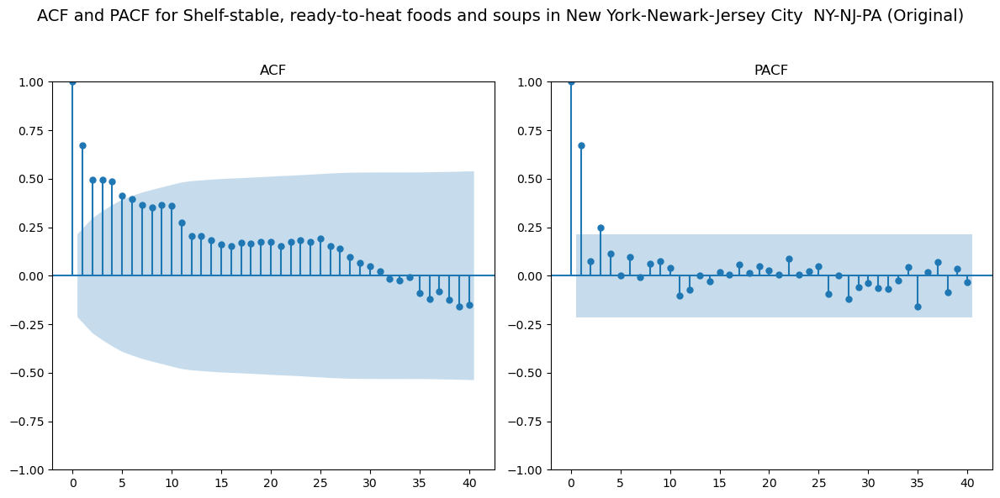


Analyzing Shelf-stable, ready-to-heat foods and soups in Philadelphia-Camden-Wilmington  PA-NJ-DE-MD...

Stationarity Check for Shelf-stable, ready-to-heat foods and soups in Philadelphia-Camden-Wilmington  PA-NJ-DE-MD (Original):
ADF Statistic: -6.0224
p-value: 0.0000
The data is stationary.
Plotting ACF and PACF for original data of Shelf-stable, ready-to-heat foods and soups in Philadelphia-Camden-Wilmington  PA-NJ-DE-MD...


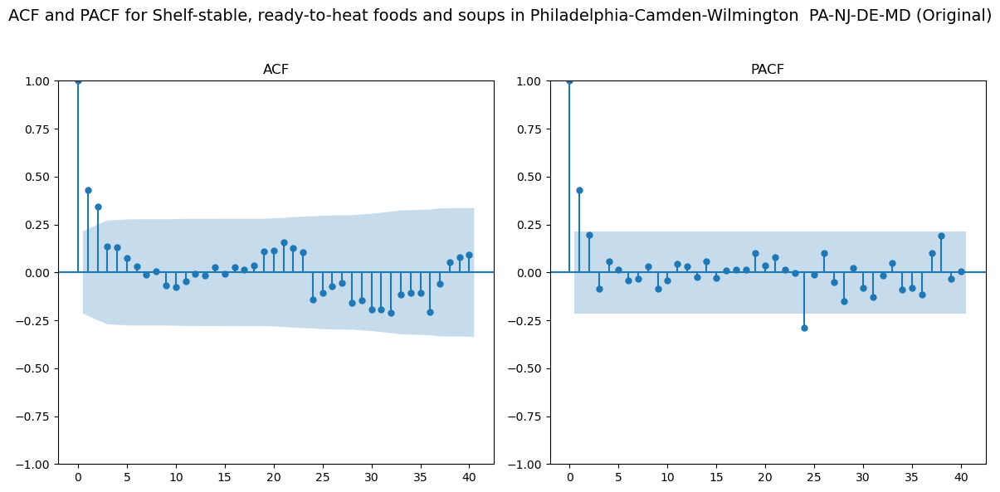


Analyzing Low-calorie beverages in Atlanta-Sandy Springs-Roswell  GA...

Stationarity Check for Low-calorie beverages in Atlanta-Sandy Springs-Roswell  GA (Original):
ADF Statistic: -2.6164
p-value: 0.0897
The data is not stationary.
Differencing the data for Low-calorie beverages in Atlanta-Sandy Springs-Roswell  GA...

Stationarity Check for Low-calorie beverages in Atlanta-Sandy Springs-Roswell  GA (Differenced):
ADF Statistic: -14.7295
p-value: 0.0000
The data is stationary.
Plotting ACF and PACF for differenced data of Low-calorie beverages in Atlanta-Sandy Springs-Roswell  GA...


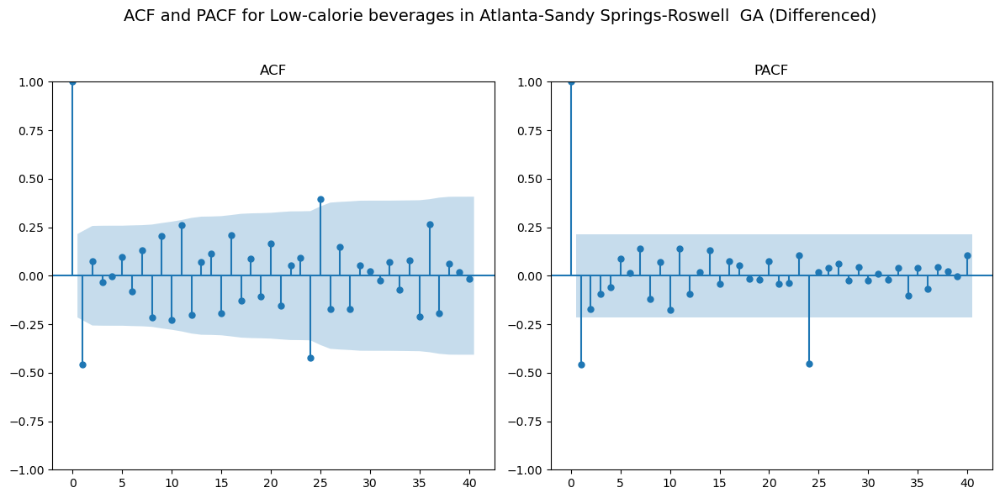


Analyzing Low-calorie beverages in Boston-Cambridge-Newton  MA-NH...

Stationarity Check for Low-calorie beverages in Boston-Cambridge-Newton  MA-NH (Original):
ADF Statistic: -1.7584
p-value: 0.4013
The data is not stationary.
Differencing the data for Low-calorie beverages in Boston-Cambridge-Newton  MA-NH...

Stationarity Check for Low-calorie beverages in Boston-Cambridge-Newton  MA-NH (Differenced):
ADF Statistic: -15.3994
p-value: 0.0000
The data is stationary.
Plotting ACF and PACF for differenced data of Low-calorie beverages in Boston-Cambridge-Newton  MA-NH...


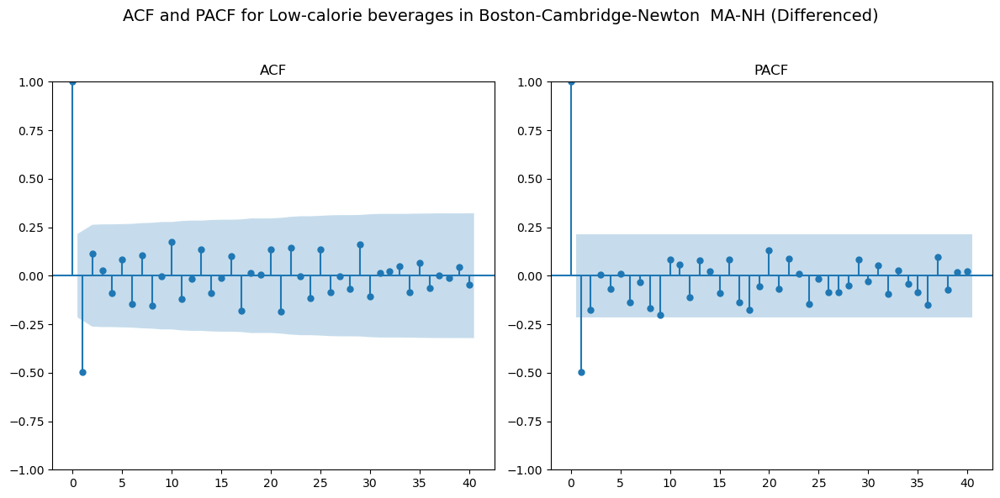


Analyzing Low-calorie beverages in Chicago-Naperville-Elgin  IL-IN-WI...

Stationarity Check for Low-calorie beverages in Chicago-Naperville-Elgin  IL-IN-WI (Original):
ADF Statistic: -2.8670
p-value: 0.0493
The data is stationary.
Plotting ACF and PACF for original data of Low-calorie beverages in Chicago-Naperville-Elgin  IL-IN-WI...


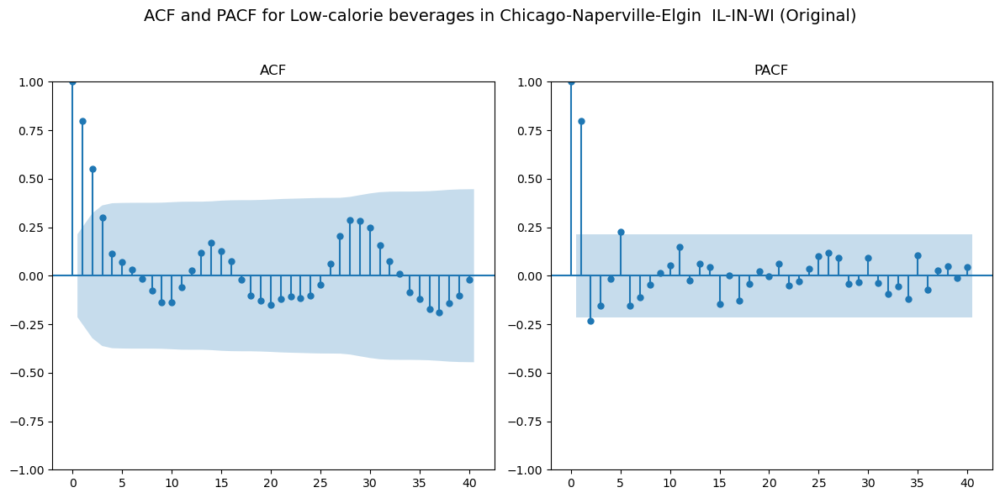


Analyzing Low-calorie beverages in Dallas-Fort Worth-Arlington  TX...

Stationarity Check for Low-calorie beverages in Dallas-Fort Worth-Arlington  TX (Original):
ADF Statistic: -1.9053
p-value: 0.3296
The data is not stationary.
Differencing the data for Low-calorie beverages in Dallas-Fort Worth-Arlington  TX...

Stationarity Check for Low-calorie beverages in Dallas-Fort Worth-Arlington  TX (Differenced):
ADF Statistic: -10.8977
p-value: 0.0000
The data is stationary.
Plotting ACF and PACF for differenced data of Low-calorie beverages in Dallas-Fort Worth-Arlington  TX...


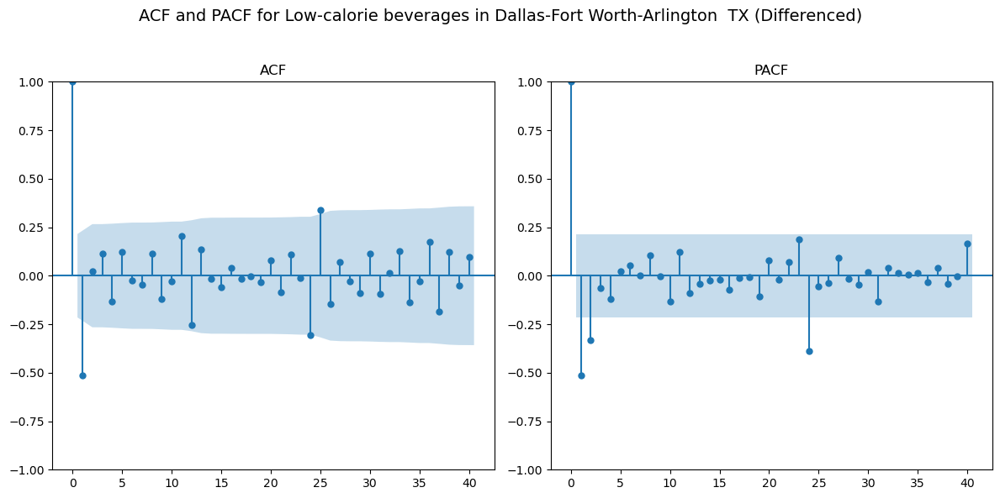


Analyzing Low-calorie beverages in Detroit-Warren-Dearborn  MI...

Stationarity Check for Low-calorie beverages in Detroit-Warren-Dearborn  MI (Original):
ADF Statistic: -3.0817
p-value: 0.0279
The data is stationary.
Plotting ACF and PACF for original data of Low-calorie beverages in Detroit-Warren-Dearborn  MI...


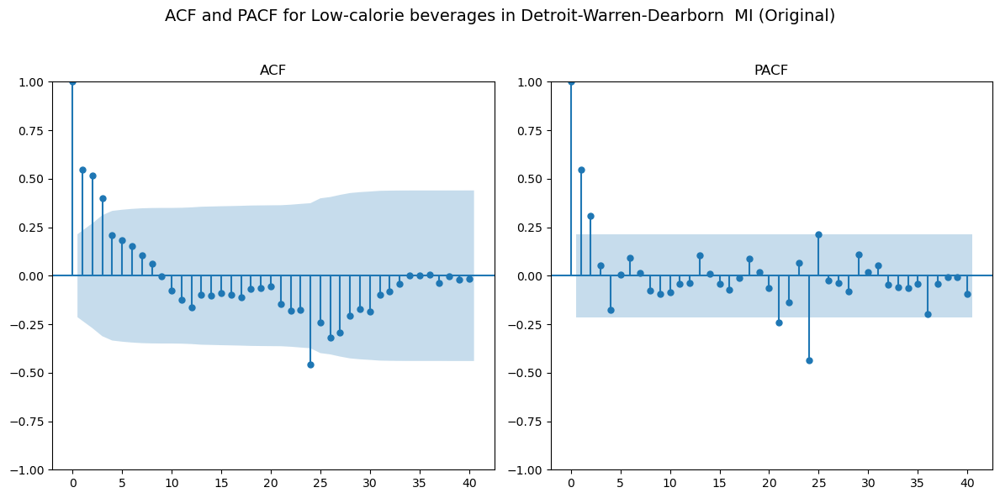


Analyzing Low-calorie beverages in Houston-The Woodlands-Sugar Land  TX...

Stationarity Check for Low-calorie beverages in Houston-The Woodlands-Sugar Land  TX (Original):
ADF Statistic: -1.1881
p-value: 0.6787
The data is not stationary.
Differencing the data for Low-calorie beverages in Houston-The Woodlands-Sugar Land  TX...

Stationarity Check for Low-calorie beverages in Houston-The Woodlands-Sugar Land  TX (Differenced):
ADF Statistic: -9.5211
p-value: 0.0000
The data is stationary.
Plotting ACF and PACF for differenced data of Low-calorie beverages in Houston-The Woodlands-Sugar Land  TX...


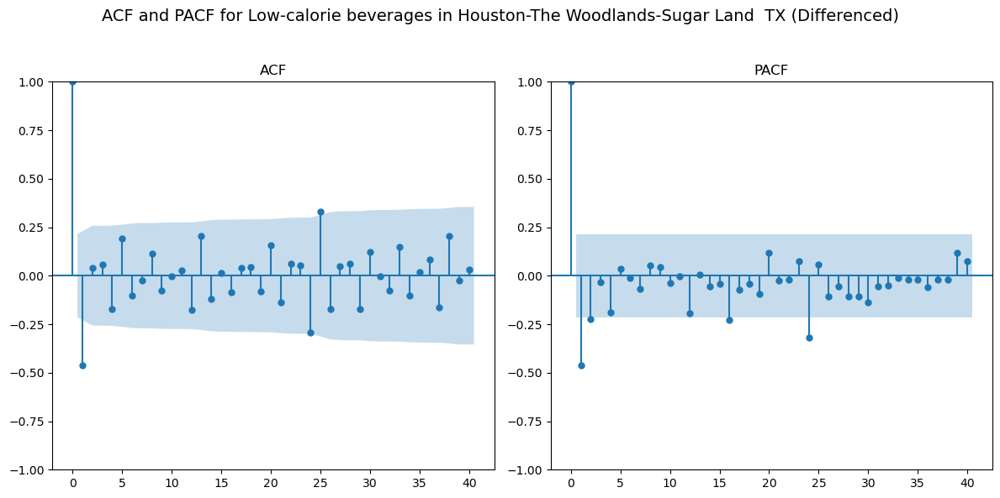


Analyzing Low-calorie beverages in Los Angeles-Long Beach-Anaheim  CA...

Stationarity Check for Low-calorie beverages in Los Angeles-Long Beach-Anaheim  CA (Original):
ADF Statistic: -2.3949
p-value: 0.1432
The data is not stationary.
Differencing the data for Low-calorie beverages in Los Angeles-Long Beach-Anaheim  CA...

Stationarity Check for Low-calorie beverages in Los Angeles-Long Beach-Anaheim  CA (Differenced):
ADF Statistic: -11.3588
p-value: 0.0000
The data is stationary.
Plotting ACF and PACF for differenced data of Low-calorie beverages in Los Angeles-Long Beach-Anaheim  CA...


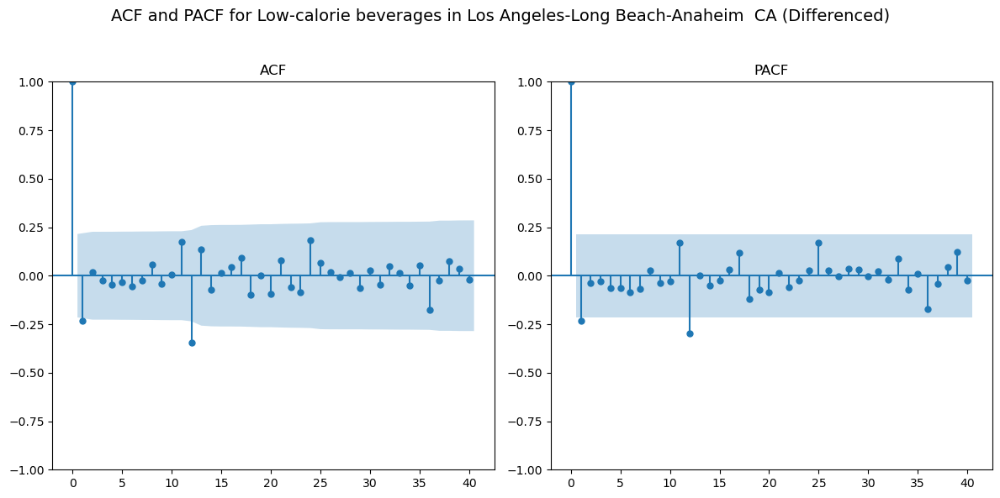


Analyzing Low-calorie beverages in Miami-Fort Lauderdale-West Palm Beach  FL...

Stationarity Check for Low-calorie beverages in Miami-Fort Lauderdale-West Palm Beach  FL (Original):
ADF Statistic: -2.2161
p-value: 0.2005
The data is not stationary.
Differencing the data for Low-calorie beverages in Miami-Fort Lauderdale-West Palm Beach  FL...

Stationarity Check for Low-calorie beverages in Miami-Fort Lauderdale-West Palm Beach  FL (Differenced):
ADF Statistic: -8.0414
p-value: 0.0000
The data is stationary.
Plotting ACF and PACF for differenced data of Low-calorie beverages in Miami-Fort Lauderdale-West Palm Beach  FL...


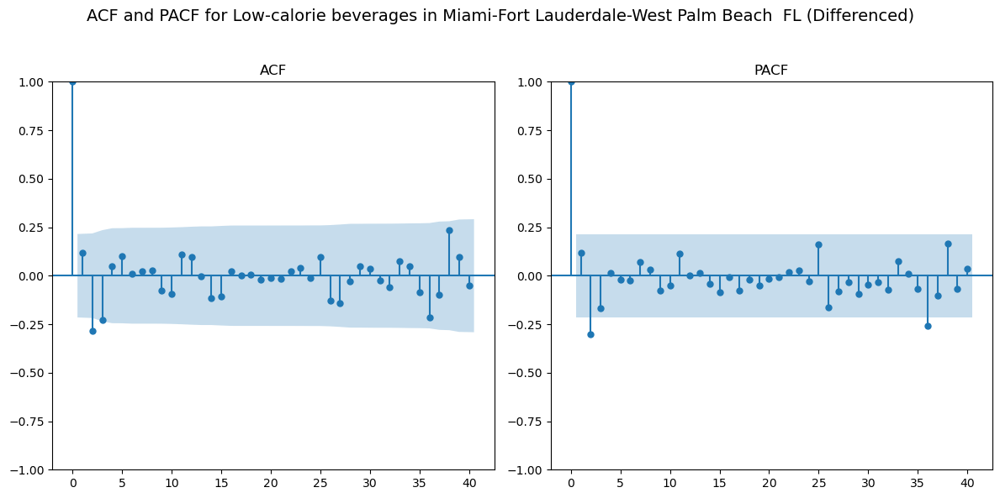


Analyzing Low-calorie beverages in New York-Newark-Jersey City  NY-NJ-PA...

Stationarity Check for Low-calorie beverages in New York-Newark-Jersey City  NY-NJ-PA (Original):
ADF Statistic: -2.8151
p-value: 0.0562
The data is not stationary.
Differencing the data for Low-calorie beverages in New York-Newark-Jersey City  NY-NJ-PA...

Stationarity Check for Low-calorie beverages in New York-Newark-Jersey City  NY-NJ-PA (Differenced):
ADF Statistic: -10.0782
p-value: 0.0000
The data is stationary.
Plotting ACF and PACF for differenced data of Low-calorie beverages in New York-Newark-Jersey City  NY-NJ-PA...


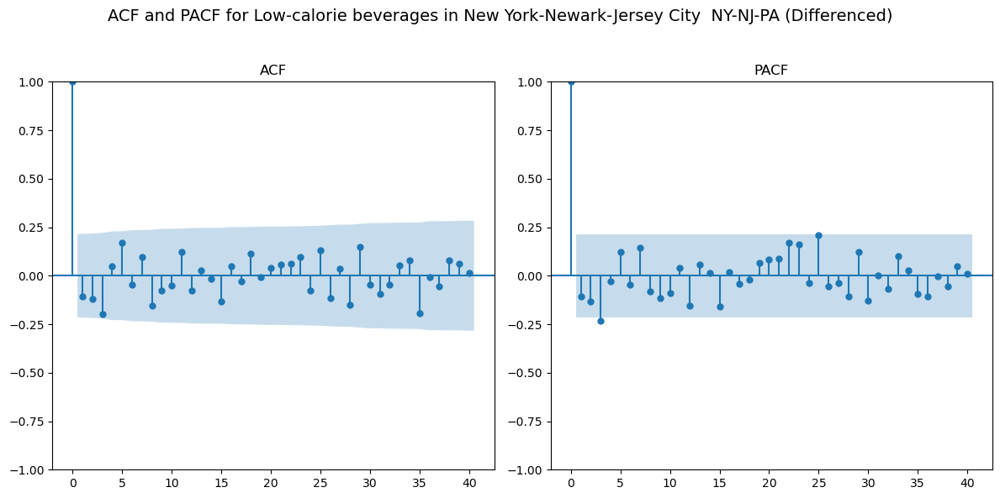


Analyzing Low-calorie beverages in Philadelphia-Camden-Wilmington  PA-NJ-DE-MD...

Stationarity Check for Low-calorie beverages in Philadelphia-Camden-Wilmington  PA-NJ-DE-MD (Original):
ADF Statistic: -1.3631
p-value: 0.5998
The data is not stationary.
Differencing the data for Low-calorie beverages in Philadelphia-Camden-Wilmington  PA-NJ-DE-MD...

Stationarity Check for Low-calorie beverages in Philadelphia-Camden-Wilmington  PA-NJ-DE-MD (Differenced):
ADF Statistic: -3.5770
p-value: 0.0062
The data is stationary.
Plotting ACF and PACF for differenced data of Low-calorie beverages in Philadelphia-Camden-Wilmington  PA-NJ-DE-MD...


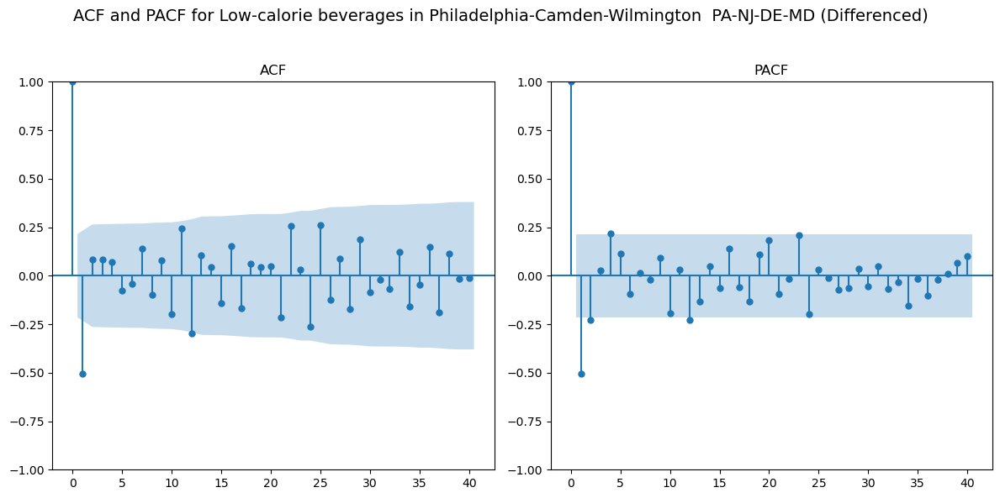


Analyzing All other caloric beverages in Atlanta-Sandy Springs-Roswell  GA...

Stationarity Check for All other caloric beverages in Atlanta-Sandy Springs-Roswell  GA (Original):
ADF Statistic: -2.3205
p-value: 0.1655
The data is not stationary.
Differencing the data for All other caloric beverages in Atlanta-Sandy Springs-Roswell  GA...

Stationarity Check for All other caloric beverages in Atlanta-Sandy Springs-Roswell  GA (Differenced):
ADF Statistic: -9.4168
p-value: 0.0000
The data is stationary.
Plotting ACF and PACF for differenced data of All other caloric beverages in Atlanta-Sandy Springs-Roswell  GA...


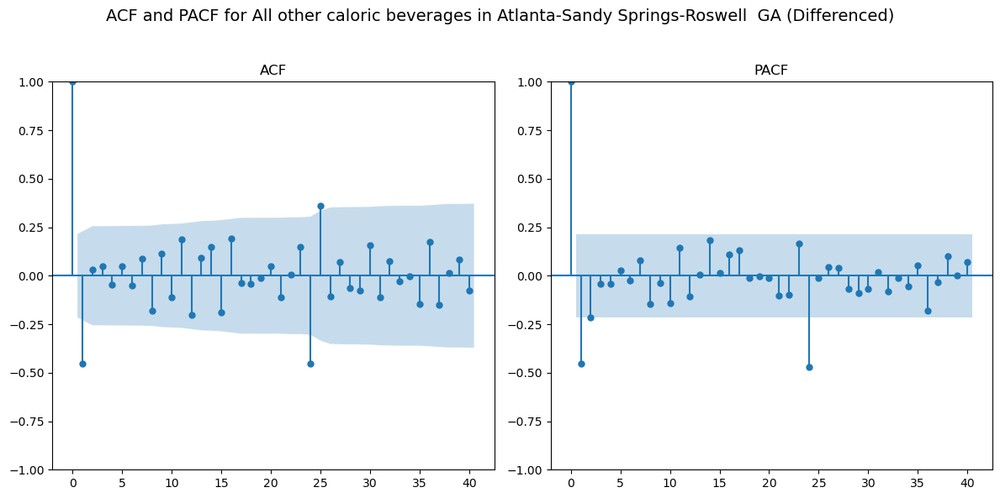


Analyzing All other caloric beverages in Boston-Cambridge-Newton  MA-NH...

Stationarity Check for All other caloric beverages in Boston-Cambridge-Newton  MA-NH (Original):
ADF Statistic: -2.1895
p-value: 0.2101
The data is not stationary.
Differencing the data for All other caloric beverages in Boston-Cambridge-Newton  MA-NH...

Stationarity Check for All other caloric beverages in Boston-Cambridge-Newton  MA-NH (Differenced):
ADF Statistic: -9.6246
p-value: 0.0000
The data is stationary.
Plotting ACF and PACF for differenced data of All other caloric beverages in Boston-Cambridge-Newton  MA-NH...


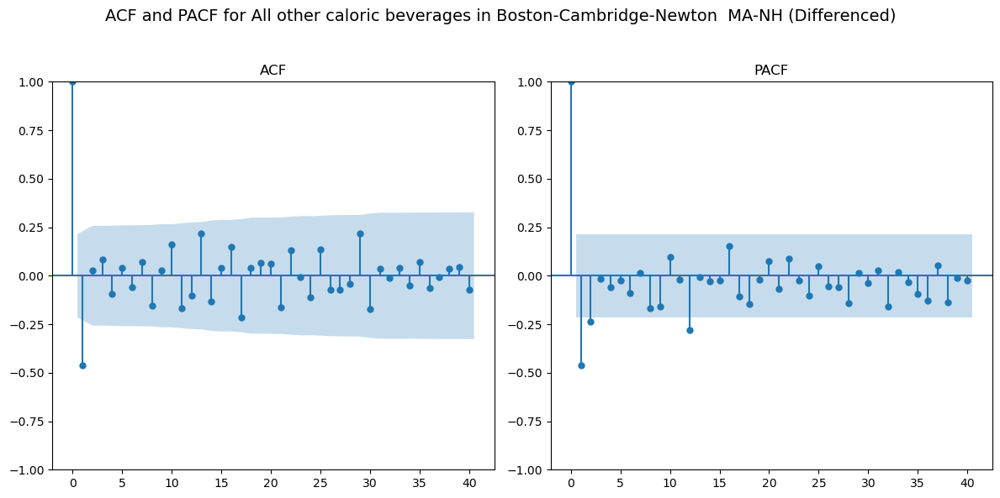


Analyzing All other caloric beverages in Chicago-Naperville-Elgin  IL-IN-WI...

Stationarity Check for All other caloric beverages in Chicago-Naperville-Elgin  IL-IN-WI (Original):
ADF Statistic: -0.8266
p-value: 0.8112
The data is not stationary.
Differencing the data for All other caloric beverages in Chicago-Naperville-Elgin  IL-IN-WI...

Stationarity Check for All other caloric beverages in Chicago-Naperville-Elgin  IL-IN-WI (Differenced):
ADF Statistic: -4.7580
p-value: 0.0001
The data is stationary.
Plotting ACF and PACF for differenced data of All other caloric beverages in Chicago-Naperville-Elgin  IL-IN-WI...


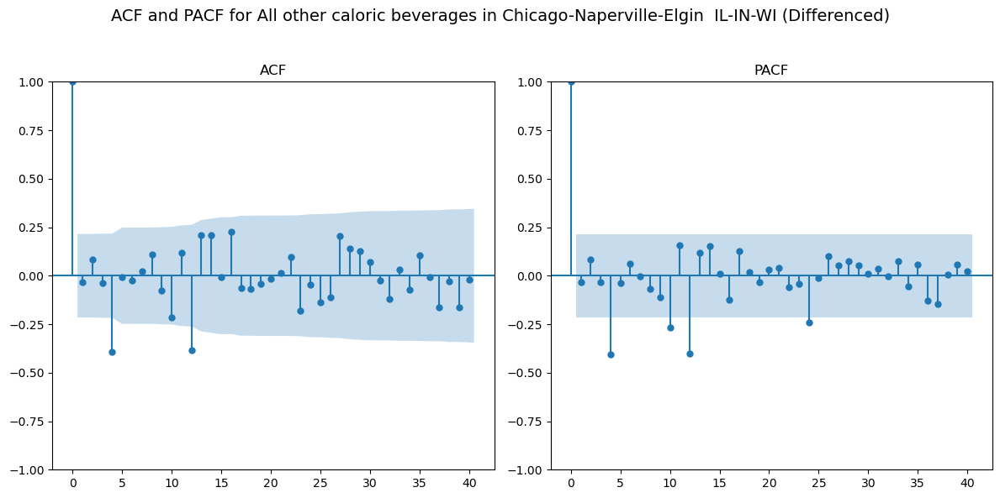


Analyzing All other caloric beverages in Dallas-Fort Worth-Arlington  TX...

Stationarity Check for All other caloric beverages in Dallas-Fort Worth-Arlington  TX (Original):
ADF Statistic: -1.1794
p-value: 0.6824
The data is not stationary.
Differencing the data for All other caloric beverages in Dallas-Fort Worth-Arlington  TX...

Stationarity Check for All other caloric beverages in Dallas-Fort Worth-Arlington  TX (Differenced):
ADF Statistic: -6.8418
p-value: 0.0000
The data is stationary.
Plotting ACF and PACF for differenced data of All other caloric beverages in Dallas-Fort Worth-Arlington  TX...


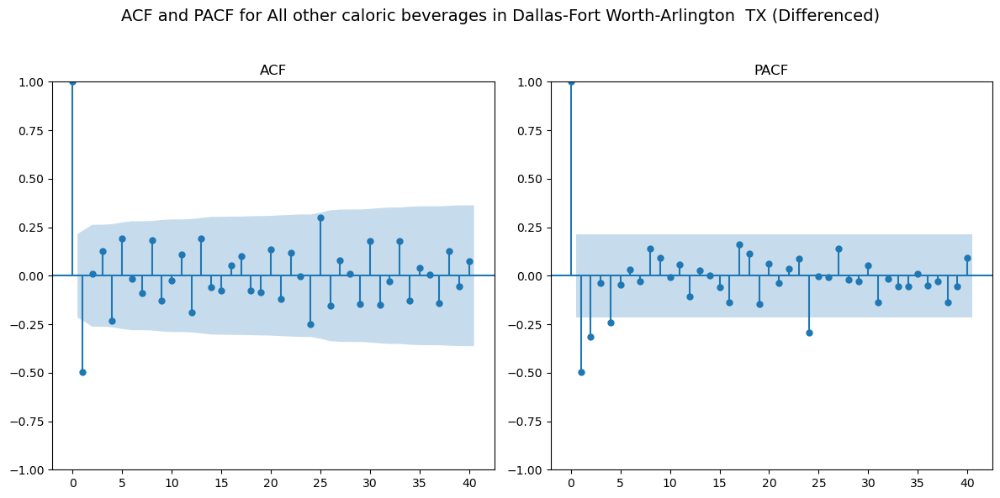


Analyzing All other caloric beverages in Detroit-Warren-Dearborn  MI...

Stationarity Check for All other caloric beverages in Detroit-Warren-Dearborn  MI (Original):
ADF Statistic: -2.5968
p-value: 0.0937
The data is not stationary.
Differencing the data for All other caloric beverages in Detroit-Warren-Dearborn  MI...

Stationarity Check for All other caloric beverages in Detroit-Warren-Dearborn  MI (Differenced):
ADF Statistic: -8.9925
p-value: 0.0000
The data is stationary.
Plotting ACF and PACF for differenced data of All other caloric beverages in Detroit-Warren-Dearborn  MI...


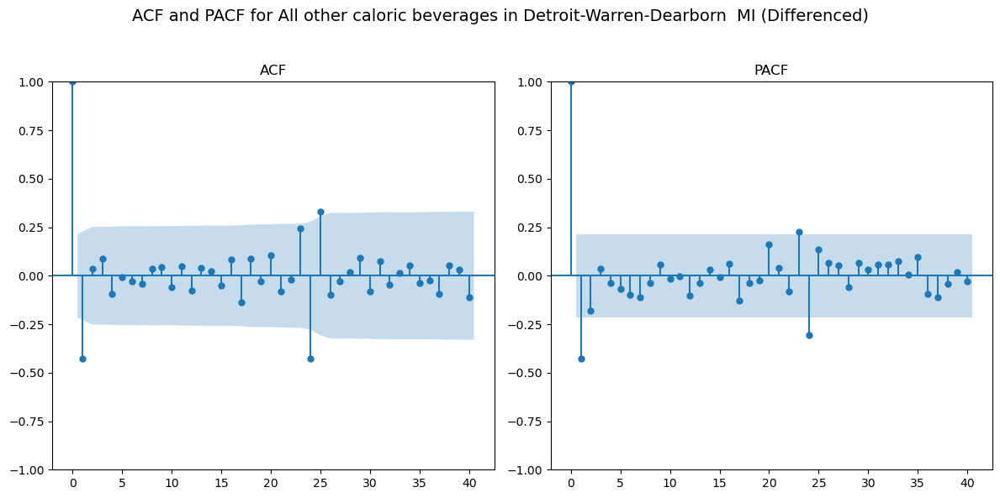


Analyzing All other caloric beverages in Houston-The Woodlands-Sugar Land  TX...

Stationarity Check for All other caloric beverages in Houston-The Woodlands-Sugar Land  TX (Original):
ADF Statistic: -2.7371
p-value: 0.0678
The data is not stationary.
Differencing the data for All other caloric beverages in Houston-The Woodlands-Sugar Land  TX...

Stationarity Check for All other caloric beverages in Houston-The Woodlands-Sugar Land  TX (Differenced):
ADF Statistic: -9.8373
p-value: 0.0000
The data is stationary.
Plotting ACF and PACF for differenced data of All other caloric beverages in Houston-The Woodlands-Sugar Land  TX...


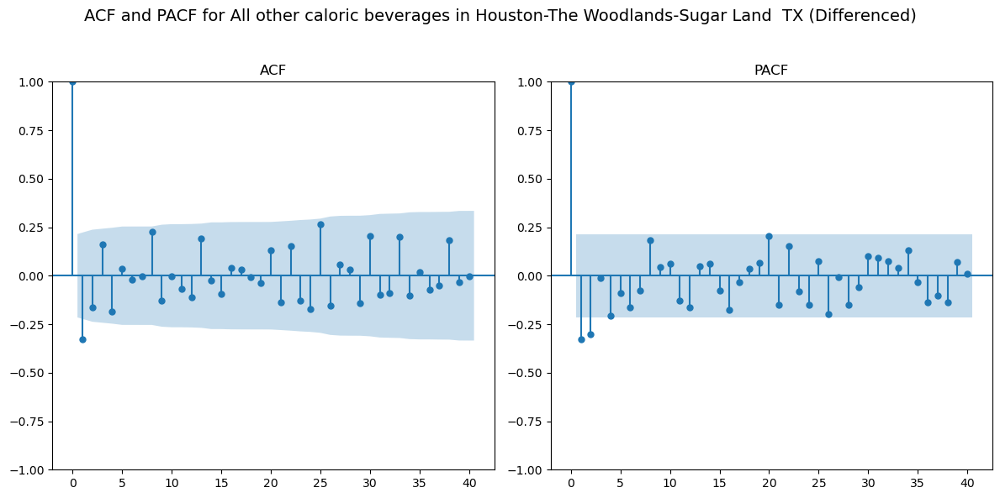


Analyzing All other caloric beverages in Los Angeles-Long Beach-Anaheim  CA...

Stationarity Check for All other caloric beverages in Los Angeles-Long Beach-Anaheim  CA (Original):
ADF Statistic: -2.9744
p-value: 0.0374
The data is stationary.
Plotting ACF and PACF for original data of All other caloric beverages in Los Angeles-Long Beach-Anaheim  CA...


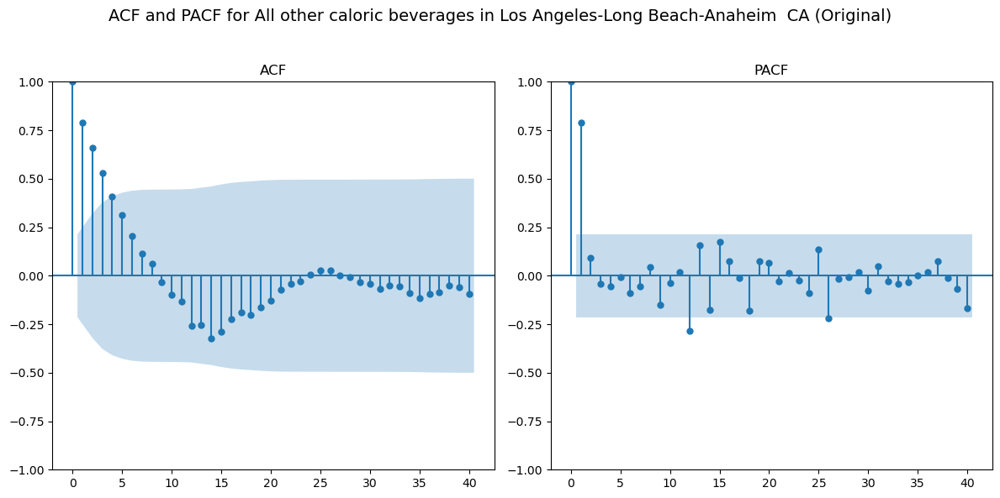


Analyzing All other caloric beverages in Miami-Fort Lauderdale-West Palm Beach  FL...

Stationarity Check for All other caloric beverages in Miami-Fort Lauderdale-West Palm Beach  FL (Original):
ADF Statistic: -1.9289
p-value: 0.3186
The data is not stationary.
Differencing the data for All other caloric beverages in Miami-Fort Lauderdale-West Palm Beach  FL...

Stationarity Check for All other caloric beverages in Miami-Fort Lauderdale-West Palm Beach  FL (Differenced):
ADF Statistic: -7.8689
p-value: 0.0000
The data is stationary.
Plotting ACF and PACF for differenced data of All other caloric beverages in Miami-Fort Lauderdale-West Palm Beach  FL...


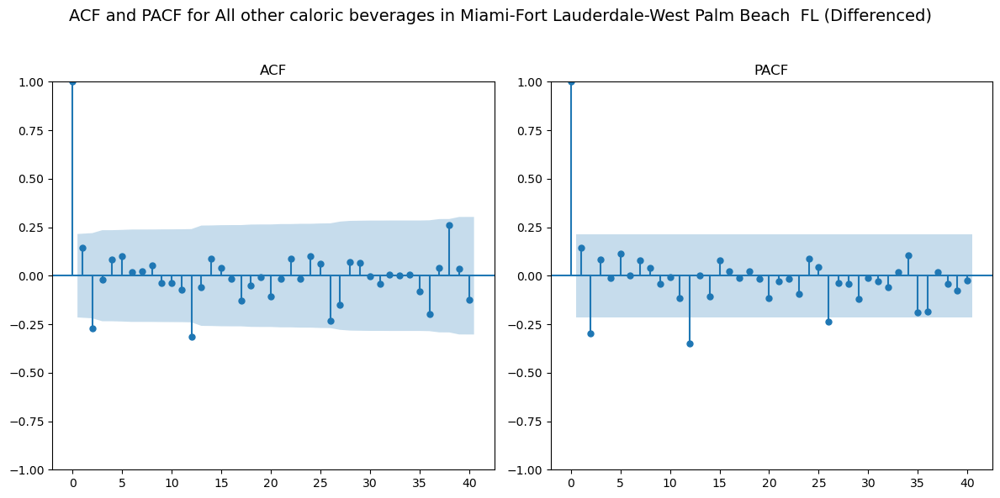


Analyzing All other caloric beverages in New York-Newark-Jersey City  NY-NJ-PA...

Stationarity Check for All other caloric beverages in New York-Newark-Jersey City  NY-NJ-PA (Original):
ADF Statistic: -1.6128
p-value: 0.4765
The data is not stationary.
Differencing the data for All other caloric beverages in New York-Newark-Jersey City  NY-NJ-PA...

Stationarity Check for All other caloric beverages in New York-Newark-Jersey City  NY-NJ-PA (Differenced):
ADF Statistic: -8.9972
p-value: 0.0000
The data is stationary.
Plotting ACF and PACF for differenced data of All other caloric beverages in New York-Newark-Jersey City  NY-NJ-PA...


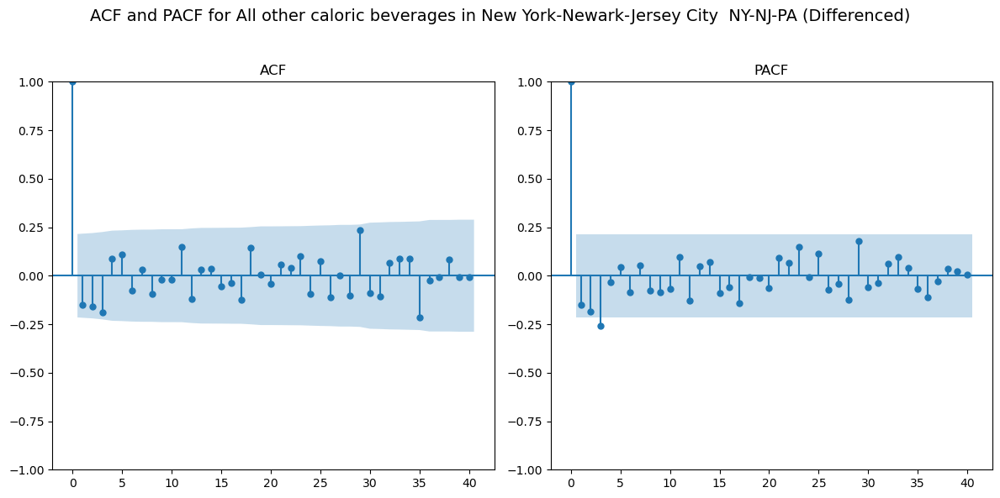


Analyzing All other caloric beverages in Philadelphia-Camden-Wilmington  PA-NJ-DE-MD...

Stationarity Check for All other caloric beverages in Philadelphia-Camden-Wilmington  PA-NJ-DE-MD (Original):
ADF Statistic: -1.5986
p-value: 0.4843
The data is not stationary.
Differencing the data for All other caloric beverages in Philadelphia-Camden-Wilmington  PA-NJ-DE-MD...

Stationarity Check for All other caloric beverages in Philadelphia-Camden-Wilmington  PA-NJ-DE-MD (Differenced):
ADF Statistic: -8.6465
p-value: 0.0000
The data is stationary.
Plotting ACF and PACF for differenced data of All other caloric beverages in Philadelphia-Camden-Wilmington  PA-NJ-DE-MD...


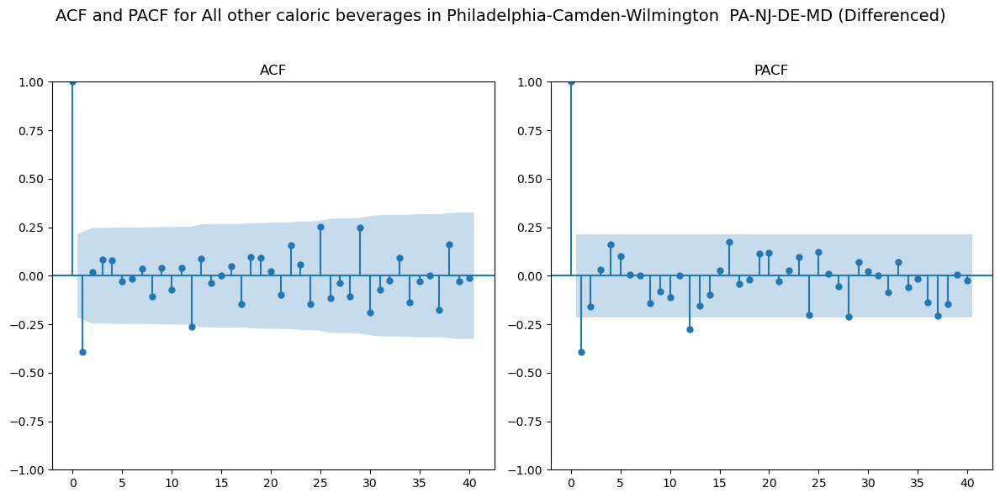


Analyzing Alcohol in Atlanta-Sandy Springs-Roswell  GA...

Stationarity Check for Alcohol in Atlanta-Sandy Springs-Roswell  GA (Original):
ADF Statistic: -1.7280
p-value: 0.4167
The data is not stationary.
Differencing the data for Alcohol in Atlanta-Sandy Springs-Roswell  GA...

Stationarity Check for Alcohol in Atlanta-Sandy Springs-Roswell  GA (Differenced):
ADF Statistic: -13.3355
p-value: 0.0000
The data is stationary.
Plotting ACF and PACF for differenced data of Alcohol in Atlanta-Sandy Springs-Roswell  GA...


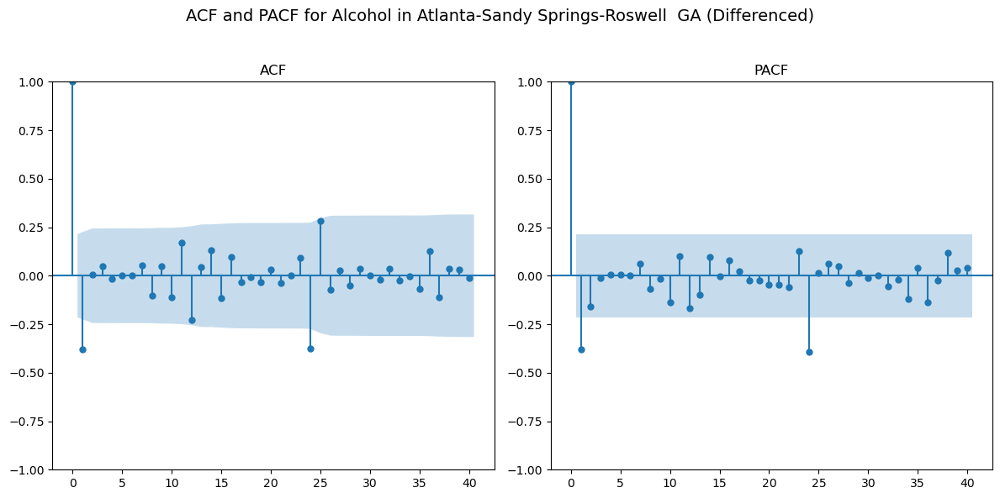


Analyzing Alcohol in Boston-Cambridge-Newton  MA-NH...

Stationarity Check for Alcohol in Boston-Cambridge-Newton  MA-NH (Original):
ADF Statistic: -1.6131
p-value: 0.4763
The data is not stationary.
Differencing the data for Alcohol in Boston-Cambridge-Newton  MA-NH...

Stationarity Check for Alcohol in Boston-Cambridge-Newton  MA-NH (Differenced):
ADF Statistic: -9.6392
p-value: 0.0000
The data is stationary.
Plotting ACF and PACF for differenced data of Alcohol in Boston-Cambridge-Newton  MA-NH...


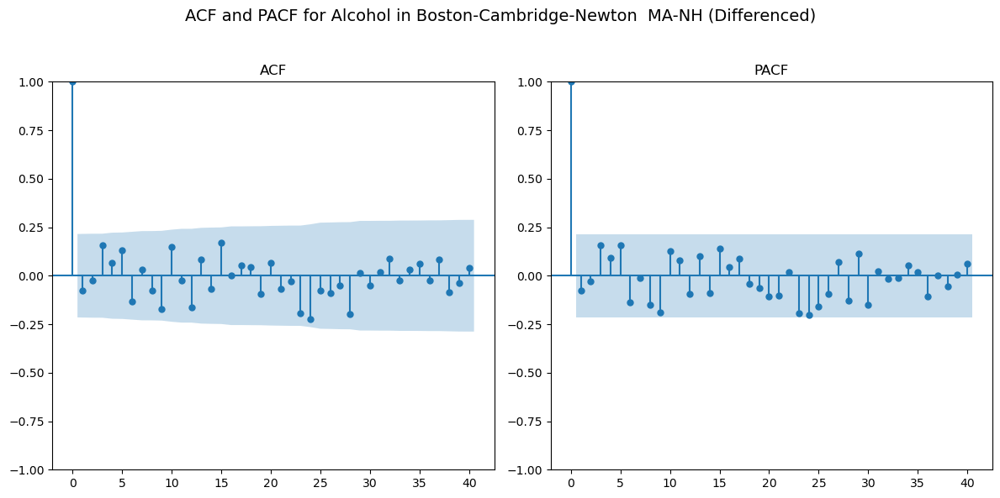


Analyzing Alcohol in Chicago-Naperville-Elgin  IL-IN-WI...

Stationarity Check for Alcohol in Chicago-Naperville-Elgin  IL-IN-WI (Original):
ADF Statistic: -4.5165
p-value: 0.0002
The data is stationary.
Plotting ACF and PACF for original data of Alcohol in Chicago-Naperville-Elgin  IL-IN-WI...


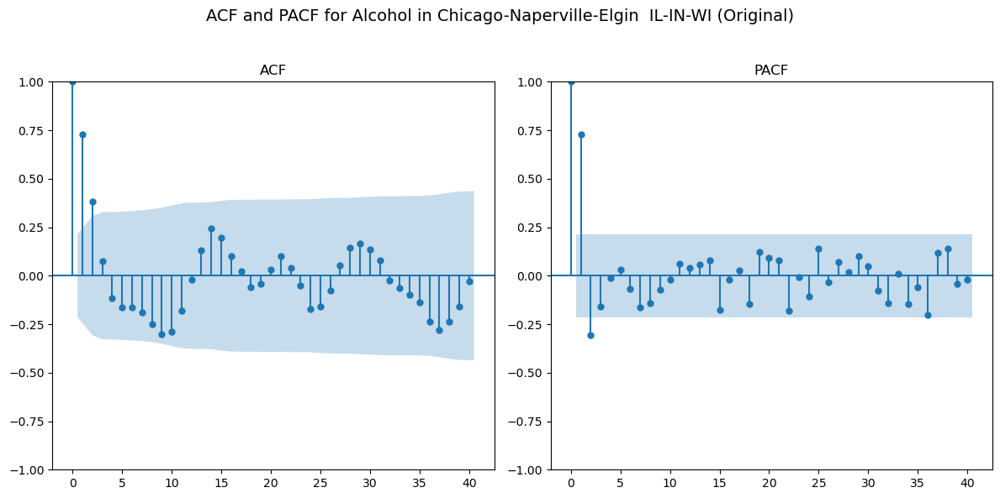


Analyzing Alcohol in Dallas-Fort Worth-Arlington  TX...

Stationarity Check for Alcohol in Dallas-Fort Worth-Arlington  TX (Original):
ADF Statistic: -1.7885
p-value: 0.3862
The data is not stationary.
Differencing the data for Alcohol in Dallas-Fort Worth-Arlington  TX...

Stationarity Check for Alcohol in Dallas-Fort Worth-Arlington  TX (Differenced):
ADF Statistic: -11.5667
p-value: 0.0000
The data is stationary.
Plotting ACF and PACF for differenced data of Alcohol in Dallas-Fort Worth-Arlington  TX...


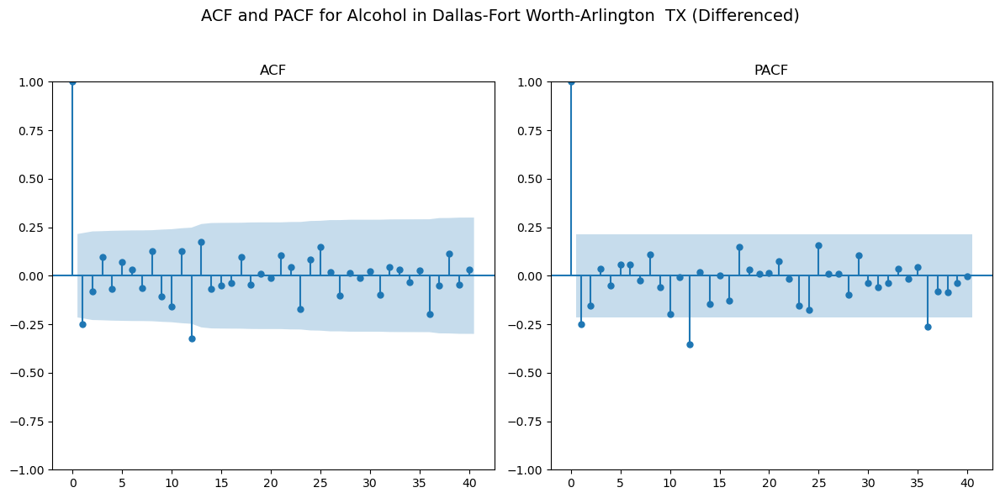


Analyzing Alcohol in Detroit-Warren-Dearborn  MI...

Stationarity Check for Alcohol in Detroit-Warren-Dearborn  MI (Original):
ADF Statistic: -1.8407
p-value: 0.3604
The data is not stationary.
Differencing the data for Alcohol in Detroit-Warren-Dearborn  MI...

Stationarity Check for Alcohol in Detroit-Warren-Dearborn  MI (Differenced):
ADF Statistic: -11.1467
p-value: 0.0000
The data is stationary.
Plotting ACF and PACF for differenced data of Alcohol in Detroit-Warren-Dearborn  MI...


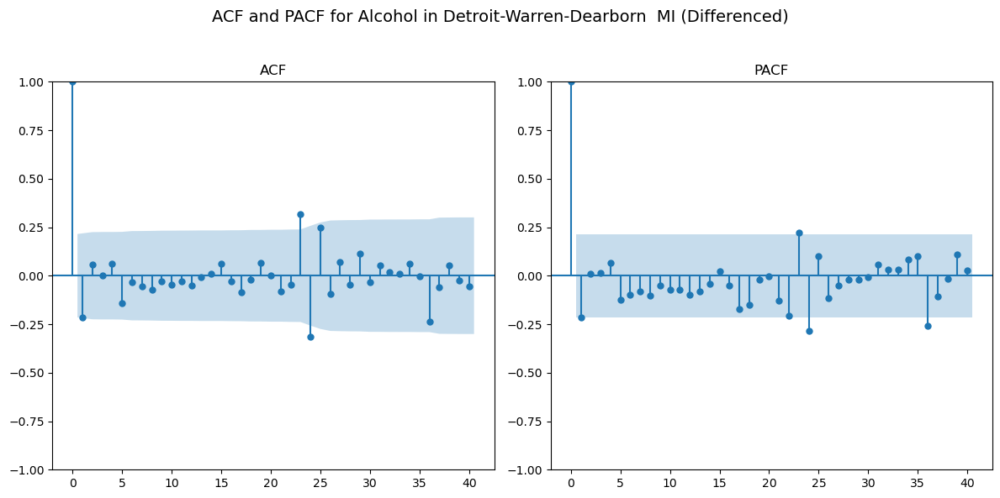


Analyzing Alcohol in Houston-The Woodlands-Sugar Land  TX...

Stationarity Check for Alcohol in Houston-The Woodlands-Sugar Land  TX (Original):
ADF Statistic: -2.5579
p-value: 0.1020
The data is not stationary.
Differencing the data for Alcohol in Houston-The Woodlands-Sugar Land  TX...

Stationarity Check for Alcohol in Houston-The Woodlands-Sugar Land  TX (Differenced):
ADF Statistic: -12.5074
p-value: 0.0000
The data is stationary.
Plotting ACF and PACF for differenced data of Alcohol in Houston-The Woodlands-Sugar Land  TX...


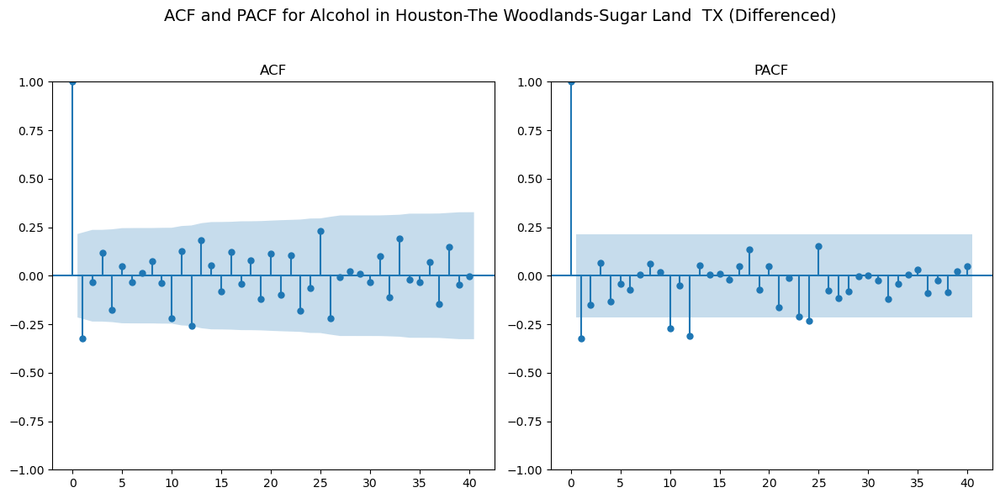


Analyzing Alcohol in Los Angeles-Long Beach-Anaheim  CA...

Stationarity Check for Alcohol in Los Angeles-Long Beach-Anaheim  CA (Original):
ADF Statistic: -2.9109
p-value: 0.0441
The data is stationary.
Plotting ACF and PACF for original data of Alcohol in Los Angeles-Long Beach-Anaheim  CA...


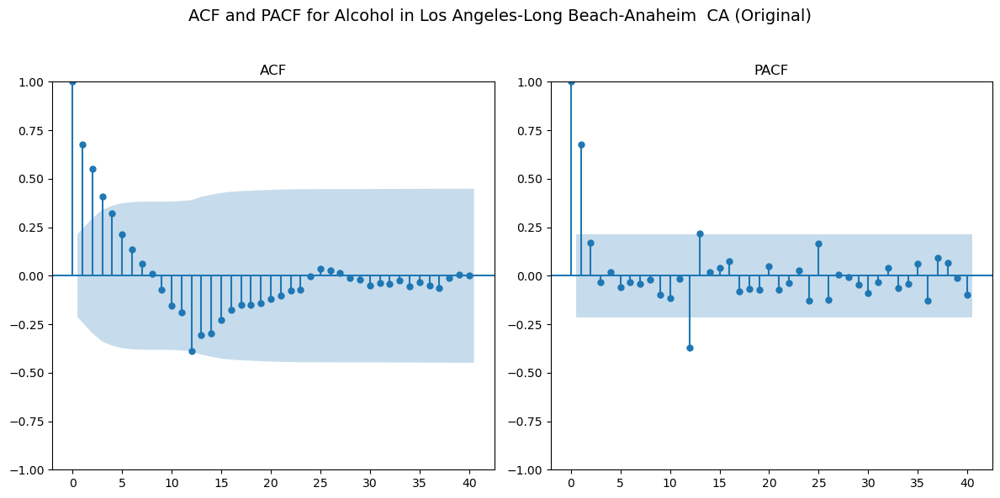


Analyzing Alcohol in Miami-Fort Lauderdale-West Palm Beach  FL...

Stationarity Check for Alcohol in Miami-Fort Lauderdale-West Palm Beach  FL (Original):
ADF Statistic: -2.1367
p-value: 0.2300
The data is not stationary.
Differencing the data for Alcohol in Miami-Fort Lauderdale-West Palm Beach  FL...

Stationarity Check for Alcohol in Miami-Fort Lauderdale-West Palm Beach  FL (Differenced):
ADF Statistic: -7.7960
p-value: 0.0000
The data is stationary.
Plotting ACF and PACF for differenced data of Alcohol in Miami-Fort Lauderdale-West Palm Beach  FL...


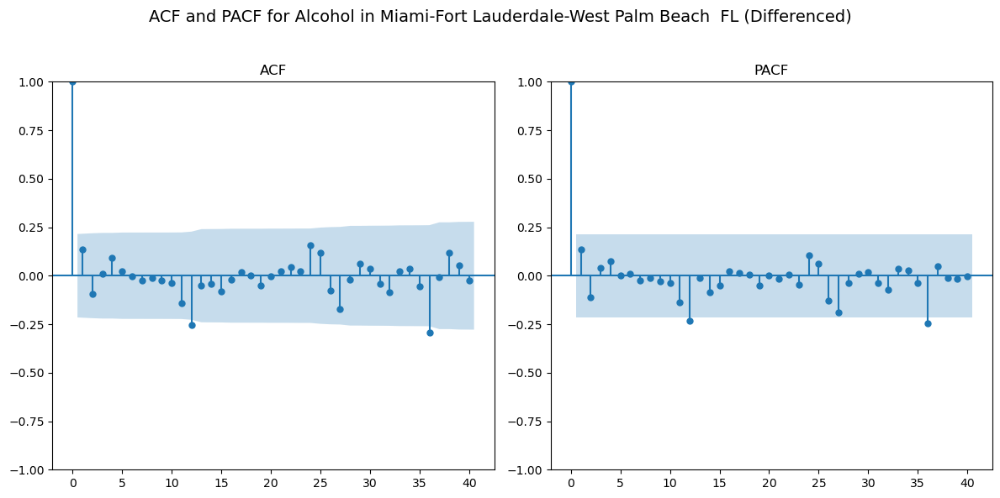


Analyzing Alcohol in New York-Newark-Jersey City  NY-NJ-PA...

Stationarity Check for Alcohol in New York-Newark-Jersey City  NY-NJ-PA (Original):
ADF Statistic: -2.4724
p-value: 0.1223
The data is not stationary.
Differencing the data for Alcohol in New York-Newark-Jersey City  NY-NJ-PA...

Stationarity Check for Alcohol in New York-Newark-Jersey City  NY-NJ-PA (Differenced):
ADF Statistic: -7.5889
p-value: 0.0000
The data is stationary.
Plotting ACF and PACF for differenced data of Alcohol in New York-Newark-Jersey City  NY-NJ-PA...


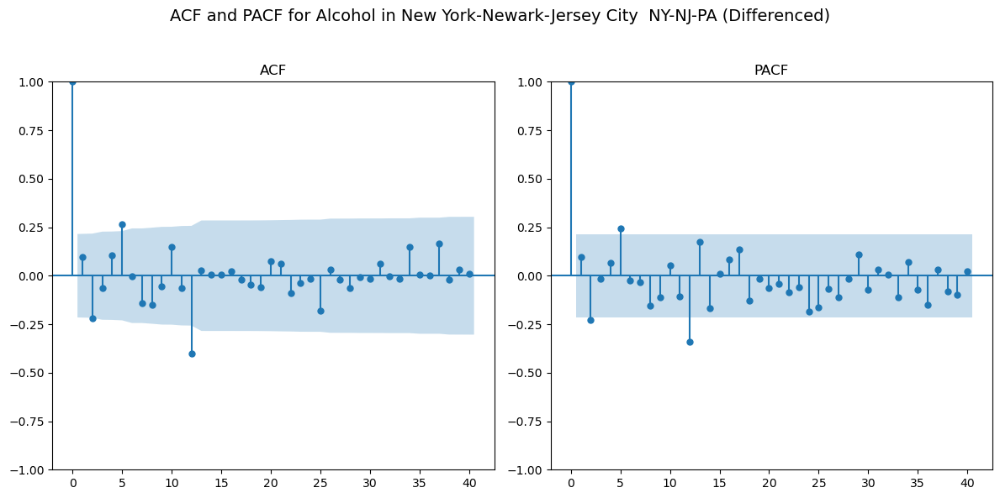


Analyzing Alcohol in Philadelphia-Camden-Wilmington  PA-NJ-DE-MD...

Stationarity Check for Alcohol in Philadelphia-Camden-Wilmington  PA-NJ-DE-MD (Original):
ADF Statistic: 0.2282
p-value: 0.9738
The data is not stationary.
Differencing the data for Alcohol in Philadelphia-Camden-Wilmington  PA-NJ-DE-MD...

Stationarity Check for Alcohol in Philadelphia-Camden-Wilmington  PA-NJ-DE-MD (Differenced):
ADF Statistic: -1.6937
p-value: 0.4343
The data is not stationary.


In [28]:
def make_seasonally_adjusted(data, efpg_name, metroregion_name):
    """
    Create a seasonally adjusted time series for the given EFPG_name and Metroregion_name.
    """
    filtered_data = data[
        (data['EFPG_name'] == efpg_name) & 
        (data['Metroregion_name'] == metroregion_name)
    ]
    time_series = filtered_data.groupby('Date')['Purchase_grams_wtd'].sum()
    time_series = time_series.asfreq('MS').fillna(0)
    decomposition = seasonal_decompose(time_series, model='additive', period=12)
    seasonally_adjusted = time_series - decomposition.seasonal
    return seasonally_adjusted

def check_stationarity(series, title):
    """
    Perform stationarity check using Augmented Dickey-Fuller Test.
    """
    result = adfuller(series.dropna())
    print(f"\nStationarity Check for {title}:")
    print(f"ADF Statistic: {result[0]:.4f}")
    print(f"p-value: {result[1]:.4f}")
    if result[1] <= 0.05:
        print("The data is stationary.")
        return True
    else:
        print("The data is not stationary.")
        return False

def plot_acf_pacf(series, efpg_name, metroregion_name, is_differenced):
    """
    Plot ACF and PACF with customized titles.
    """
    title = f"ACF and PACF for {efpg_name} in {metroregion_name} ({'Differenced' if is_differenced else 'Original'})"
    plt.figure(figsize=(12, 6))
    plt.suptitle(title, fontsize=14)
    plt.subplot(1, 2, 1)
    plot_acf(series.dropna(), lags=40, ax=plt.gca())
    plt.title("ACF")
    plt.subplot(1, 2, 2)
    plot_pacf(series.dropna(), lags=40, ax=plt.gca(), method='ywm')
    plt.title("PACF")
    plt.tight_layout(rect=[0, 0, 1, 0.95])
    plt.show()

def analyze_stationarity(data):
    """
    Analyze stationarity for each EFPG_name and Metroregion_name pair,
    plot ACF and PACF if stationary.
    """
    pairs = data[['EFPG_name', 'Metroregion_name']].drop_duplicates()
    for index, row in pairs.iterrows():
        efpg_name = row['EFPG_name']
        metroregion_name = row['Metroregion_name']
        print(f"\nAnalyzing {efpg_name} in {metroregion_name}...")
        
        # Seasonal adjustment
        seasonally_adjusted = make_seasonally_adjusted(data, efpg_name, metroregion_name)
        
        # Initial stationarity check
        is_stationary = check_stationarity(seasonally_adjusted, f"{efpg_name} in {metroregion_name} (Original)")
        if is_stationary:
            print(f"Plotting ACF and PACF for original data of {efpg_name} in {metroregion_name}...")
            plot_acf_pacf(seasonally_adjusted, efpg_name, metroregion_name, is_differenced=False)
        else:
            print(f"Differencing the data for {efpg_name} in {metroregion_name}...")
            differenced_series = seasonally_adjusted.diff().dropna()
            is_differenced_stationary = check_stationarity(differenced_series, f"{efpg_name} in {metroregion_name} (Differenced)")
            if is_differenced_stationary:
                print(f"Plotting ACF and PACF for differenced data of {efpg_name} in {metroregion_name}...")
                plot_acf_pacf(differenced_series, efpg_name, metroregion_name, is_differenced=True)



# Run the analysis
analyze_stationarity(city_df)


#### After going through ACF and PACF plots the optimal value for most of the city and food category pair is p=1 ,d=1 and q=1

Mean Absolute Error (MAE): 129507886.71
Root Mean Squared Error (RMSE): 159854776.86
Akaike Information Criterion (AIC): 3481.64


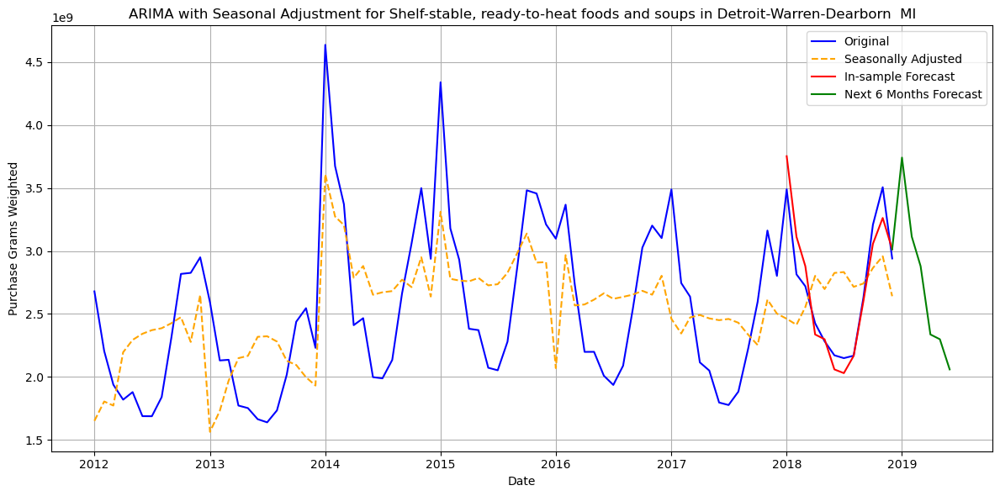

In [29]:
arima_with_custom_order(city_df, 'Shelf-stable, ready-to-heat foods and soups', 'Detroit-Warren-Dearborn  MI', p=1, d=1, q=1, forecast_steps=18)

Mean Absolute Error (MAE): 2821420269.46
Root Mean Squared Error (RMSE): 3354901509.14
Akaike Information Criterion (AIC): 3835.03


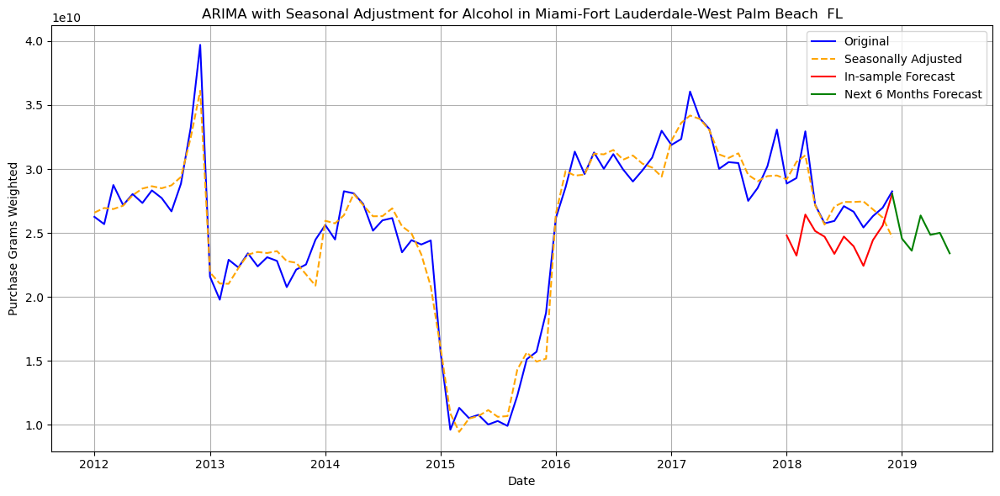

In [30]:
arima_with_custom_order(city_df,'Alcohol','Miami-Fort Lauderdale-West Palm Beach  FL', p=2, d=1, q=2, forecast_steps=18)

Mean Absolute Error (MAE): 2228093789.31
Root Mean Squared Error (RMSE): 2629281897.23
Akaike Information Criterion (AIC): 3961.86


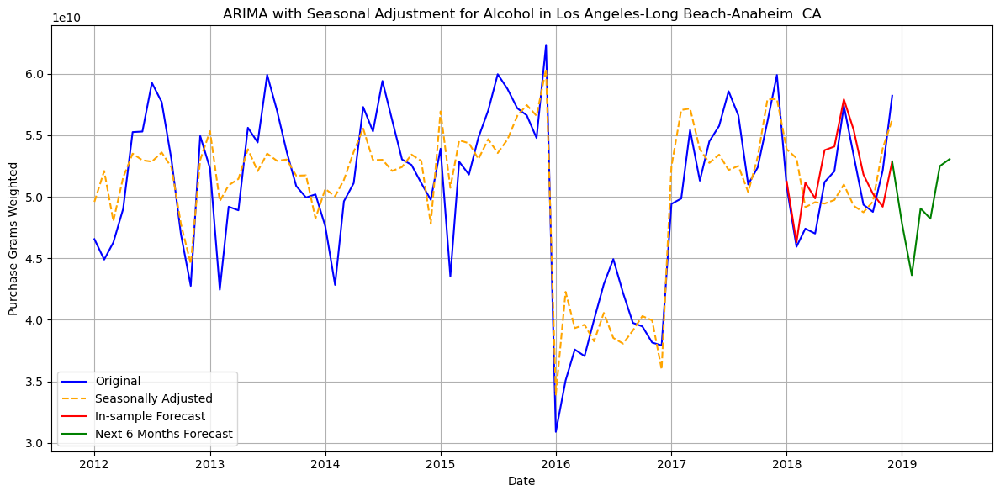

In [31]:
arima_with_custom_order(city_df,'Alcohol','Los Angeles-Long Beach-Anaheim  CA', p=1, d=0, q=1, forecast_steps=18)

Mean Absolute Error (MAE): 403480202.16
Root Mean Squared Error (RMSE): 431686078.40
Akaike Information Criterion (AIC): 3484.01


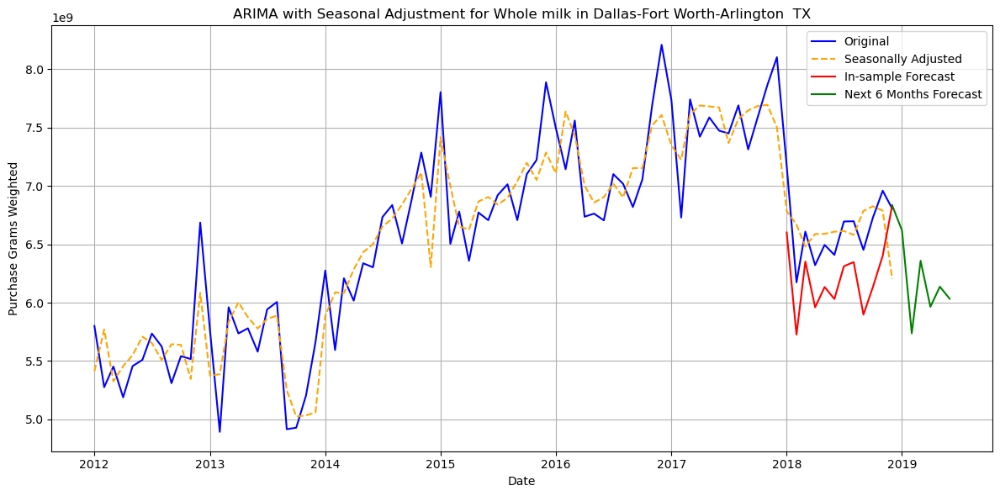

In [32]:
arima_with_custom_order(city_df,'Whole milk','Dallas-Fort Worth-Arlington  TX', p=1, d=1, q=1, forecast_steps=18)

Mean Absolute Error (MAE): 272744219.66
Root Mean Squared Error (RMSE): 351585164.64
Akaike Information Criterion (AIC): 3550.10


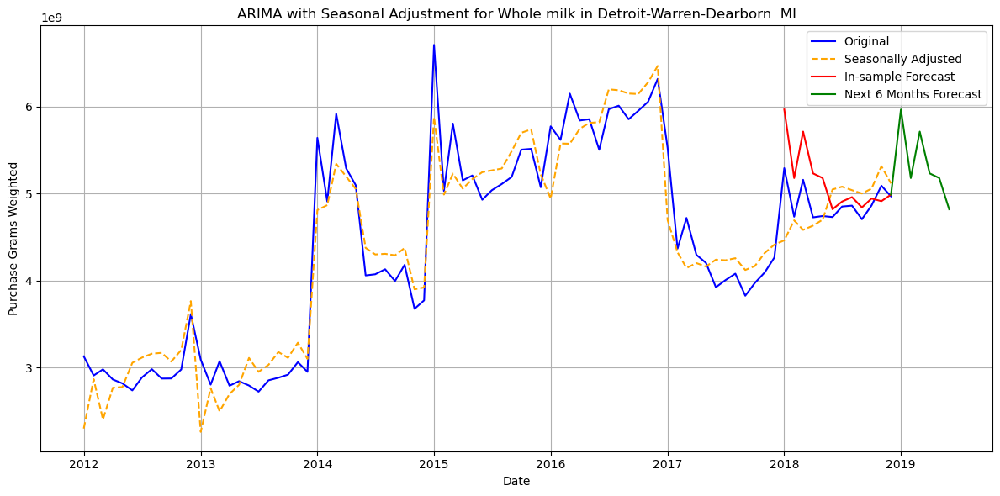

In [33]:
arima_with_custom_order(city_df,'Whole milk','Detroit-Warren-Dearborn  MI', p=1, d=1, q=1, forecast_steps=18)

Mean Absolute Error (MAE): 515122982.50
Root Mean Squared Error (RMSE): 811115253.29
Akaike Information Criterion (AIC): 3687.43


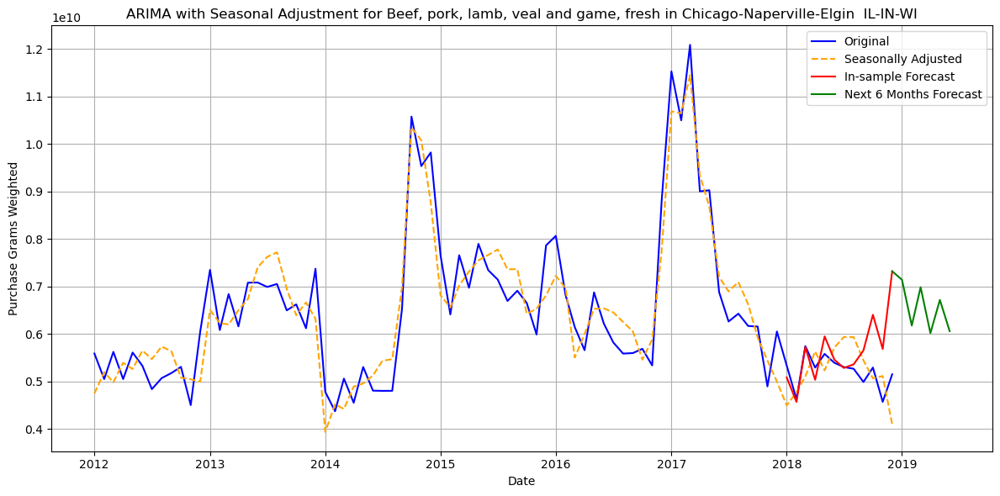

In [34]:
arima_with_custom_order(city_df,'Beef, pork, lamb, veal and game, fresh','Chicago-Naperville-Elgin  IL-IN-WI', p=1, d=0, q=1, forecast_steps=18)

Mean Absolute Error (MAE): 358743287.52
Root Mean Squared Error (RMSE): 406392849.50
Akaike Information Criterion (AIC): 3516.77


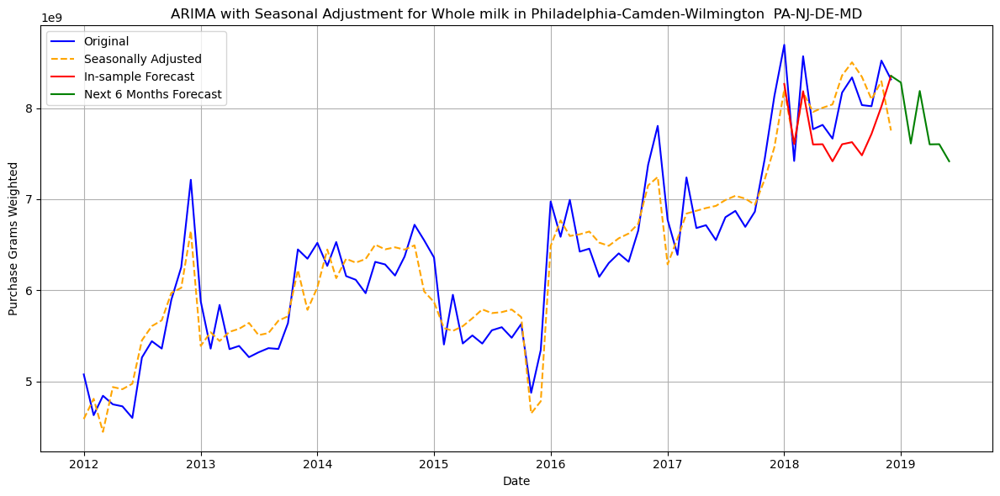

In [35]:
arima_with_custom_order(city_df,'Whole milk','Philadelphia-Camden-Wilmington  PA-NJ-DE-MD', p=1, d=1, q=1, forecast_steps=18)

Mean Absolute Error (MAE): 598781876.84
Root Mean Squared Error (RMSE): 863237772.90
Akaike Information Criterion (AIC): 3799.02


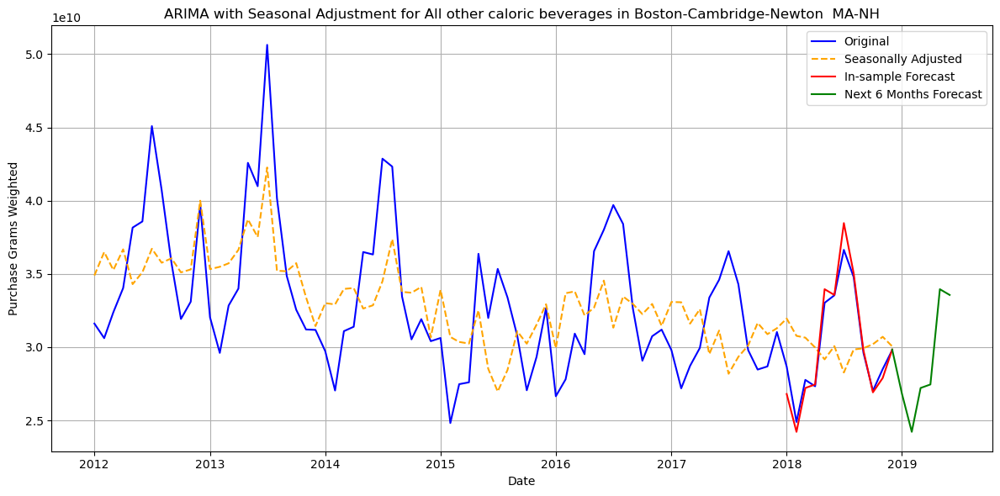

In [36]:
arima_with_custom_order(city_df,'All other caloric beverages','Boston-Cambridge-Newton  MA-NH', p=1, d=1, q=1, forecast_steps=18)